# Question 1

Pick an online or physical network (choose one with ~1k-10k nodes). See Datasets (Module 1). Submit code or link of code. \
Provide a good visualization of your network. \
Find the characteristics of your network (centralities). \
Answer additional questions:

    - How does your network cluster?
    - What structural properties can you detect?
    - How many of these relations would you consider “strong”?

    
Some ideas: #Nodes, #Edges, Diameter, Isolated nodes, Density, Max degree, Min degree, Average degree, Size of largest components, Number of connected components, degree of assortativity etc.

## Dataset : roadNet-CA.txt
Link : [roadNet-CA.txt](https://snap.stanford.edu/data/roadNet-CA.html)

Dataset consists of network of roads in California. It is an undirected graph (one way roads are avoided). \
Nodes represent the Intersections and endpoints of roads. \
Edges represent road intersections.

**Only first N lines in the txt file of dataset are used for this activity**


![image](dataset_stats.png)

In [60]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import networkx.algorithms.community as nxcom


## Import Data

In [61]:
# Importing data (Only first N lines in the txt file of dataset are used for this activity)


# Read the space-separated text file
with open('roadNet-CA.txt', 'r') as file:
    lines = file.readlines()



In [62]:
N = 3000

lines = lines[:N]


In [63]:
# printing the last line mentioned in the txt file of dataset
lines[-1]

'12608\t12604\n'

In [64]:
# Initialize a graph
"""
There are errors while parsing the txt file due to newlines , tabs , whitespaces etc.
In such cases a ValueError is raised.
The output of this cell returns the line in txt file that raises the ValueError.
"""

G = nx.Graph()

try :
    for idx, line in enumerate(lines):



        # Split space-separated values
        node1, node2 = map(int, line.rstrip().split("\t"))

        G.add_edge(node1, node2)

except ValueError :
    print("Exception occured at : ",node1 , node2)



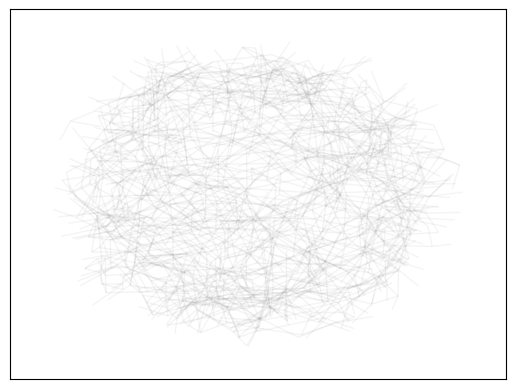

In [65]:
pos = nx.spring_layout(G, k=0.1)
nx.draw_networkx(
    G, pos=pos, node_size=0, edge_color="#333333", alpha=0.05, with_labels=False)

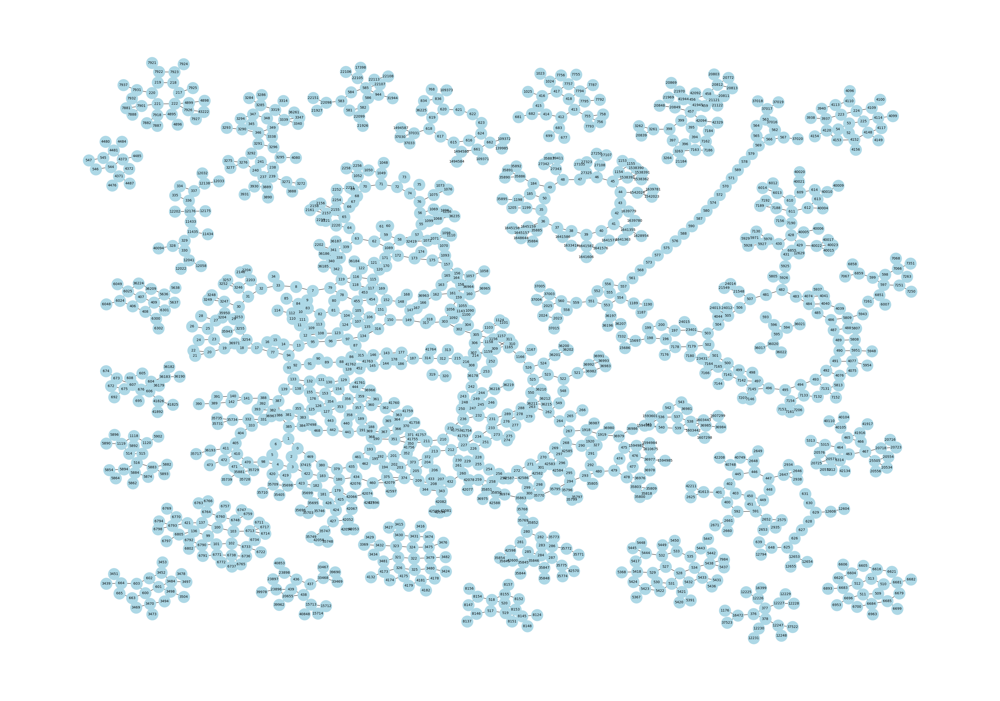

In [66]:


plt.figure(figsize=(40,28))


nx.draw(G, pos = nx.nx_pydot.graphviz_layout(G), node_size=1200, node_color='lightblue', linewidths=0.25,font_size=10, with_labels=True)

plt.show()

## Community Detection

In [67]:
communities = sorted(nxcom.greedy_modularity_communities(G), key=len, reverse=True)
len(communities)

44

In [68]:
def set_node_community(G, communities):
    '''Add community to node attributes'''
    for c, v_c in enumerate(communities):
        for v in v_c:
            # Add 1 to save 0 for external edges
            G.nodes[v]['community'] = c + 1
            
def set_edge_community(G):
    '''Find internal edges and add their community to their attributes'''
    for v, w, in G.edges:
        if G.nodes[v]['community'] == G.nodes[w]['community']:
            # Internal edge, mark with community
            G.edges[v, w]['community'] = G.nodes[v]['community']
        else:
            # External edge, mark as 0
            G.edges[v, w]['community'] = 0

In [69]:
def get_color(i, r_off=1, g_off=1, b_off=1):
    r0, g0, b0 = 0, 0, 0
    n = 16
    low, high = 0.1, 0.9
    span = high - low
    r = low + span * (((i + r_off) * 3) % n) / (n - 1)
    g = low + span * (((i + g_off) * 5) % n) / (n - 1)
    b = low + span * (((i + b_off) * 7) % n) / (n - 1)
    return (r, g, b)

In [70]:
# Set node and edge communities
set_node_community(G, communities)
set_edge_community(G)

In [71]:
# Set community color for internal edges
external = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] == 0]
internal = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] > 0]
internal_color = [get_color(G.edges[e]['community']) for e in internal]

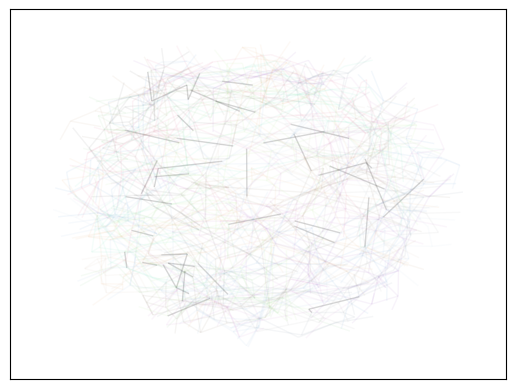

In [72]:
# Draw external edges
nx.draw_networkx(
    G, pos=pos, node_size=0, edgelist=external, edge_color="#333333",
    alpha=0.2, with_labels=False)
# Draw internal edges
nx.draw_networkx(
    G, pos=pos, node_size=0, edgelist=internal, edge_color=internal_color,
    alpha=0.05, with_labels=False)

## Graph Statistics

In [73]:
# Now G contains the filtered graph. You can print or visualize it.
print("Nodes:", G.nodes())
print("Edges:", G.edges())

print(f"Total number of nodes : {len(G.nodes())}")
print(f"Total number of edges : {len(G.edges())}")



Nodes: [0, 1, 2, 469, 6, 385, 3, 380, 37415, 5, 384, 386, 4, 419, 422, 98, 420, 35698, 183, 423, 470, 35729, 35709, 7, 8, 9, 79, 33, 10, 84, 78, 119, 32, 34, 11, 110, 83, 85, 12, 111, 112, 13, 95, 108, 14, 94, 109, 113, 123, 96, 15, 16, 77, 93, 17, 18, 3254, 19, 3255, 36971, 20, 23, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 3247, 3253, 35943, 3246, 3248, 3249, 3204, 35950, 2203, 3252, 3257, 2146, 2204, 35, 36, 50, 1199, 37, 35885, 1645159, 49, 185, 1198, 1205, 38, 1641586, 35884, 1645157, 1645156, 1648644, 39, 1633418, 40, 1641587, 41, 1641577, 1641576, 1641606, 42, 1641355, 1641363, 43, 1639779, 1628954, 1639780, 44, 45, 1542024, 46, 1154, 1538392, 1542023, 1639781, 47, 27108, 27325, 1153, 1155, 1538362, 1538390, 1538391, 48, 27107, 27250, 27323, 27335, 27343, 184, 27342, 35887, 39411, 35886, 52, 53, 54, 4152, 223, 225, 4120, 4148, 4153, 4156, 224, 3937, 4113, 4114, 4154, 55, 56, 57, 1068, 1099, 76, 1069, 58, 1071, 1072, 1096, 1116, 36235, 74, 1075, 59, 1089, 32419, 1070, 1098, 1110, 60

In [74]:
nx.is_connected(G) # Check whether the graph is fully connected

False

In [75]:

# Computes subgraphs and stores them in a list
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

-------------------- Graph 0 --------------------


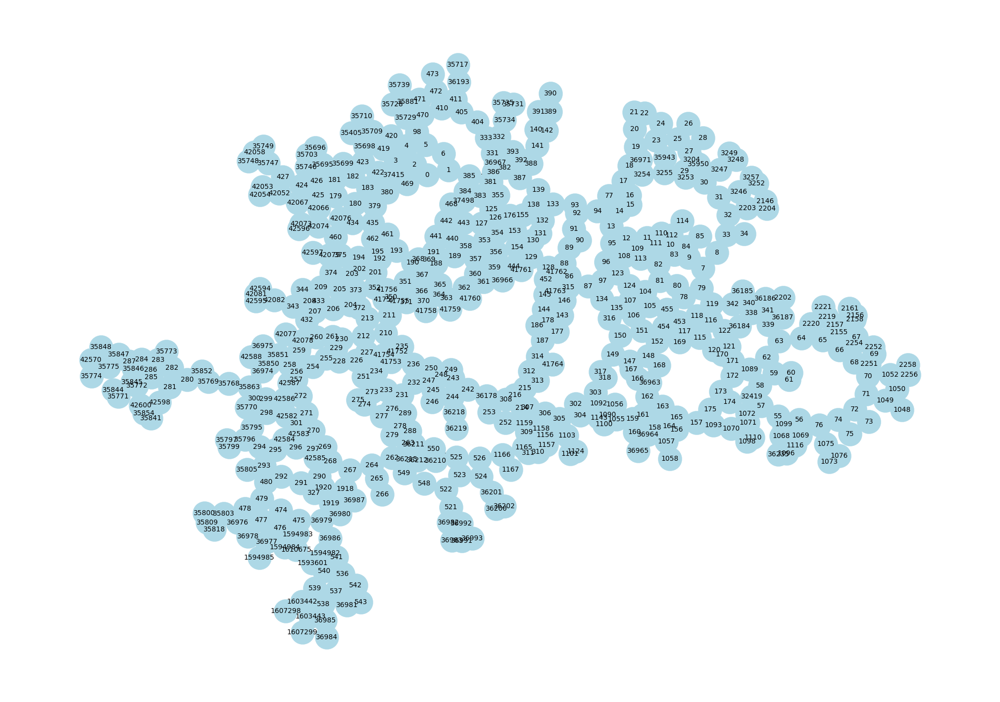

---------- Graph Stats  ----------
Nodes : 591 Edges : 591
Diameter : 45
Periphery : [2256, 2258, 35774, 35848, 42570]


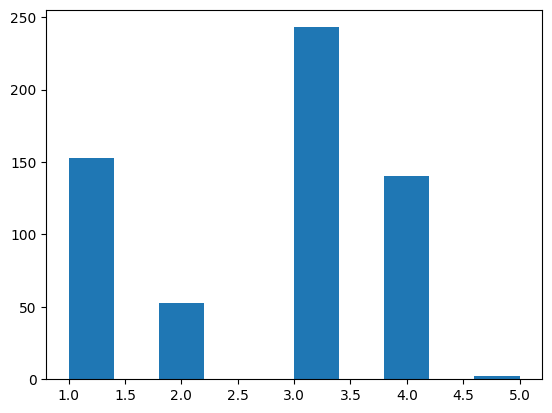

Density of the graph: 0.004468152226906421
Average degree: 2.6362098138747885
Size of the largest connected component: 591
Degree assortativity coefficient: -0.07240299819279103
        Node  Degree Centrality
475     1068              0.008
105      125              0.008
131      151              0.007
159      179              0.007
362      470              0.007
..       ...                ...
80     36963              0.002
448    35797              0.002
449    35799              0.002
450    35800              0.002
590  1593601              0.002

[591 rows x 2 columns]
        Node  Closeness Centrality
109      129                 0.077
168      190                 0.076
169      191                 0.076
312      371                 0.076
183      210                 0.076
..       ...                   ...
190     2256                 0.040
191     2258                 0.040
569  1607299                 0.040
579    36984                 0.039
466     1048                 

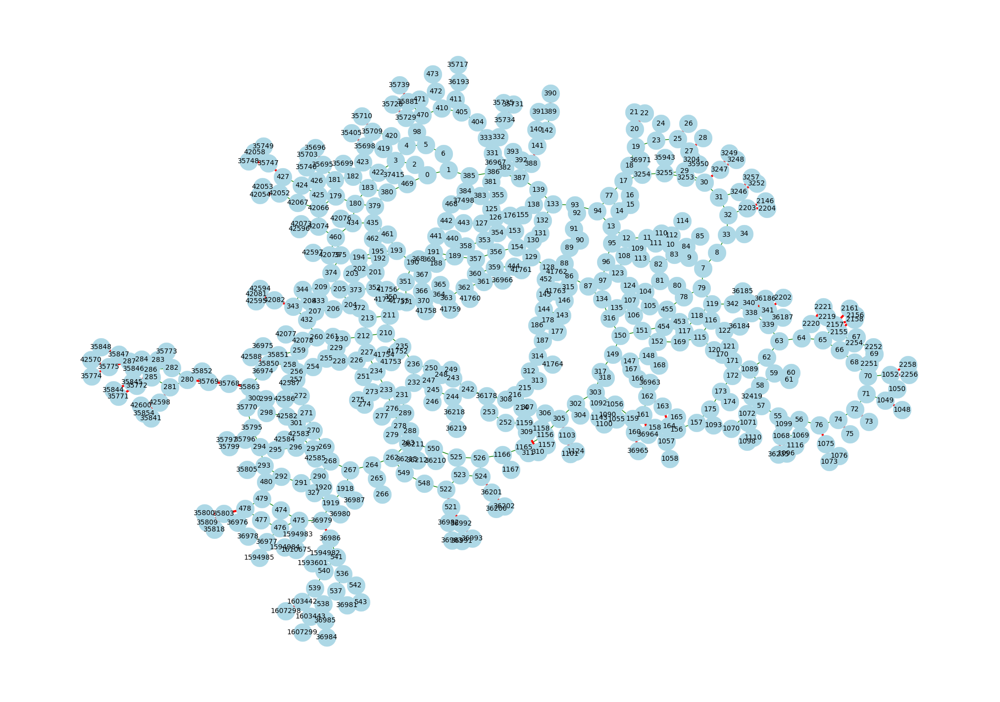

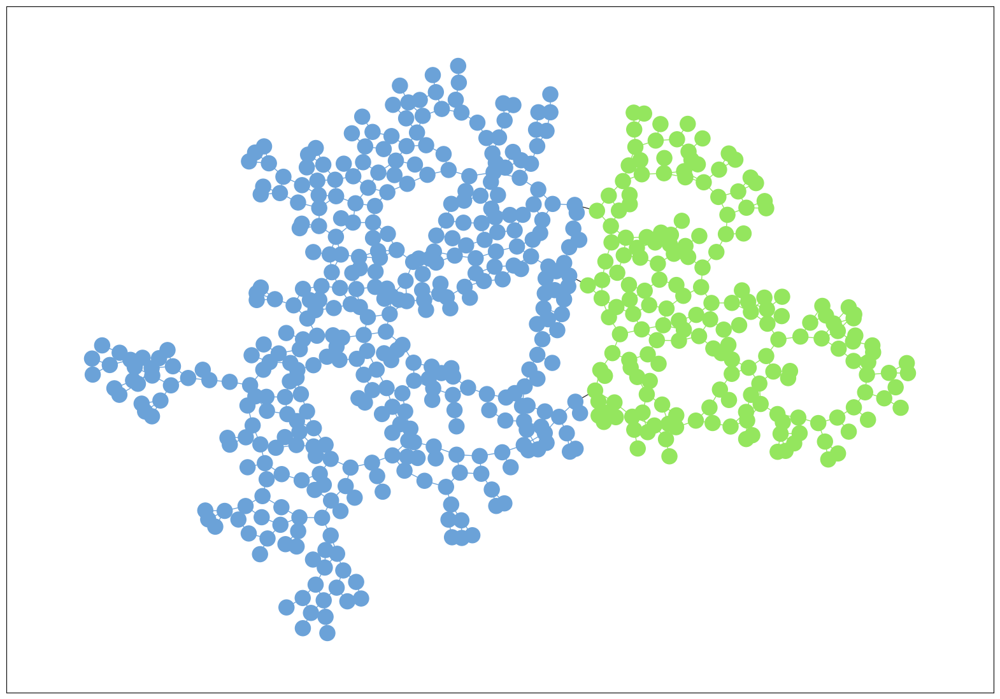

--------------------------------------------------
-------------------- Graph 1 --------------------


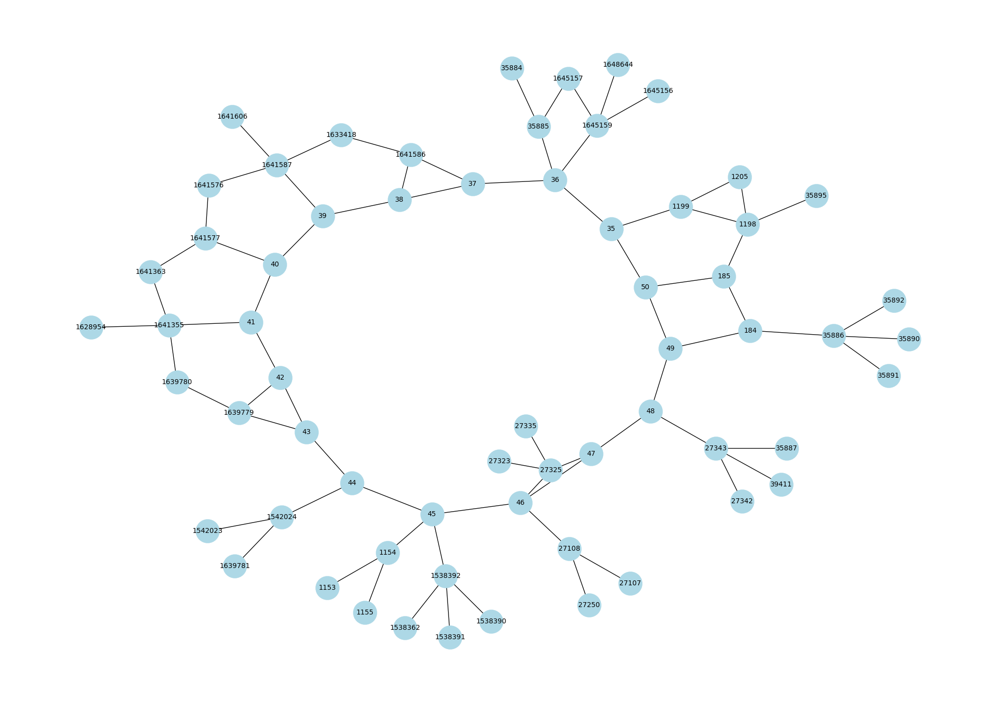

---------- Graph Stats  ----------
Nodes : 63 Edges : 63
Diameter : 13
Periphery : [1628954, 35890, 35891, 35892]


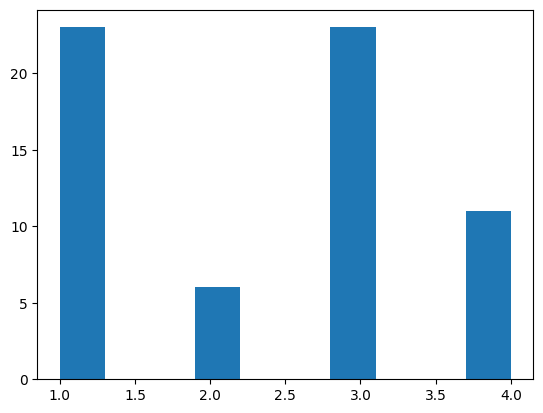

Density of the graph: 0.03789042498719918
Average degree: 2.3492063492063493
Size of the largest connected component: 63
Degree assortativity coefficient: -0.47263681592039875
       Node  Degree Centrality
22     1198              0.065
28    35886              0.065
43    27343              0.065
60  1641587              0.065
48       45              0.065
..      ...                ...
39  1538362              0.016
40    27335              0.016
41    35887              0.016
42    27342              0.016
62    27250              0.016

[63 rows x 2 columns]
       Node  Closeness Centrality
24       48                 0.207
30       46                 0.206
25       49                 0.206
27       47                 0.206
48       45                 0.202
..      ...                   ...
36    35892                 0.134
35    35891                 0.134
34    35890                 0.134
10  1628954                 0.133
4   1641606                 0.133

[63 rows x 2 columns

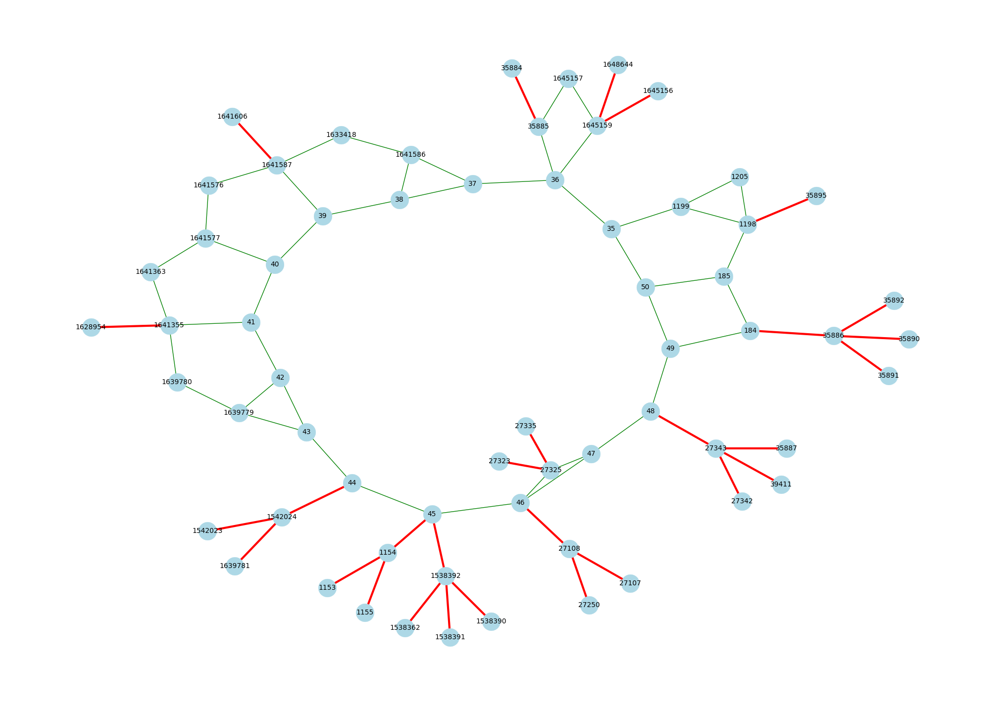

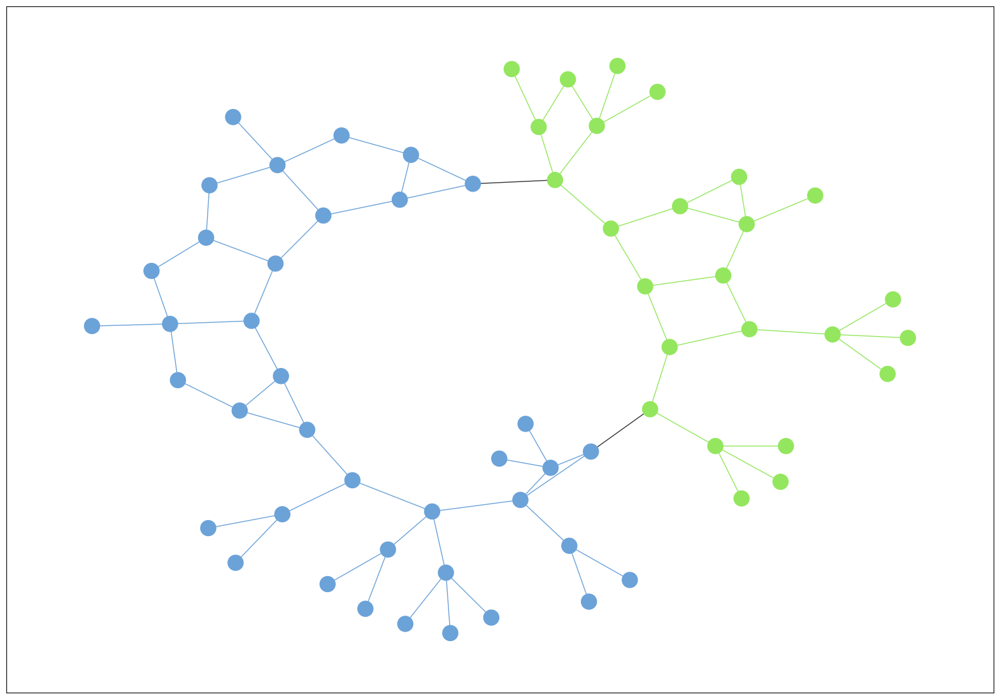

--------------------------------------------------
-------------------- Graph 2 --------------------


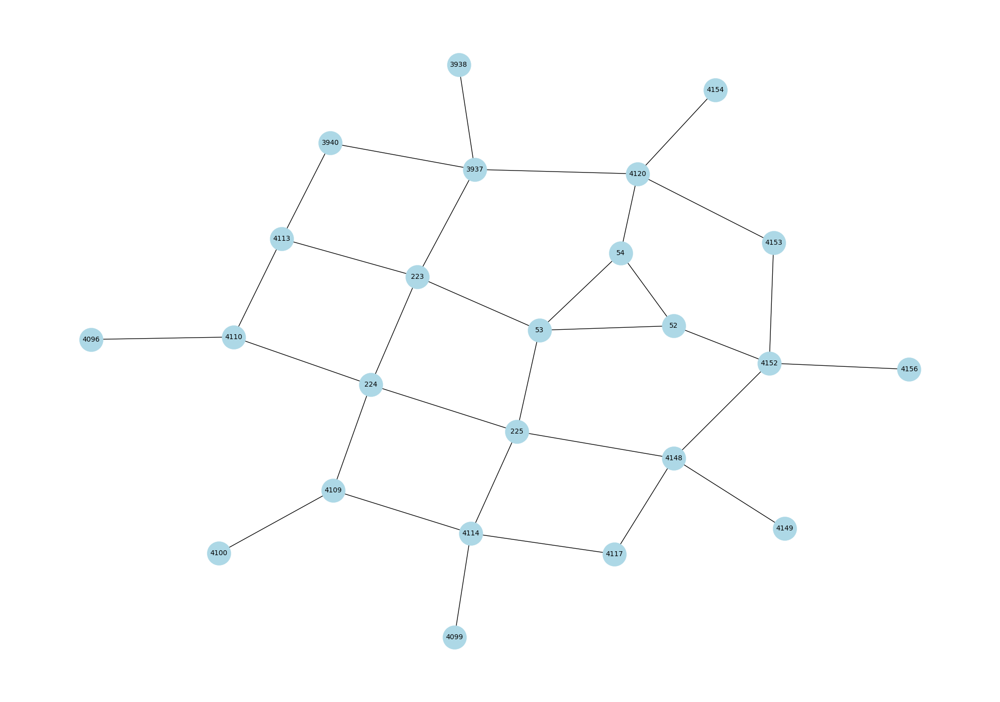

---------- Graph Stats  ----------
Nodes : 24 Edges : 24
Diameter : 6
Periphery : [4096, 4099, 4100, 4117, 4149, 4154, 4153, 4156, 3938, 3940]


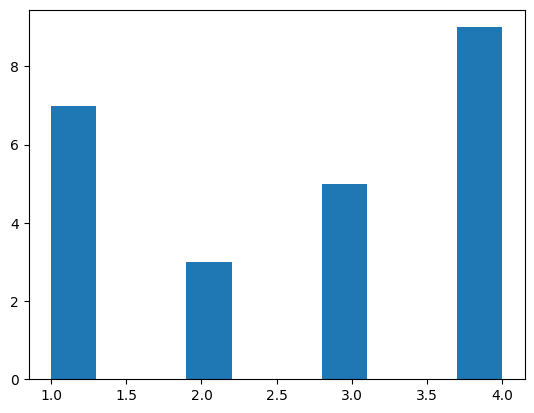

Density of the graph: 0.11594202898550725
Average degree: 2.6666666666666665
Size of the largest connected component: 24
Degree assortativity coefficient: -0.24242424242424243
    Node  Degree Centrality
12  4148              0.174
21  3937              0.174
6   4114              0.174
20   225              0.174
8   4120              0.174
10    53              0.174
19   224              0.174
13  4152              0.174
18   223              0.174
3   4109              0.130
4   4110              0.130
5   4113              0.130
9     52              0.130
11    54              0.130
16  4153              0.087
23  3940              0.087
7   4117              0.087
15  4154              0.043
17  4156              0.043
14  4149              0.043
1   4099              0.043
2   4100              0.043
22  3938              0.043
0   4096              0.043
    Node  Closeness Centrality
20   225                 0.418
10    53                 0.411
19   224                 0.404


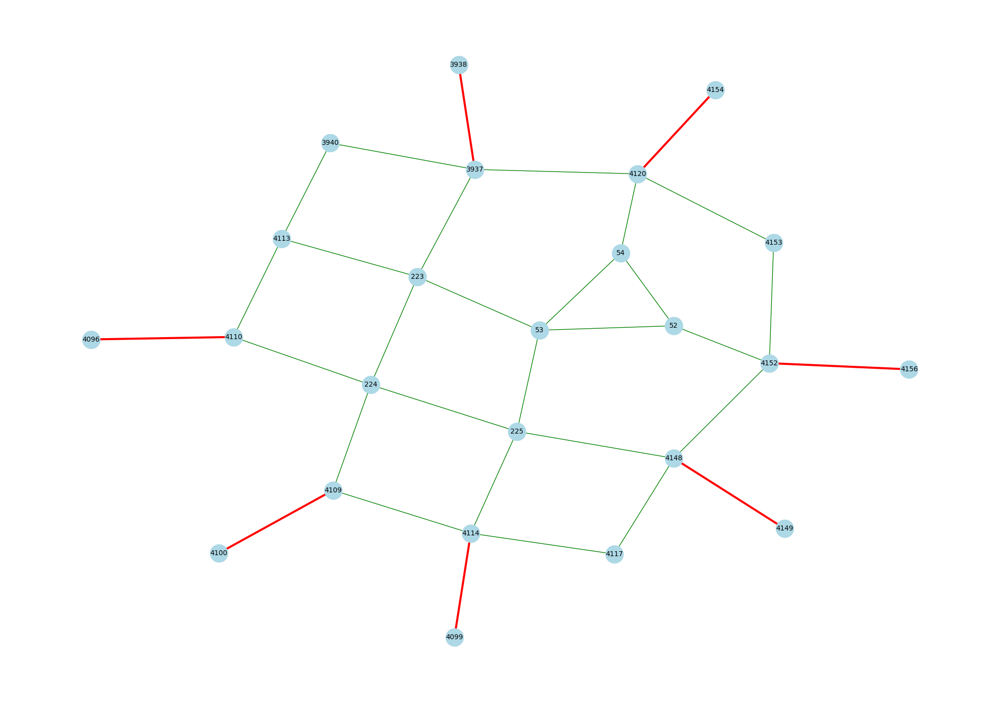

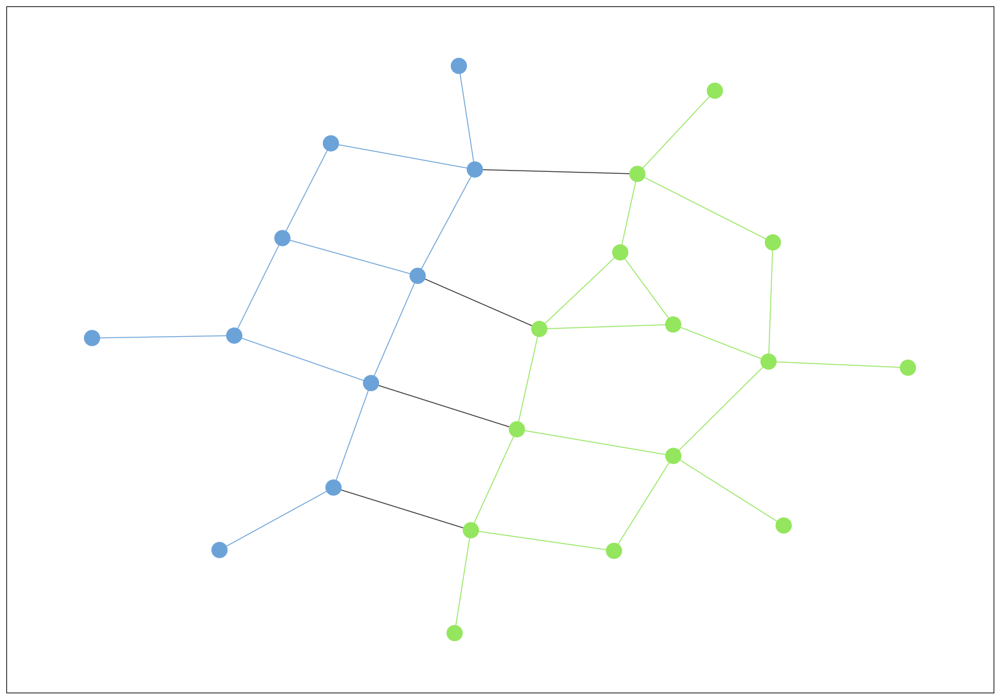

--------------------------------------------------
-------------------- Graph 3 --------------------


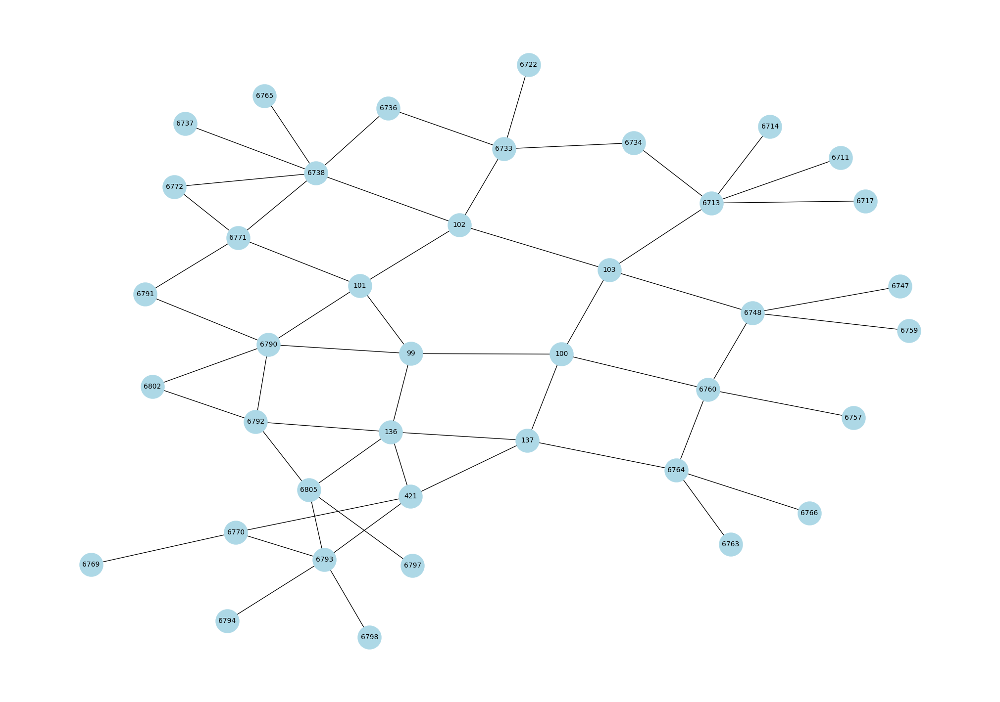

---------- Graph Stats  ----------
Nodes : 40 Edges : 40
Diameter : 8
Periphery : [6794, 6798, 6722, 6736, 6737, 6765, 6769]


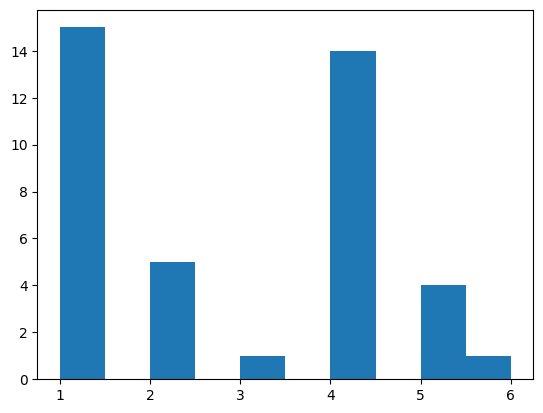

Density of the graph: 0.07051282051282051
Average degree: 2.75
Size of the largest connected component: 40
Degree assortativity coefficient: -0.42708873897249455
    Node  Degree Centrality
21  6738              0.154
0   6790              0.128
2    136              0.128
5   6793              0.128
13  6713              0.128
28   103              0.103
24    99              0.103
17  6733              0.103
25   100              0.103
26   101              0.103
27   102              0.103
10  6805              0.103
11   421              0.103
29  6760              0.103
33  6764              0.103
38  6771              0.103
4   6792              0.103
3    137              0.103
23  6748              0.103
37  6770              0.077
39  6772              0.051
1   6791              0.051
19  6736              0.051
18  6734              0.051
9   6802              0.051
32  6763              0.026
6   6794              0.026
7   6797              0.026
36  6769              0.02

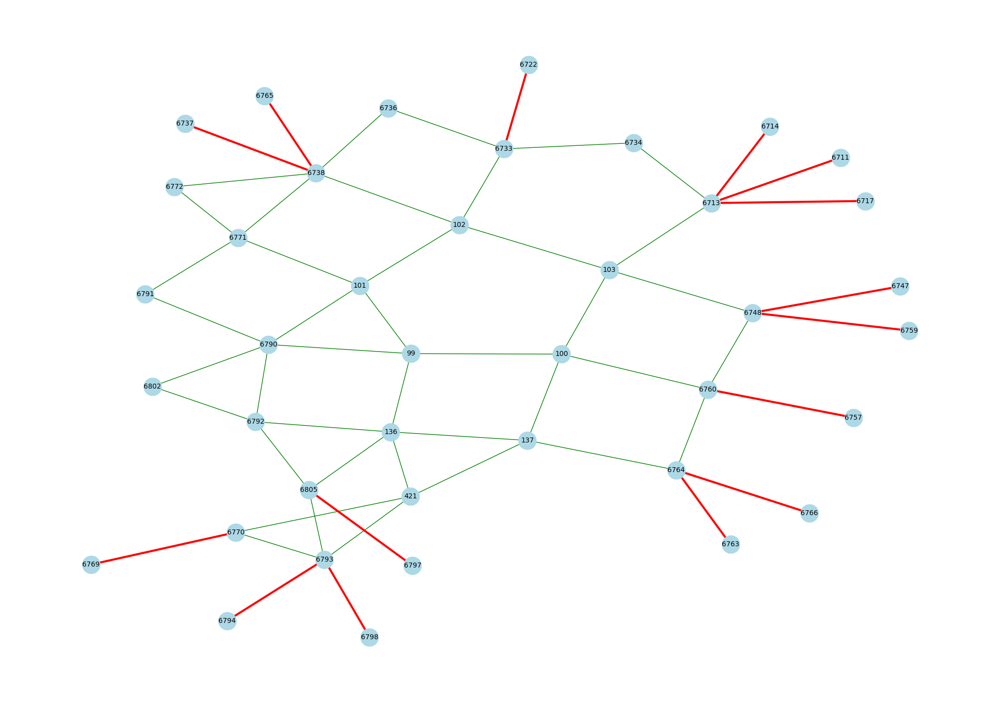

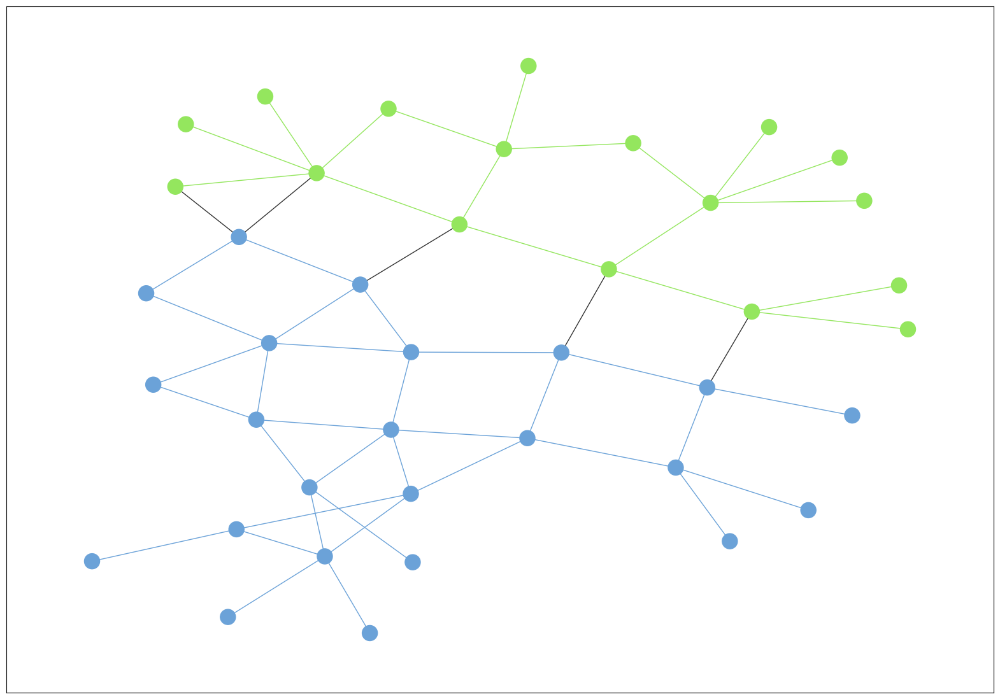

--------------------------------------------------
-------------------- Graph 4 --------------------


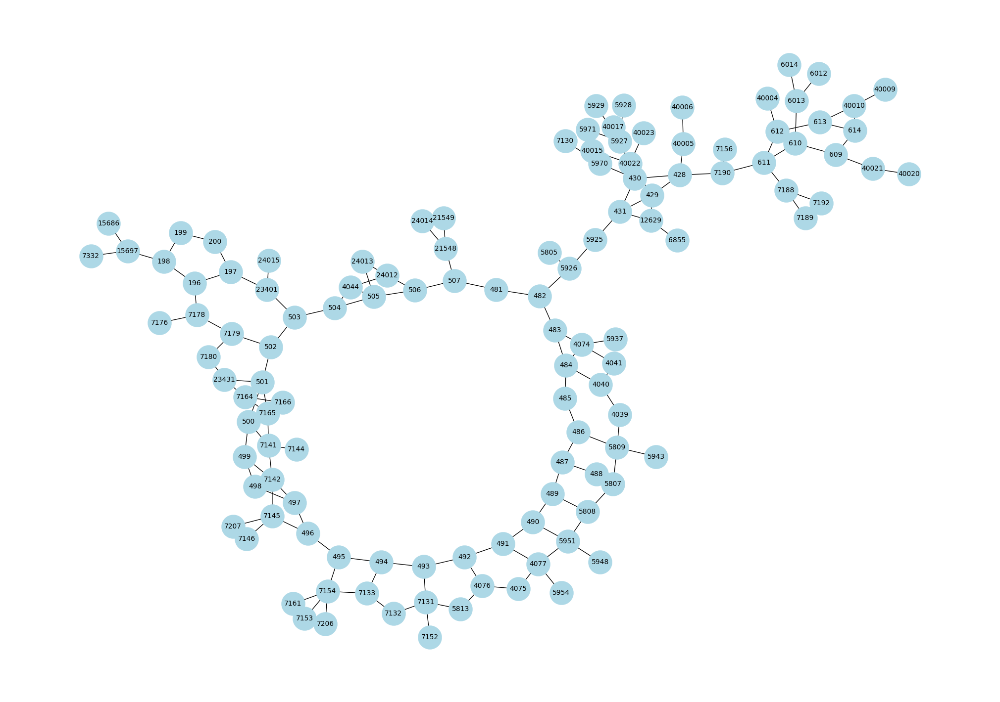

---------- Graph Stats  ----------
Nodes : 121 Edges : 121
Diameter : 25
Periphery : [7206, 40009, 40020, 7153, 7161]


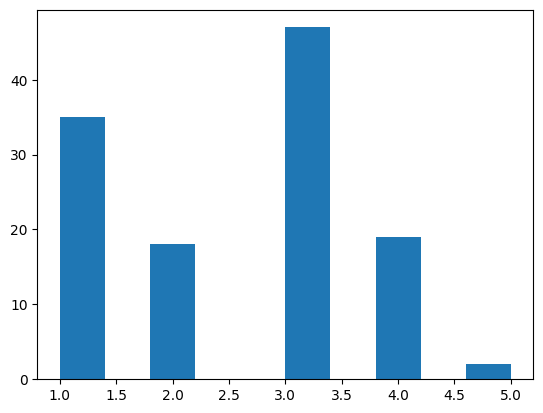

Density of the graph: 0.020523415977961434
Average degree: 2.4628099173553717
Size of the largest connected component: 121
Degree assortativity coefficient: -0.20686639974227827
      Node  Degree Centrality
119    501              0.042
32    7154              0.042
26     611              0.033
102   4077              0.033
47    7165              0.033
..     ...                ...
86    7130              0.008
54    5937              0.008
23   40023              0.008
97     488              0.008
0     7176              0.008

[121 rows x 2 columns]
      Node  Closeness Centrality
91     482                 0.131
90     481                 0.126
50    5926                 0.125
92     483                 0.125
116    507                 0.123
..     ...                   ...
65    6012                 0.071
59   15686                 0.071
67    6014                 0.071
16   40009                 0.067
20   40020                 0.067

[121 rows x 2 columns]
     Node  Between

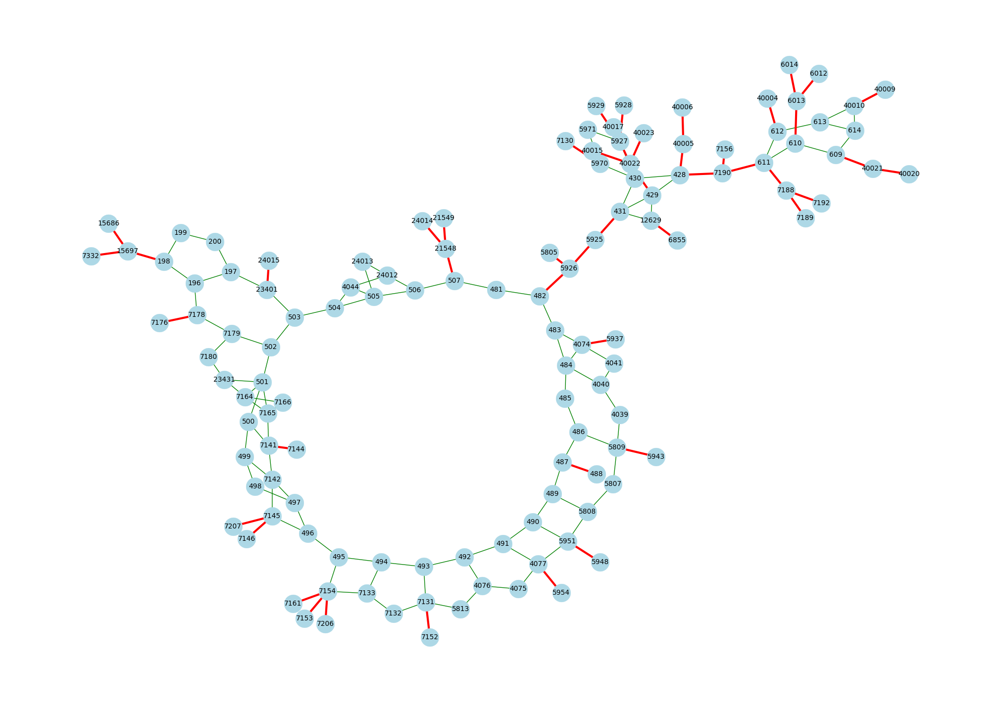

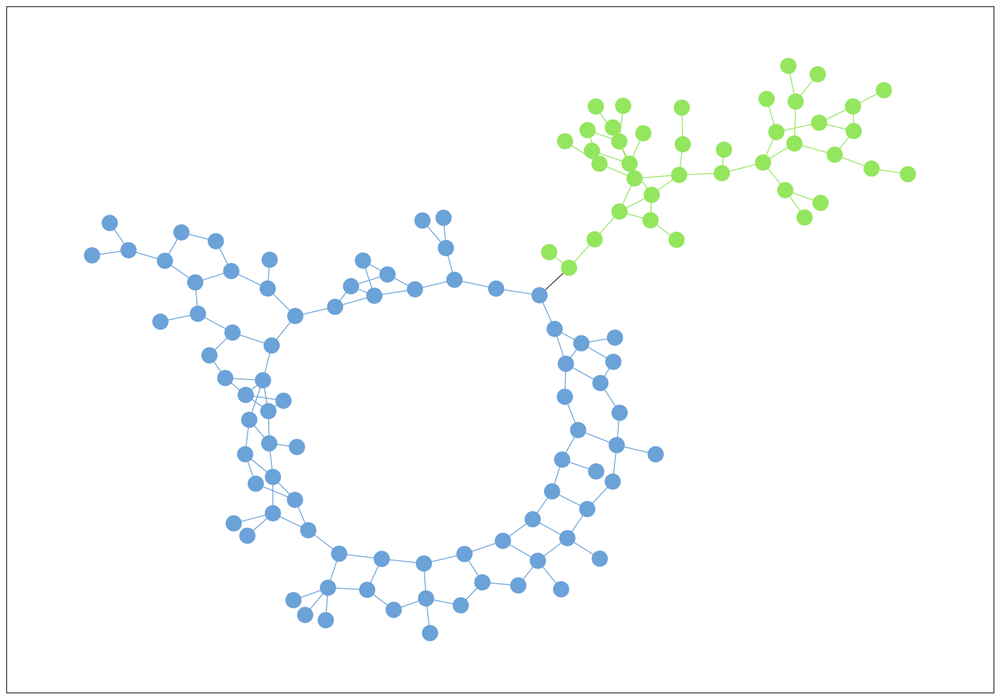

--------------------------------------------------
-------------------- Graph 5 --------------------


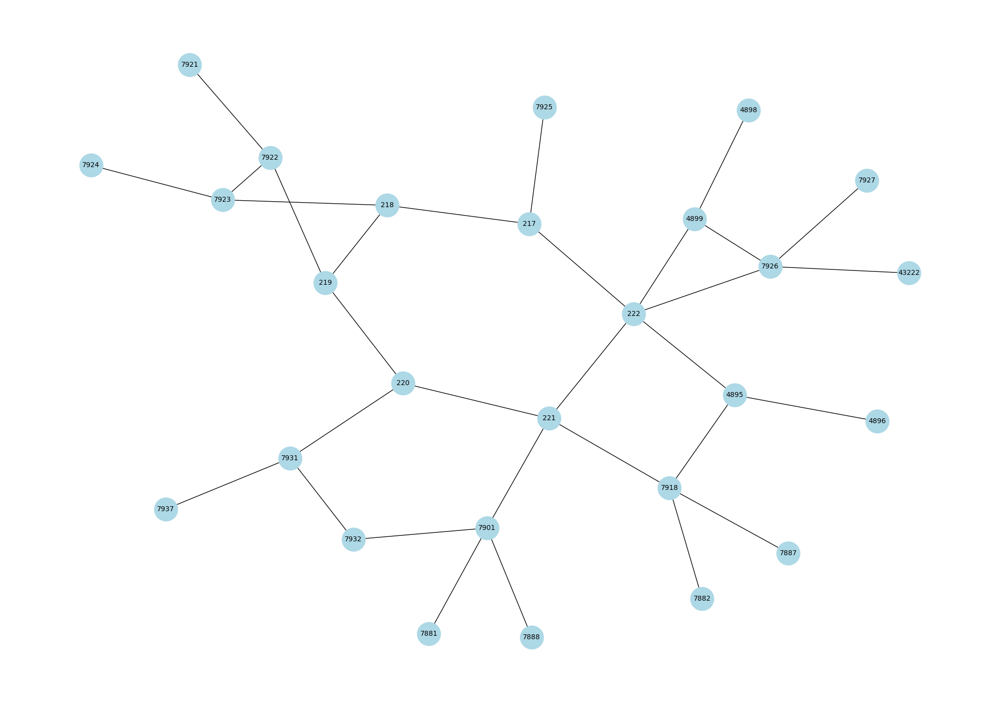

---------- Graph Stats  ----------
Nodes : 27 Edges : 27
Diameter : 7
Periphery : [4896, 4898, 7881, 7882, 7887, 7888, 43222, 7921, 7924, 7927]


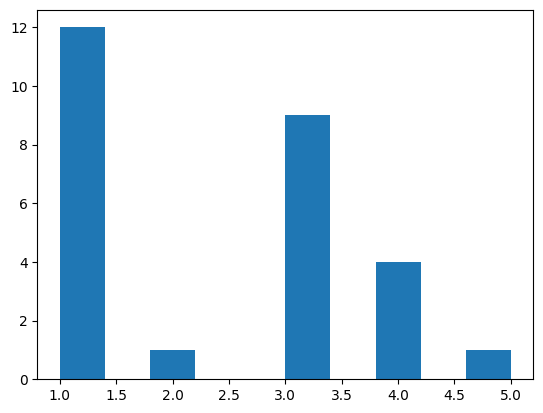

Density of the graph: 0.08831908831908832
Average degree: 2.2962962962962963
Size of the largest connected component: 27
Degree assortativity coefficient: -0.16279069767441873
     Node  Degree Centrality
16    222              0.192
14    221              0.154
23   7926              0.154
17   7918              0.154
15   7901              0.154
13    220              0.115
25   7931              0.115
4    4899              0.115
20   7923              0.115
19   7922              0.115
10    217              0.115
11    218              0.115
12    219              0.115
1    4895              0.115
26   7932              0.077
9   43222              0.038
8    7888              0.038
7    7887              0.038
18   7921              0.038
6    7882              0.038
5    7881              0.038
21   7924              0.038
22   7925              0.038
3    4898              0.038
24   7927              0.038
2    4896              0.038
0    7937              0.038
     Node  C

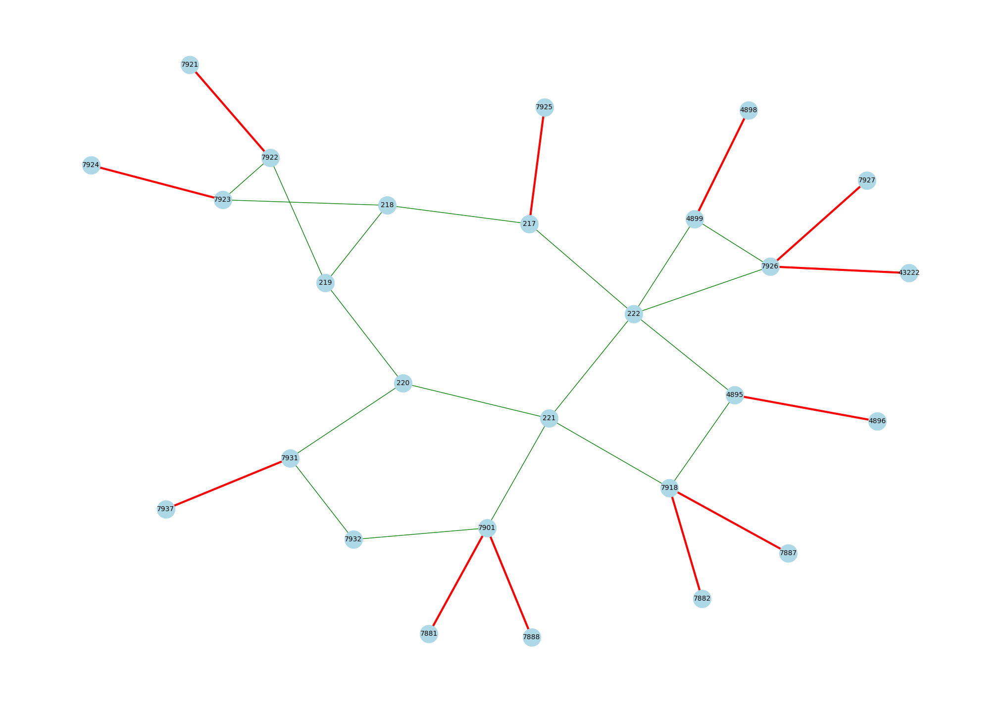

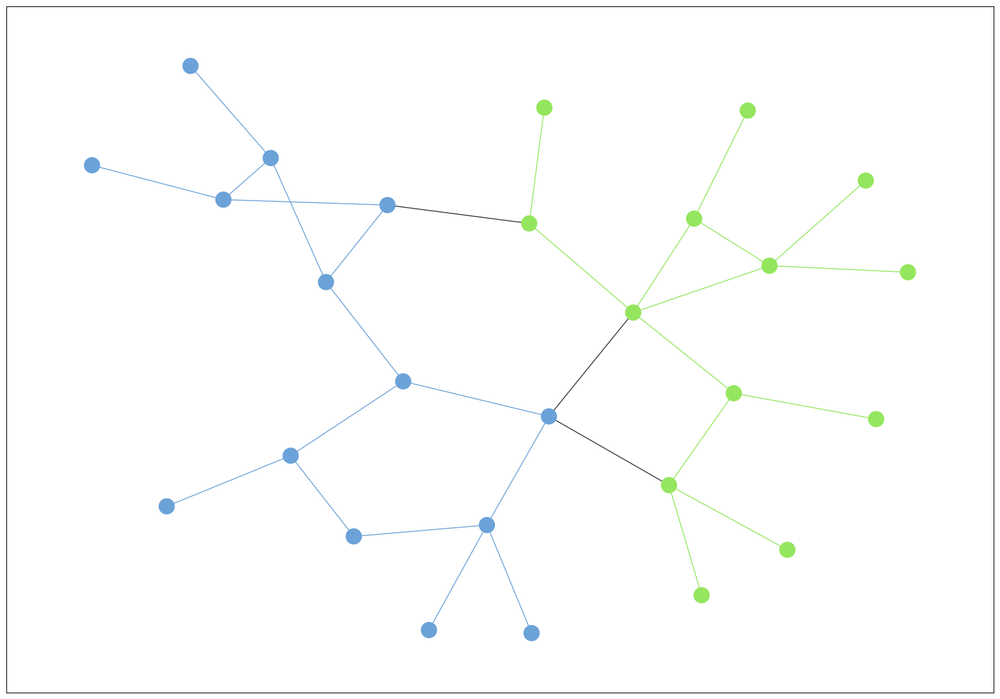

--------------------------------------------------
-------------------- Graph 6 --------------------


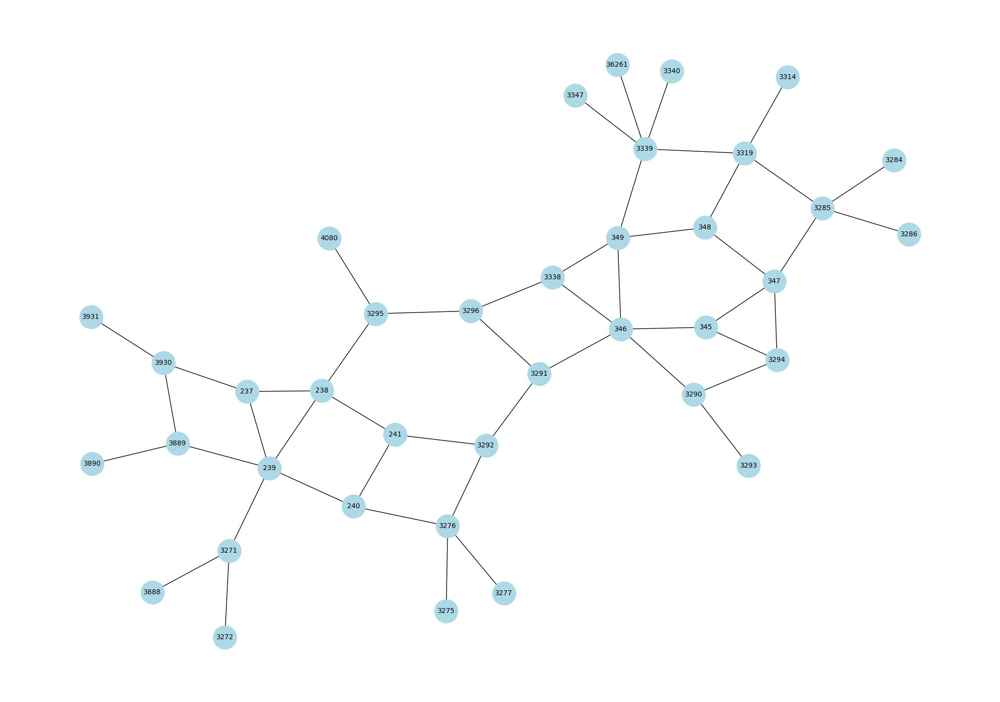

---------- Graph Stats  ----------
Nodes : 38 Edges : 38
Diameter : 11
Periphery : [3888, 3890, 3272, 3284, 3286, 3931]


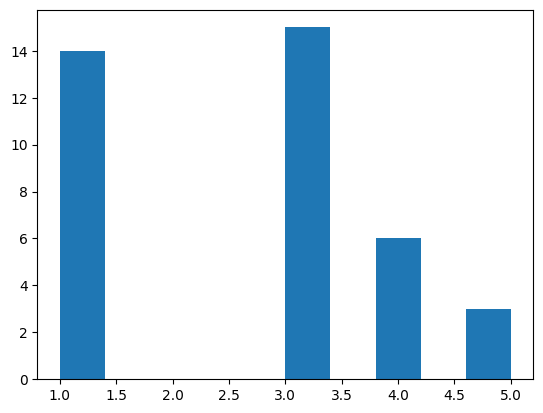

Density of the graph: 0.06970128022759602
Average degree: 2.5789473684210527
Size of the largest connected component: 38
Degree assortativity coefficient: -0.23213738117141988
     Node  Degree Centrality
21    346              0.135
32    239              0.135
1    3339              0.135
37   3319              0.108
11   3276              0.108
31    238              0.108
14   3285              0.108
27    347              0.108
24    349              0.108
22   3295              0.081
23   3296              0.081
26    348              0.081
25   3290              0.081
28   3294              0.081
30    237              0.081
33    240              0.081
34    241              0.081
20   3292              0.081
0    3338              0.081
18   3291              0.081
6    3889              0.081
16    345              0.081
8    3271              0.081
17   3930              0.081
36   3314              0.027
35   4080              0.027
2    3340              0.027
3    3347   

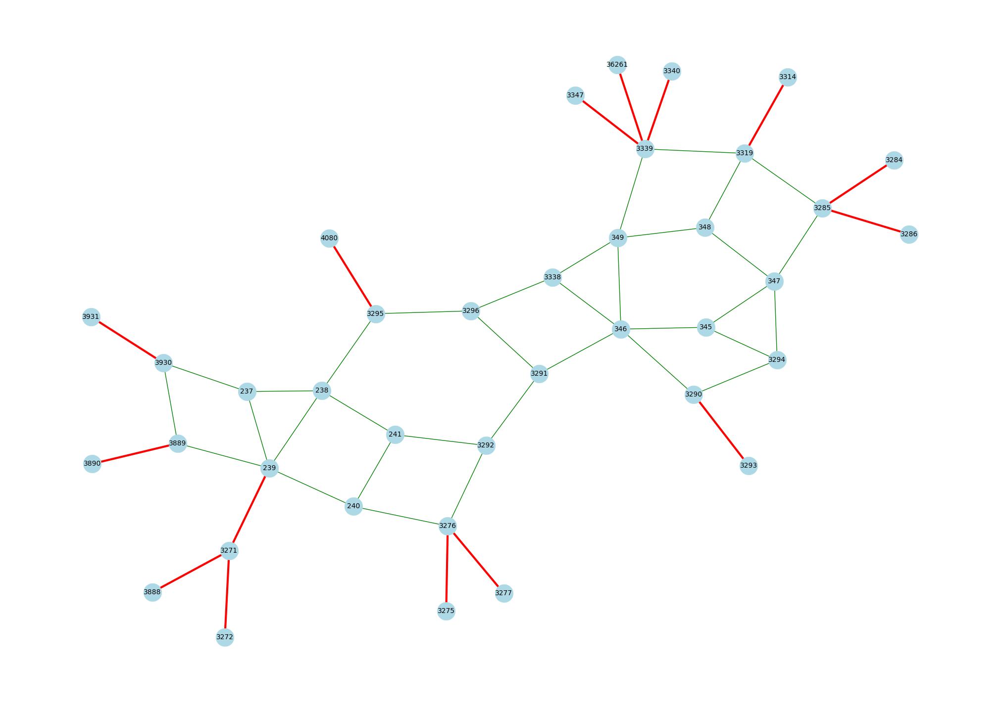

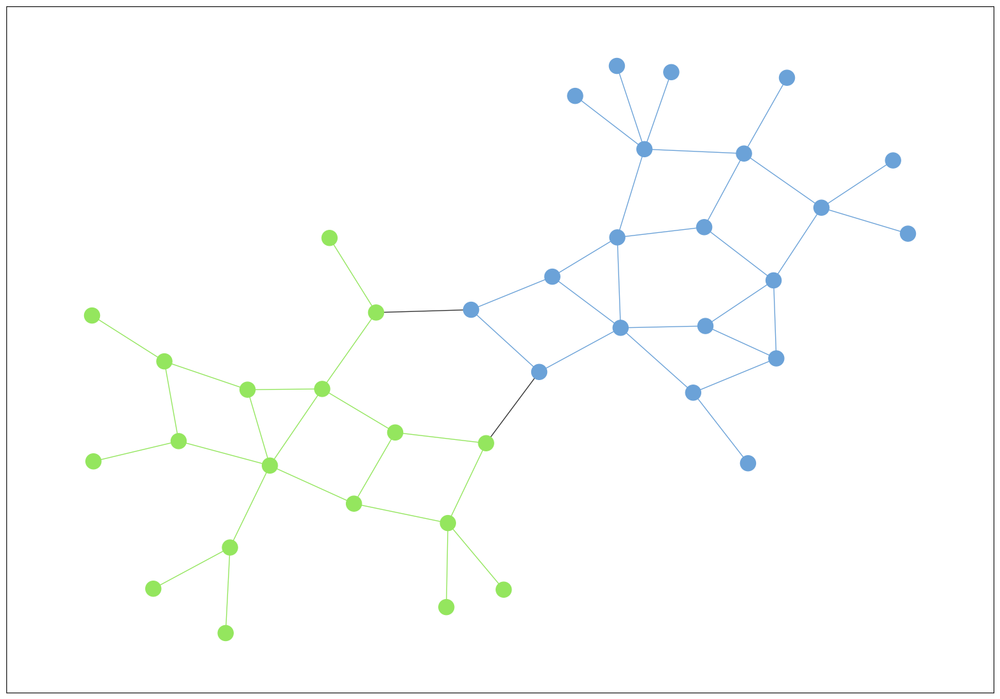

--------------------------------------------------
-------------------- Graph 7 --------------------


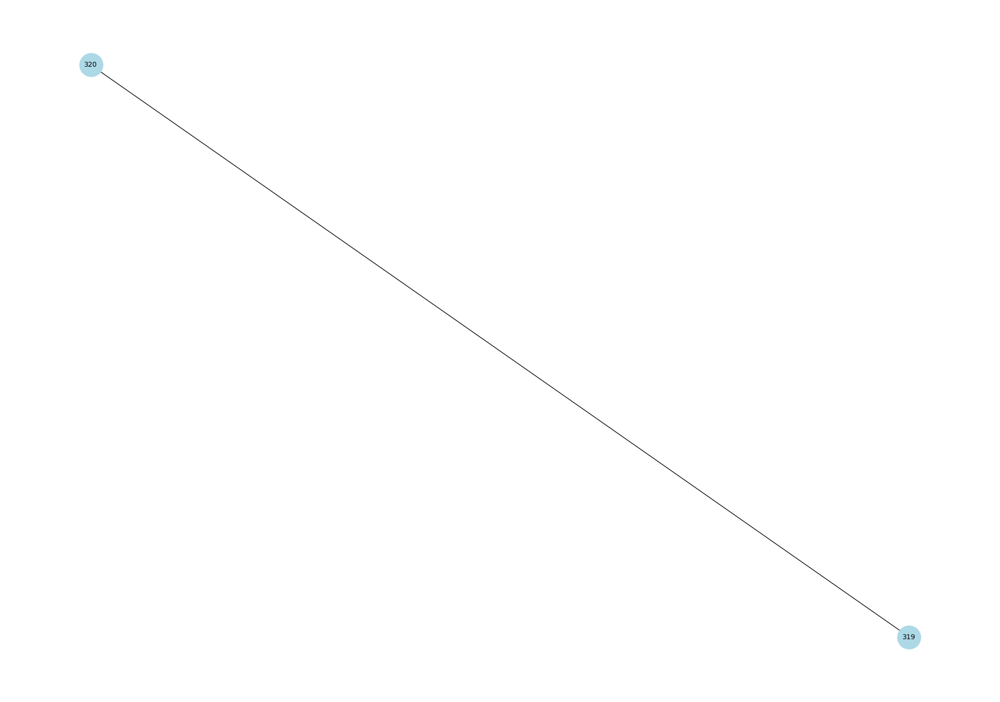

---------- Graph Stats  ----------
Nodes : 2 Edges : 2
Diameter : 1
Periphery : [320, 319]


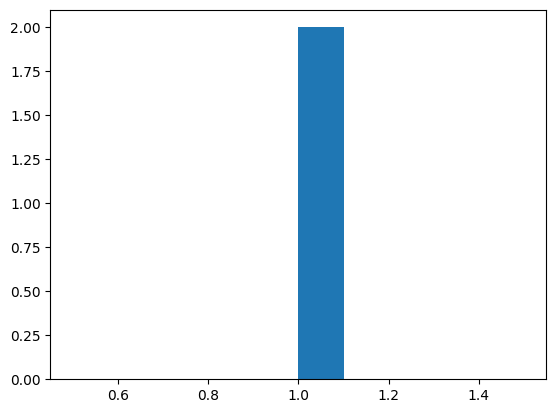

Density of the graph: 1.0
Average degree: 1.0
Size of the largest connected component: 2
Degree assortativity coefficient: nan
   Node  Degree Centrality
0   320                1.0
1   319                1.0
   Node  Closeness Centrality
0   320                   1.0
1   319                   1.0
   Node  Betweenness Centrality
0   320                     0.0
1   319                     0.0
   Node  Katz Centrality
0   320            0.707
1   319            0.707


/Users/ha5hkat/SJSU/276/276-ML-on-Graphs/.venv/lib/python3.12/site-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


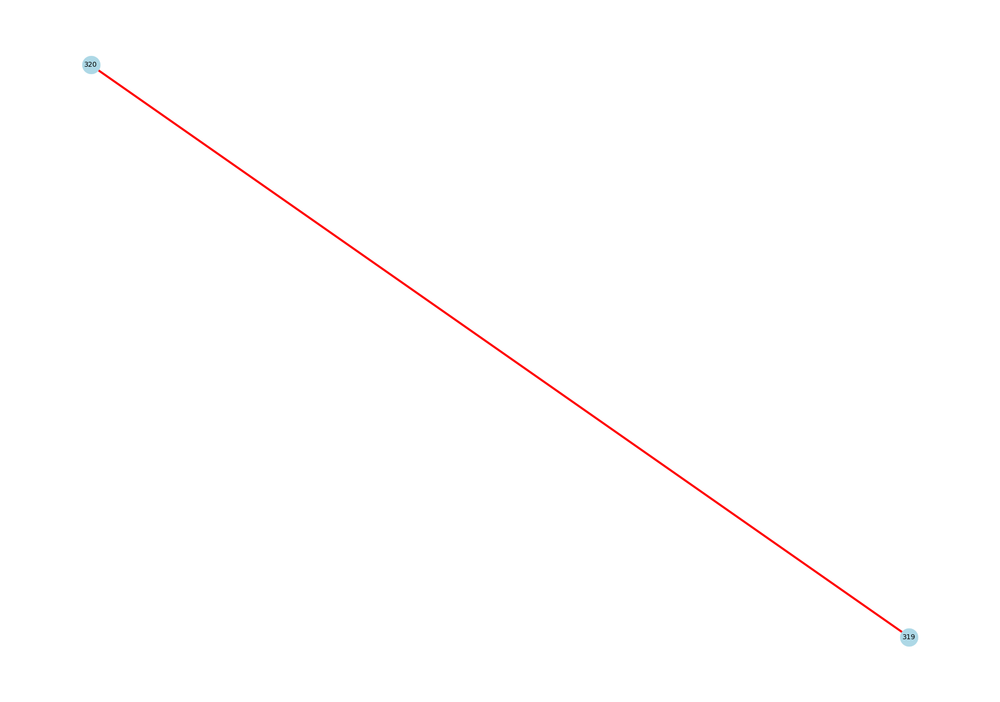

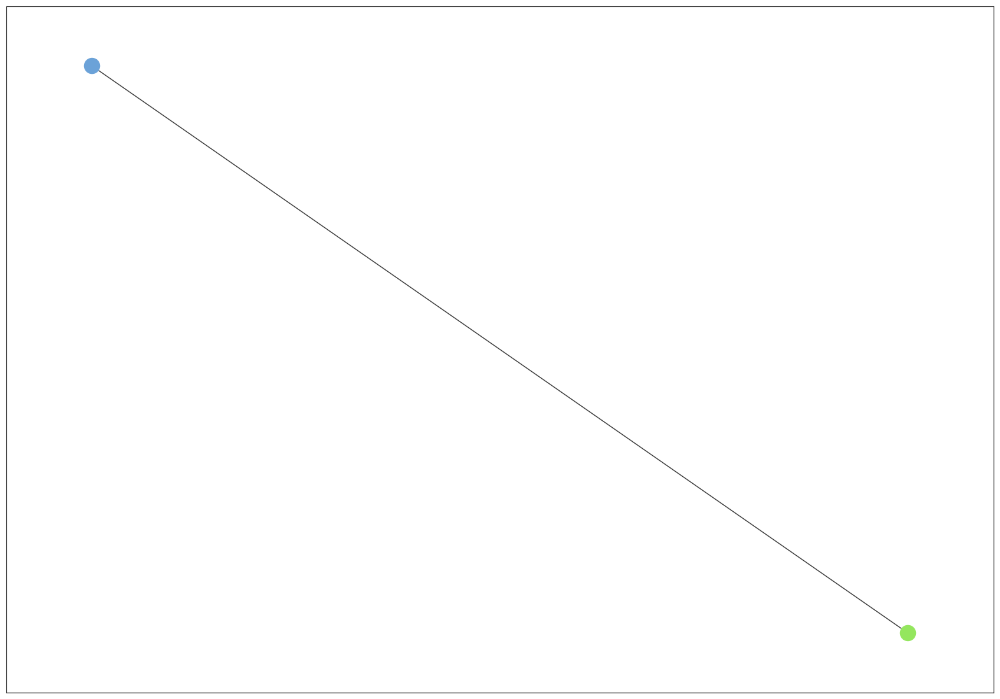

--------------------------------------------------
-------------------- Graph 8 --------------------


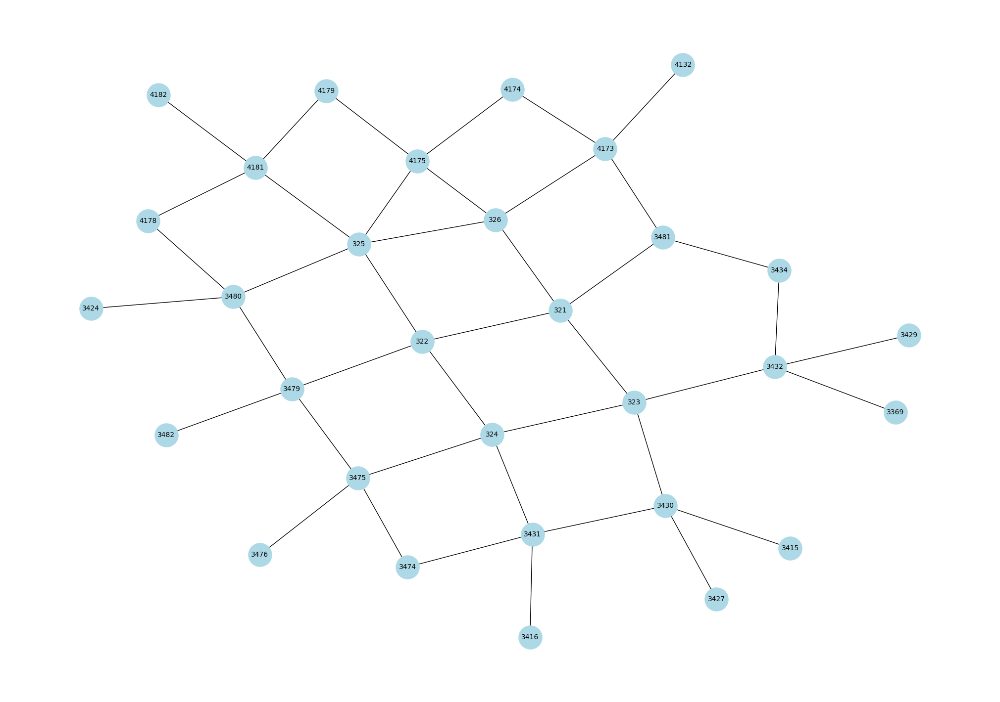

---------- Graph Stats  ----------
Nodes : 31 Edges : 31
Diameter : 7
Periphery : [3474, 3476, 4132, 3369, 4178, 4182, 3415, 3416, 3424, 3427, 3429]


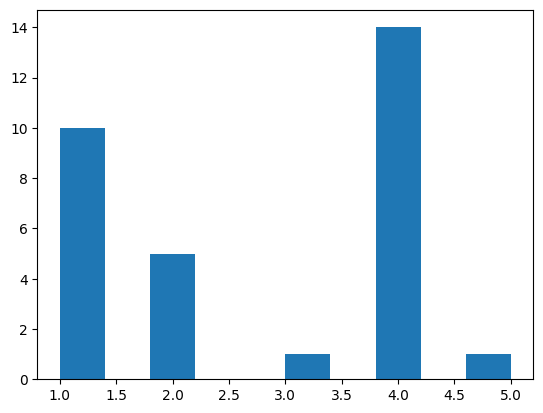

Density of the graph: 0.09032258064516129
Average degree: 2.7096774193548385
Size of the largest connected component: 31
Degree assortativity coefficient: -0.21188630490956037
    Node  Degree Centrality
13   325              0.167
15  4173              0.133
20  4181              0.133
1   3475              0.133
14   326              0.133
12   324              0.133
11   323              0.133
10   322              0.133
9    321              0.133
27  3430              0.133
28  3431              0.133
4   3480              0.133
3   3479              0.133
29  3432              0.133
17  4175              0.133
5   3481              0.100
18  4178              0.067
19  4179              0.067
0   3474              0.067
16  4174              0.067
30  3434              0.067
8   3369              0.033
21  4182              0.033
22  3415              0.033
23  3416              0.033
24  3424              0.033
25  3427              0.033
26  3429              0.033
7   4132    

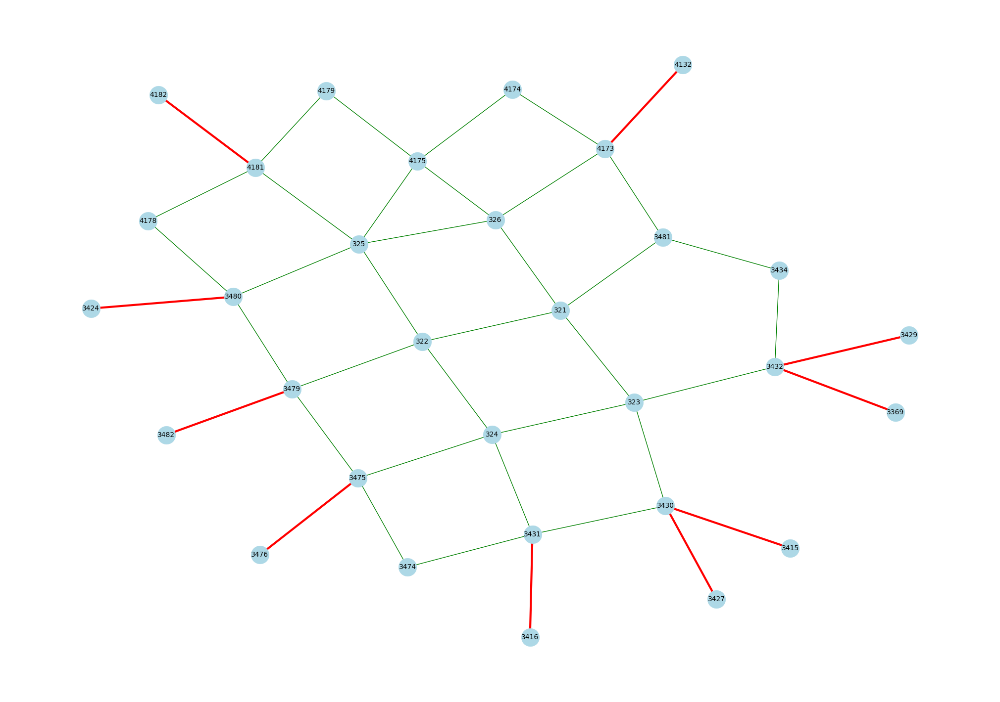

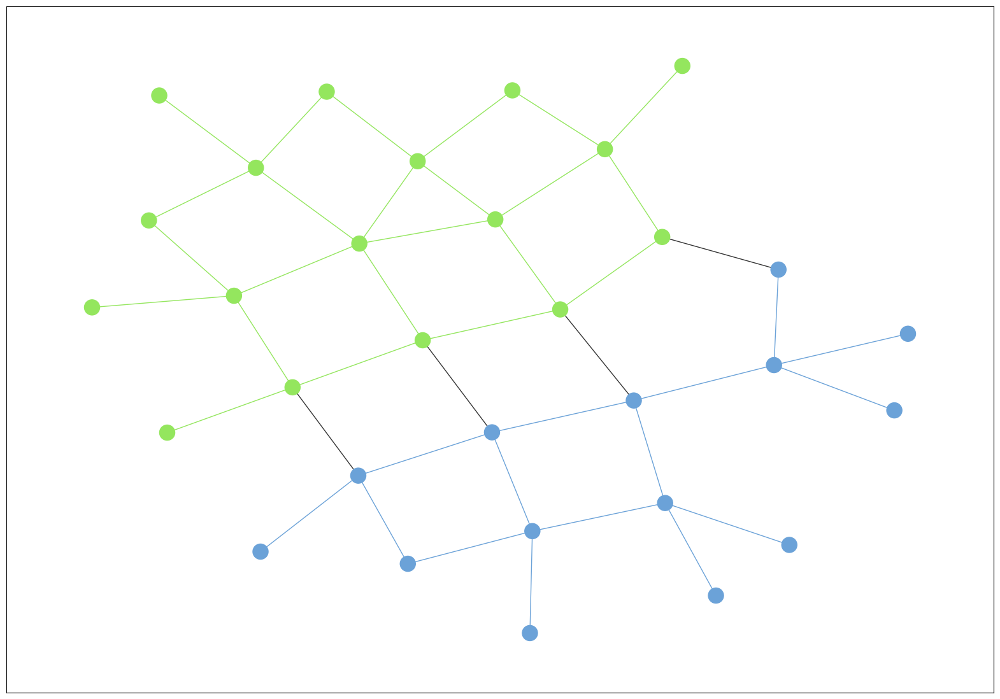

--------------------------------------------------
-------------------- Graph 9 --------------------


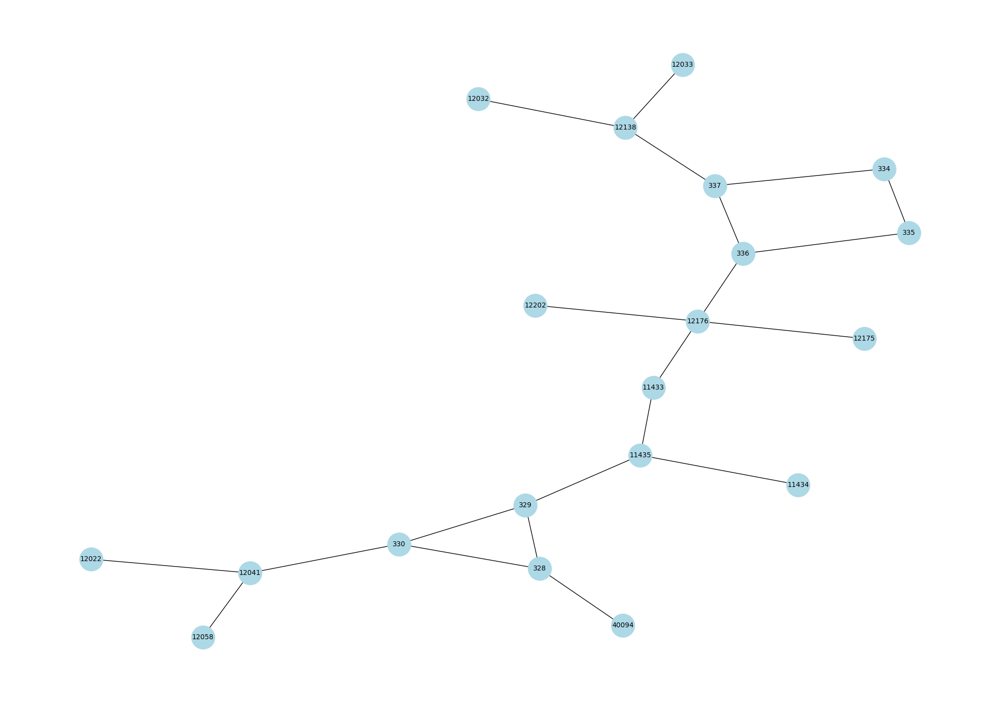

---------- Graph Stats  ----------
Nodes : 20 Edges : 20
Diameter : 10
Periphery : [12032, 12033, 12058, 12022]


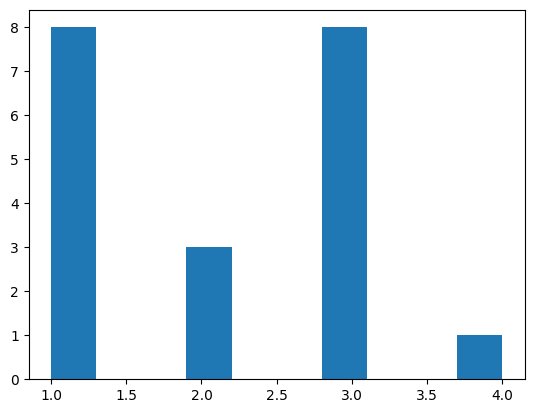

Density of the graph: 0.11052631578947368
Average degree: 2.1
Size of the largest connected component: 20
Degree assortativity coefficient: -0.4583333333333324
     Node  Degree Centrality
4   12176              0.211
13    330              0.158
2   12041              0.158
18  12138              0.158
17    337              0.158
16    336              0.158
9   11435              0.158
11    328              0.158
12    329              0.158
7   11433              0.105
15    335              0.105
14    334              0.105
0   12032              0.053
10  12202              0.053
1   12033              0.053
8   11434              0.053
6   40094              0.053
5   12058              0.053
3   12175              0.053
19  12022              0.053
     Node  Closeness Centrality
4   12176                 0.317
7   11433                 0.317
9   11435                 0.306
16    336                 0.288
12    329                 0.279
17    337                 0.250
10  122

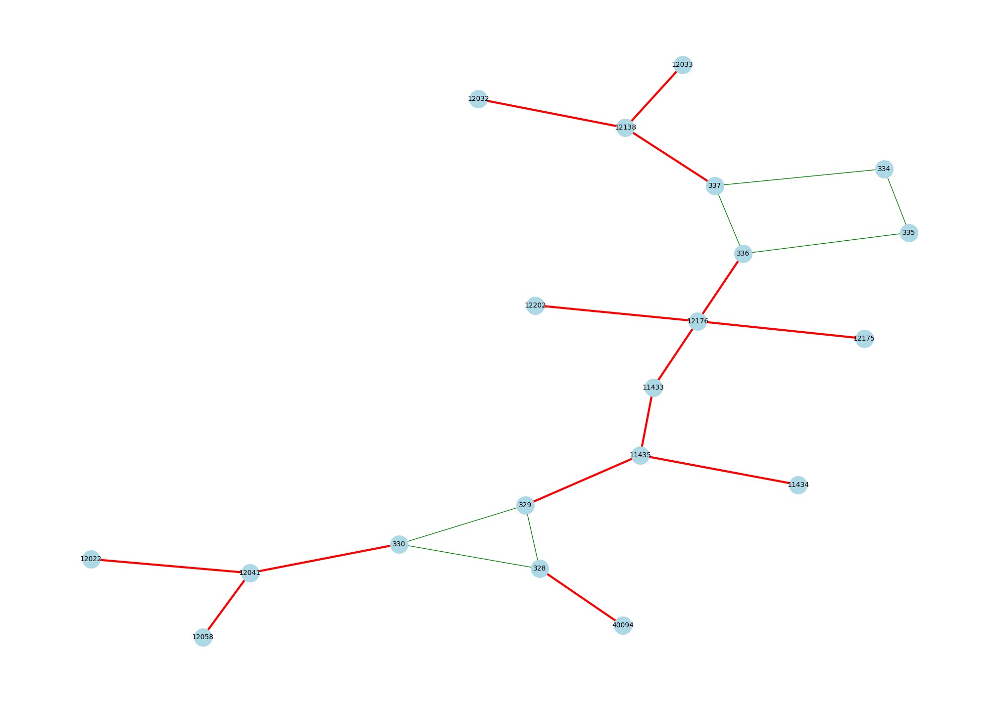

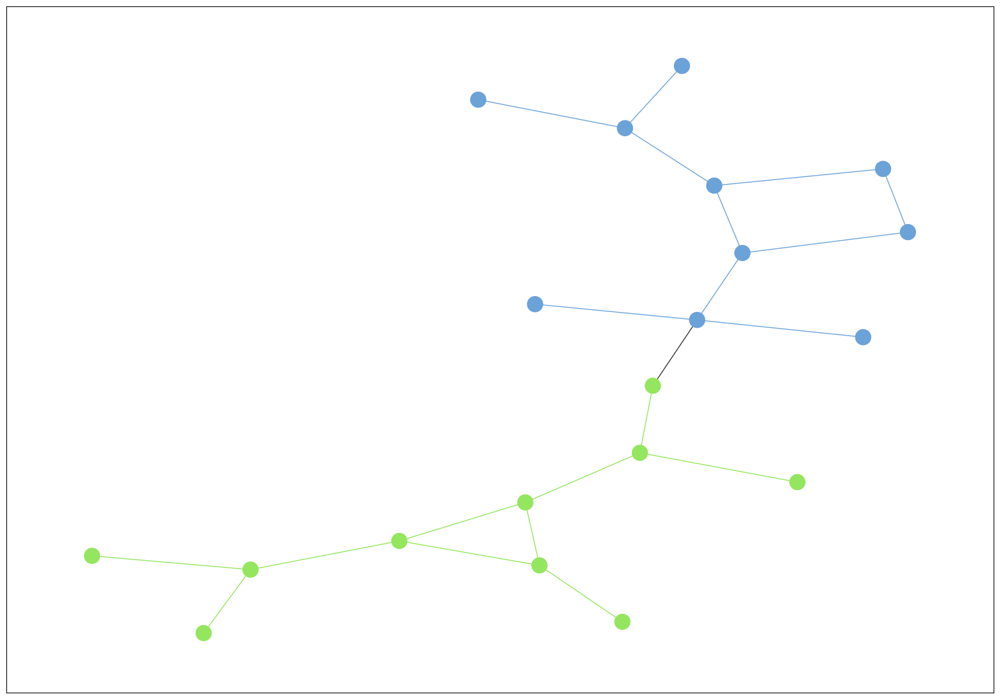

--------------------------------------------------
-------------------- Graph 10 --------------------


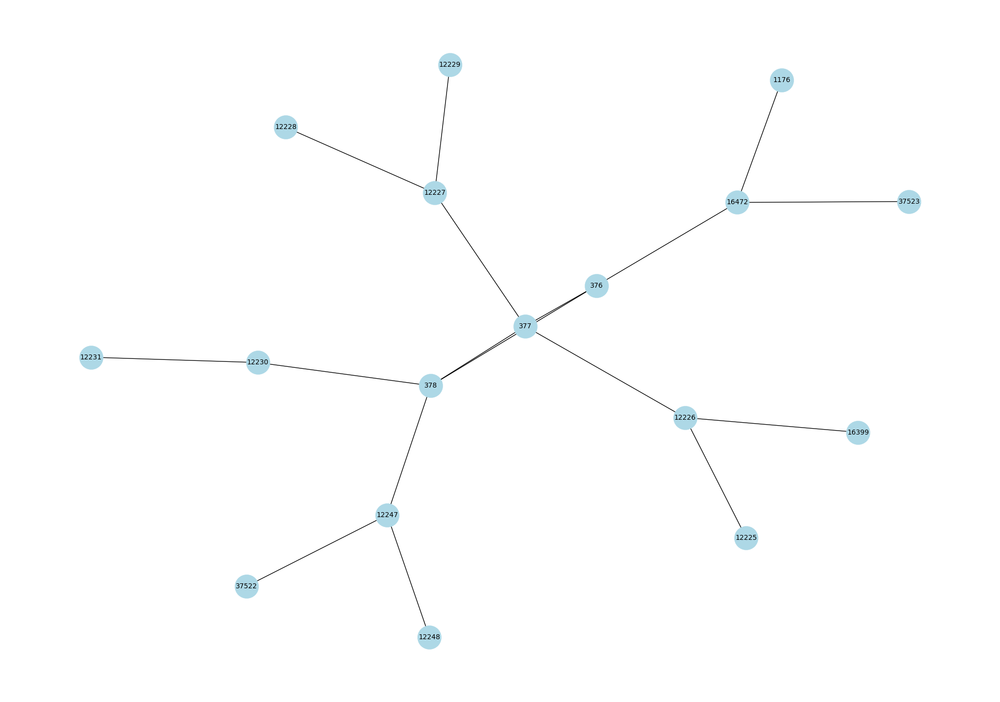

---------- Graph Stats  ----------
Nodes : 17 Edges : 17
Diameter : 5
Periphery : [12225, 12228, 12229, 12231, 16399, 37522, 37523, 1176, 12248]


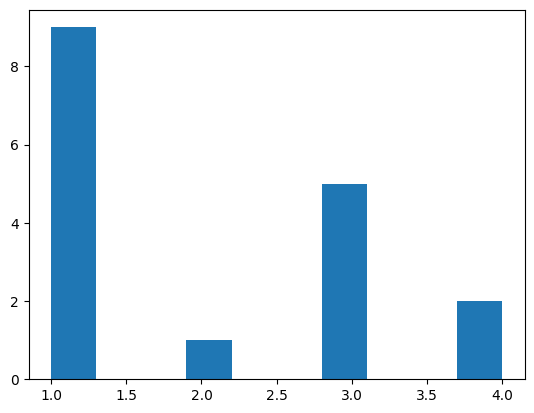

Density of the graph: 0.125
Average degree: 2.0
Size of the largest connected component: 17
Degree assortativity coefficient: -0.00563380281690109
     Node  Degree Centrality
13    378              0.250
12    377              0.250
10  12247              0.188
2   12227              0.188
14  16472              0.188
1   12226              0.188
11    376              0.188
5   12230              0.125
0   12225              0.062
15   1176              0.062
8   37522              0.062
9   37523              0.062
7   16399              0.062
6   12231              0.062
4   12229              0.062
3   12228              0.062
16  12248              0.062
     Node  Closeness Centrality
12    377                 0.485
13    378                 0.471
11    376                 0.444
2   12227                 0.364
1   12226                 0.364
10  12247                 0.356
5   12230                 0.340
14  16472                 0.340
0   12225                 0.271
3   12228  

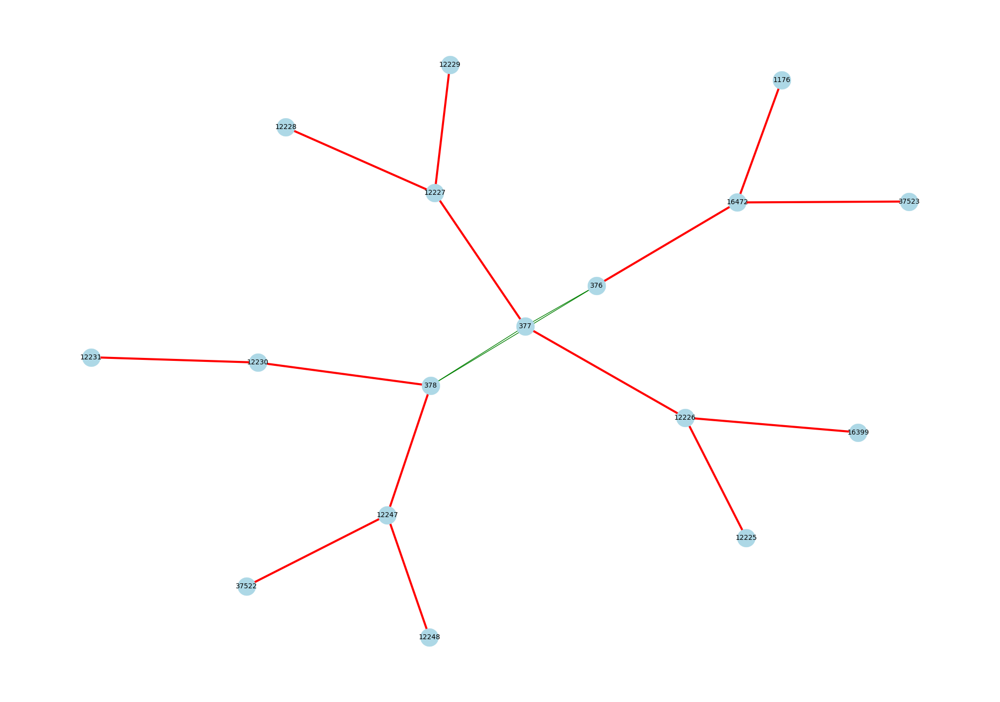

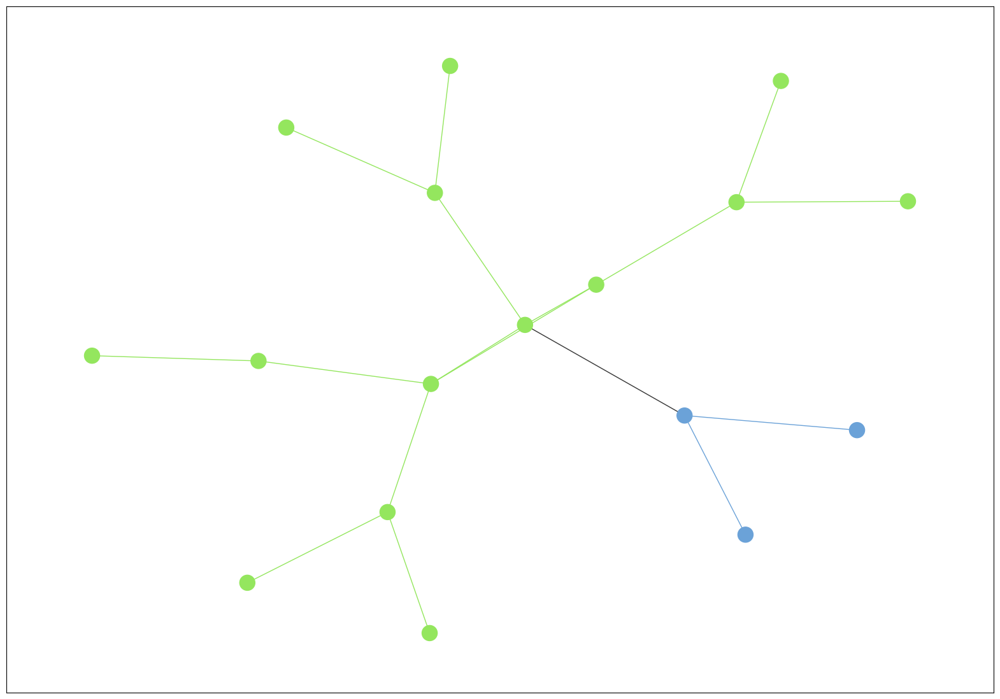

--------------------------------------------------
-------------------- Graph 11 --------------------


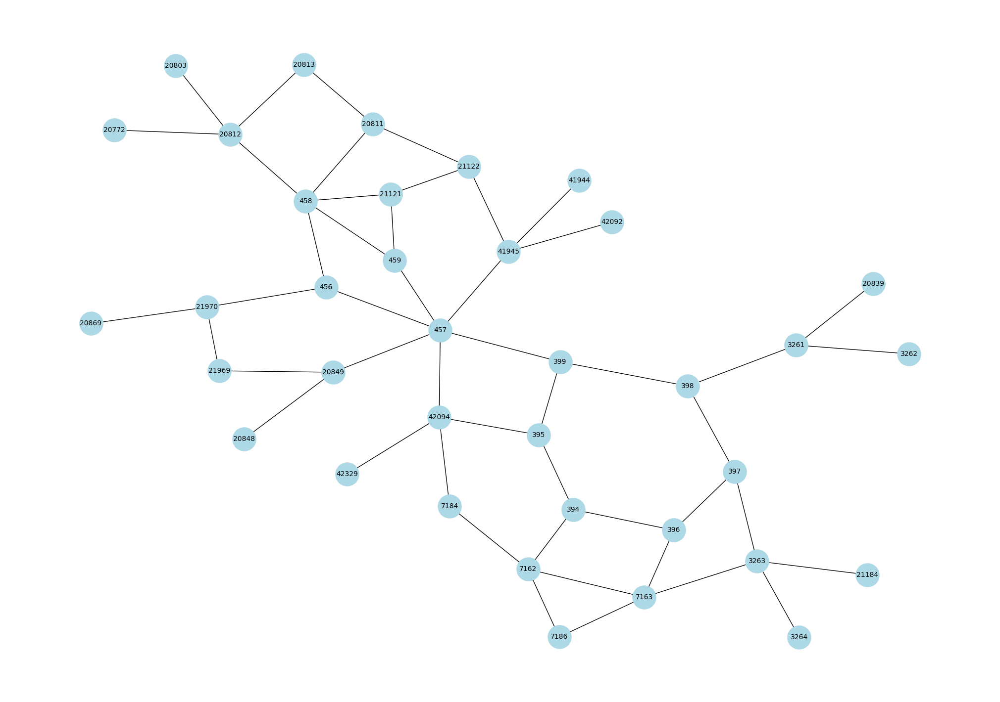

---------- Graph Stats  ----------
Nodes : 37 Edges : 37
Diameter : 9
Periphery : [20772, 3264, 21184, 20803, 20813]


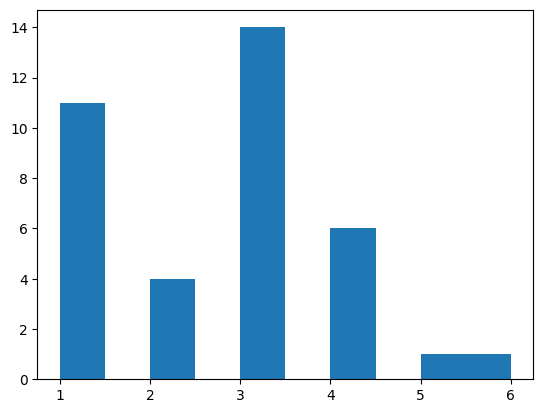

Density of the graph: 0.07207207207207207
Average degree: 2.5945945945945947
Size of the largest connected component: 37
Degree assortativity coefficient: -0.15895372233400676
     Node  Degree Centrality
19    457              0.167
20    458              0.139
36   7163              0.111
14   3263              0.111
35   7162              0.111
32  42094              0.111
29  41945              0.111
23  20812              0.111
34  20849              0.083
26  21970              0.083
22  20811              0.083
21    459              0.083
1   21122              0.083
0   21121              0.083
18    456              0.083
7     398              0.083
3     394              0.083
4     395              0.083
12   3261              0.083
5     396              0.083
6     397              0.083
8     399              0.083
24  20813              0.056
25  21969              0.056
9    7184              0.056
10   7186              0.056
15   3264              0.028
27  41944   

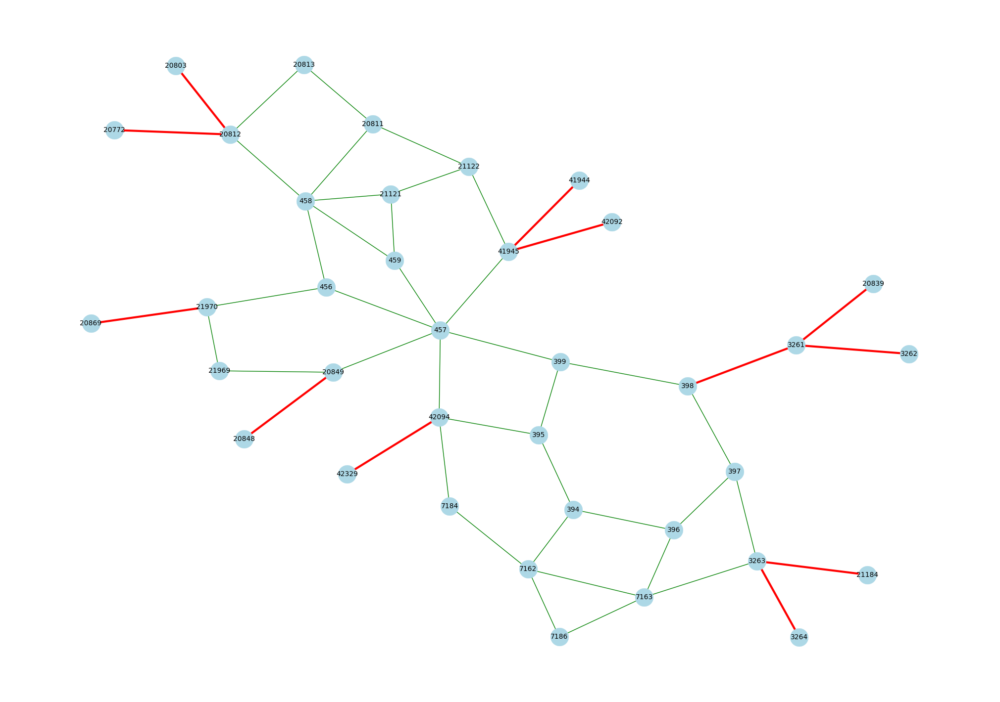

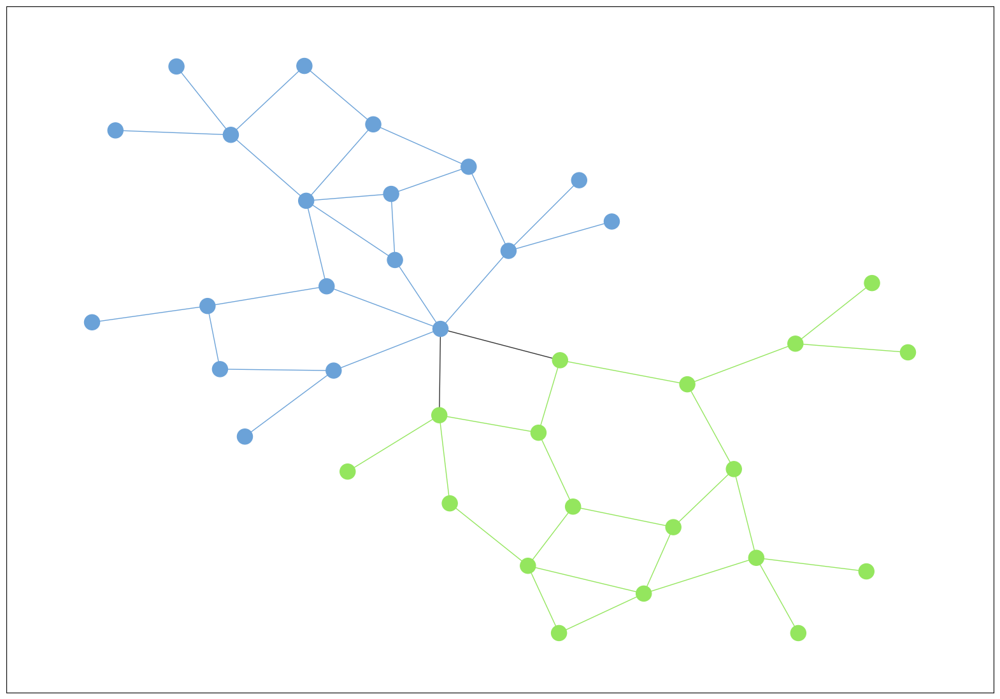

--------------------------------------------------
-------------------- Graph 12 --------------------


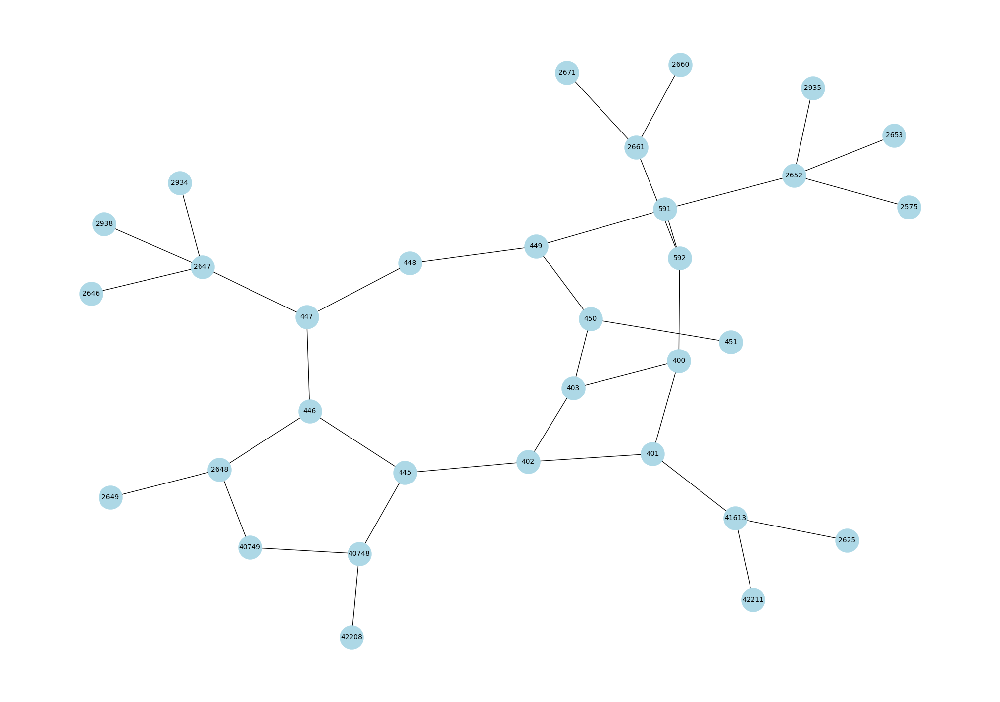

---------- Graph Stats  ----------
Nodes : 32 Edges : 32
Diameter : 9
Periphery : [2575, 2649, 2653, 42208, 2660, 2671, 2935]


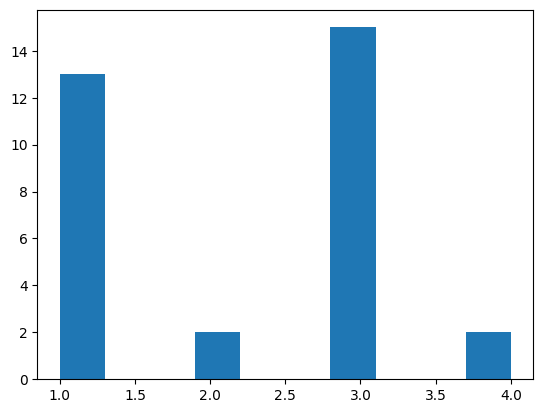

Density of the graph: 0.07056451612903226
Average degree: 2.1875
Size of the largest connected component: 32
Degree assortativity coefficient: -0.5415415415415425
     Node  Degree Centrality
22   2652              0.129
19   2647              0.129
0   41613              0.097
10    447              0.097
27   2661              0.097
20   2648              0.097
17    592              0.097
14    449              0.097
13    450              0.097
16    591              0.097
9     446              0.097
8     445              0.097
6   40748              0.097
2     400              0.097
5     403              0.097
4     402              0.097
3     401              0.097
7   40749              0.065
11    448              0.065
25  42211              0.032
30   2935              0.032
29   2934              0.032
28   2671              0.032
26   2660              0.032
21   2649              0.032
24  42208              0.032
23   2653              0.032
18   2646              0.

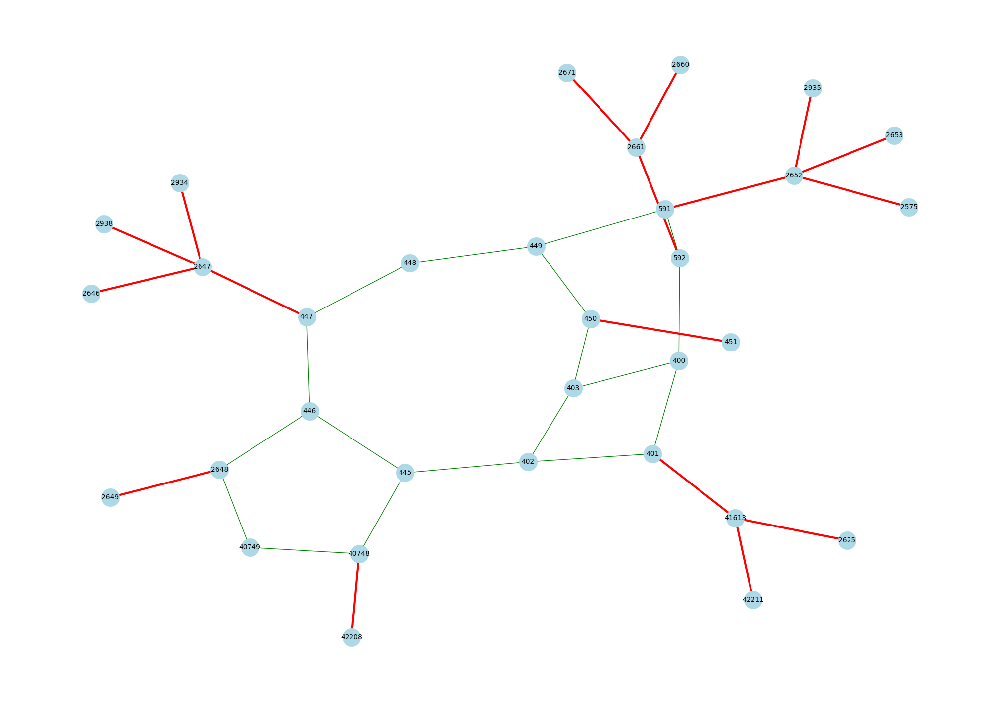

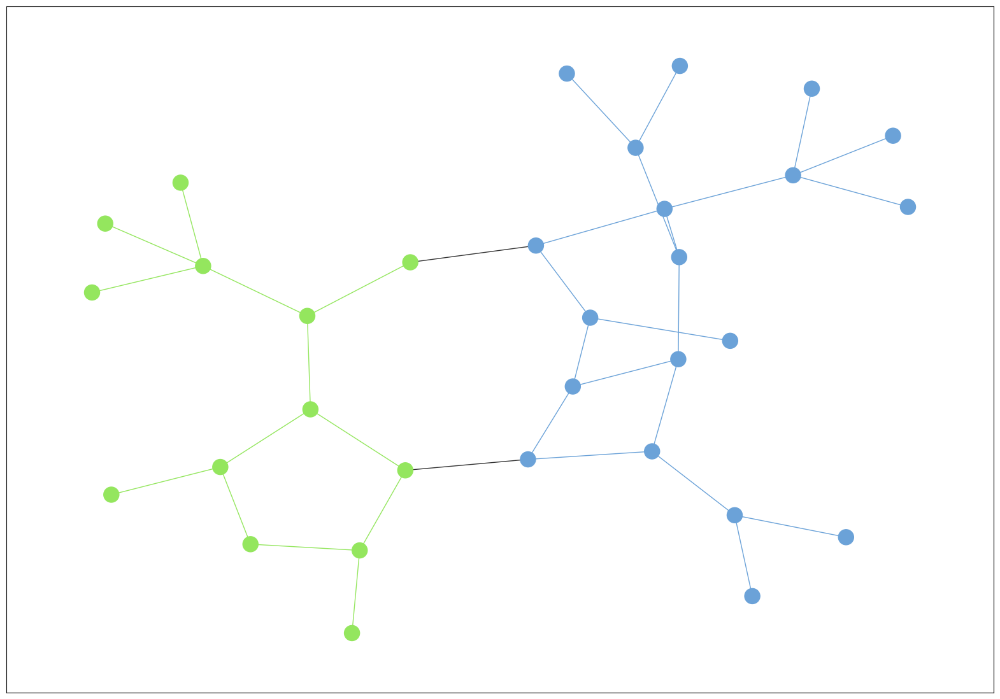

--------------------------------------------------
-------------------- Graph 13 --------------------


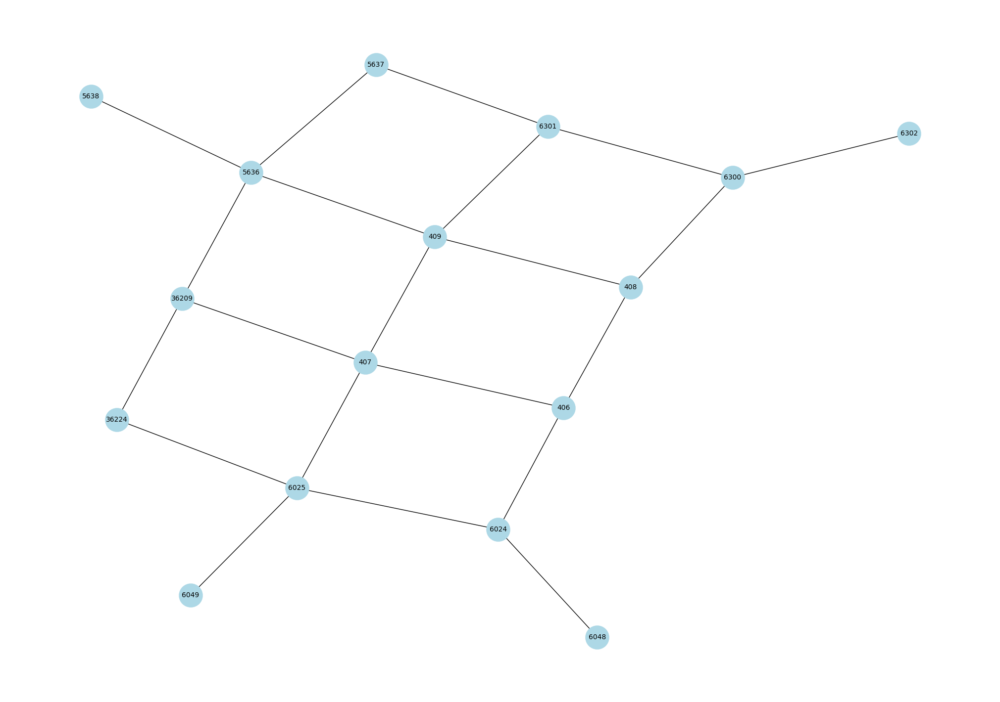

---------- Graph Stats  ----------
Nodes : 16 Edges : 16
Diameter : 6
Periphery : [6048, 6049, 36224, 5637, 5638, 6302]


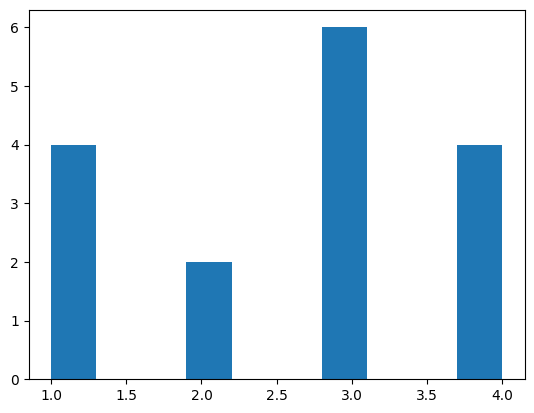

Density of the graph: 0.175
Average degree: 2.625
Size of the largest connected component: 16
Degree assortativity coefficient: -0.17914438502674013
     Node  Degree Centrality
3    5636              0.267
7    6025              0.267
10    407              0.267
12    409              0.267
6    6024              0.200
8   36209              0.200
9     406              0.200
11    408              0.200
13   6300              0.200
14   6301              0.200
2   36224              0.133
4    5637              0.133
0    6048              0.067
1    6049              0.067
5    5638              0.067
15   6302              0.067
     Node  Closeness Centrality
10    407                 0.469
12    409                 0.469
9     406                 0.417
11    408                 0.417
3    5636                 0.395
7    6025                 0.395
8   36209                 0.395
14   6301                 0.375
6    6024                 0.357
2   36224                 0.341
13   6

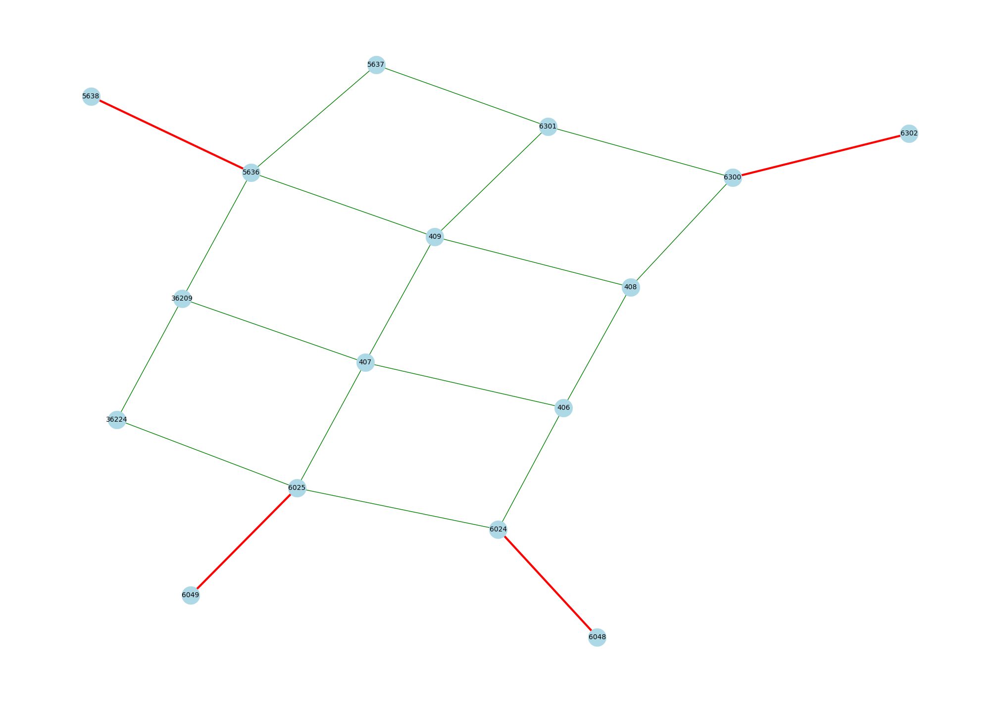

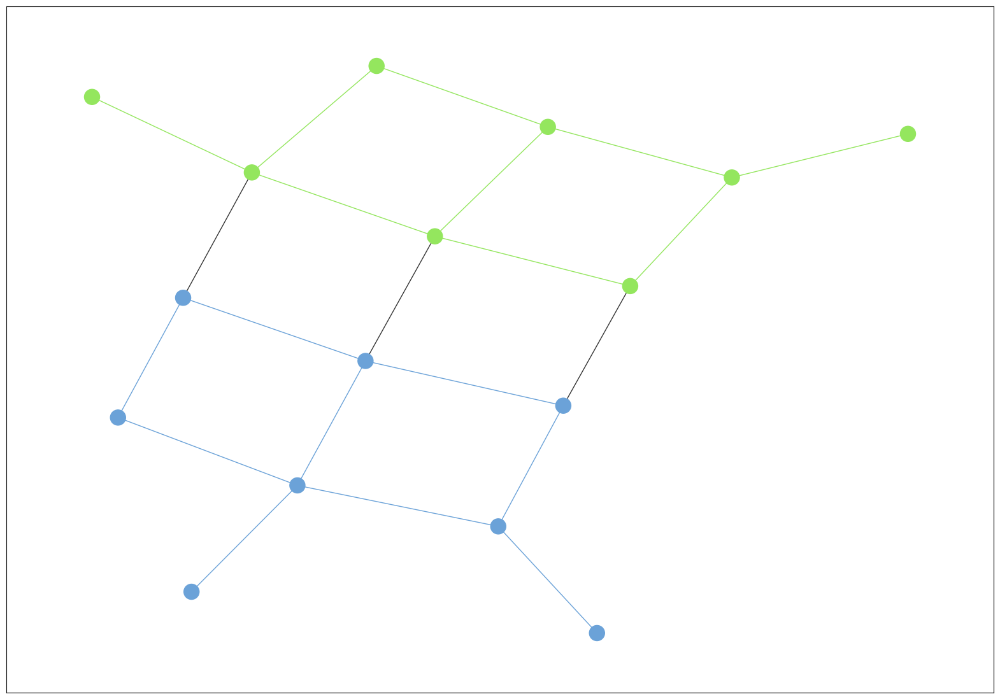

--------------------------------------------------
-------------------- Graph 14 --------------------


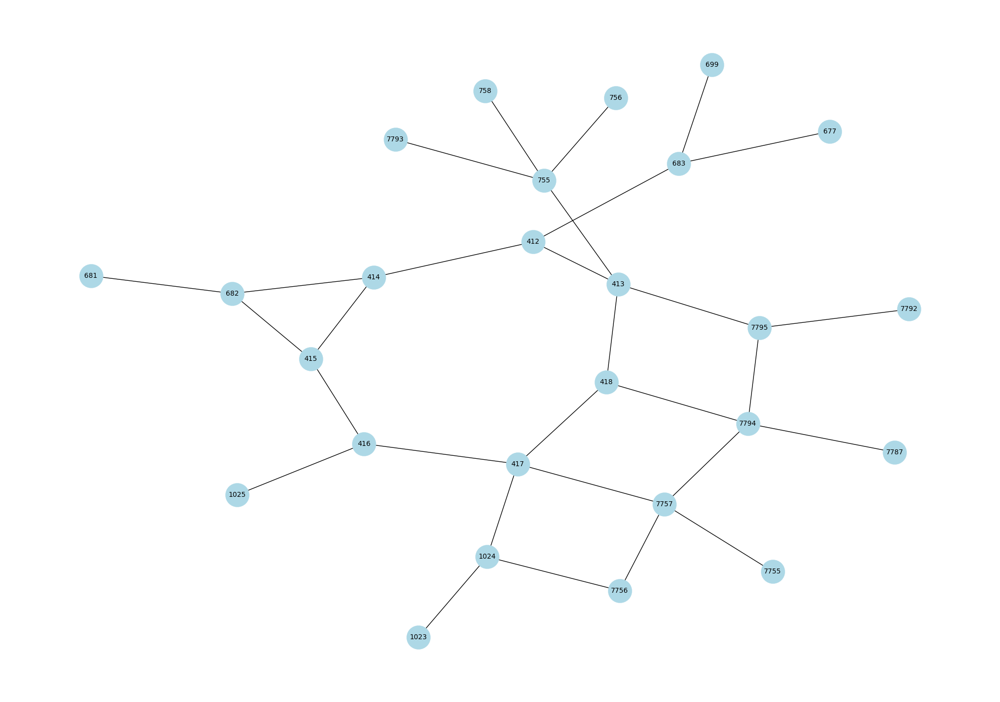

---------- Graph Stats  ----------
Nodes : 26 Edges : 26
Diameter : 7
Periphery : [677, 681, 699, 7755, 7756, 7787, 1023]


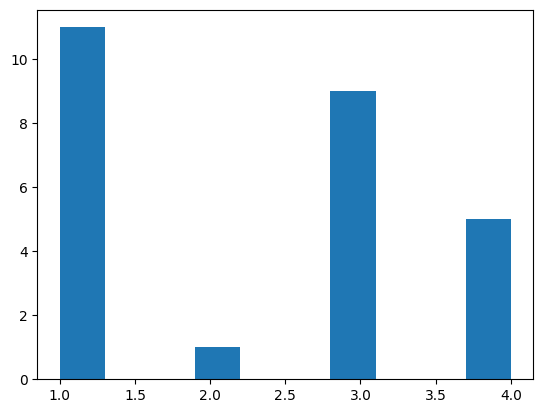

Density of the graph: 0.09230769230769231
Average degree: 2.3076923076923075
Size of the largest connected component: 26
Degree assortativity coefficient: -0.24746450304259682
    Node  Degree Centrality
20  7794               0.16
16  7757               0.16
3    413               0.16
21   755               0.16
7    417               0.16
11   682               0.12
22  7795               0.12
12   683               0.12
0   1024               0.12
8    418               0.12
6    416               0.12
5    415               0.12
4    414               0.12
2    412               0.12
15  7756               0.08
19  7793               0.04
23   756               0.04
24   758               0.04
13   699               0.04
18  7792               0.04
17  7787               0.04
14  7755               0.04
1   1025               0.04
10   681               0.04
9    677               0.04
25  1023               0.04
    Node  Closeness Centrality
3    413                 0.391
8    4

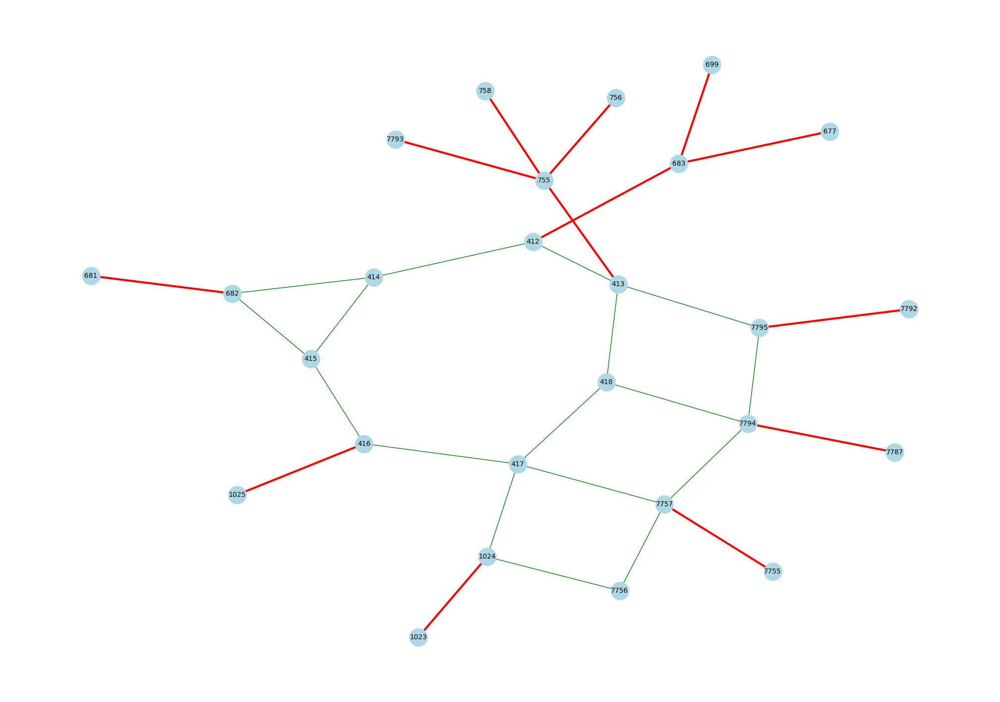

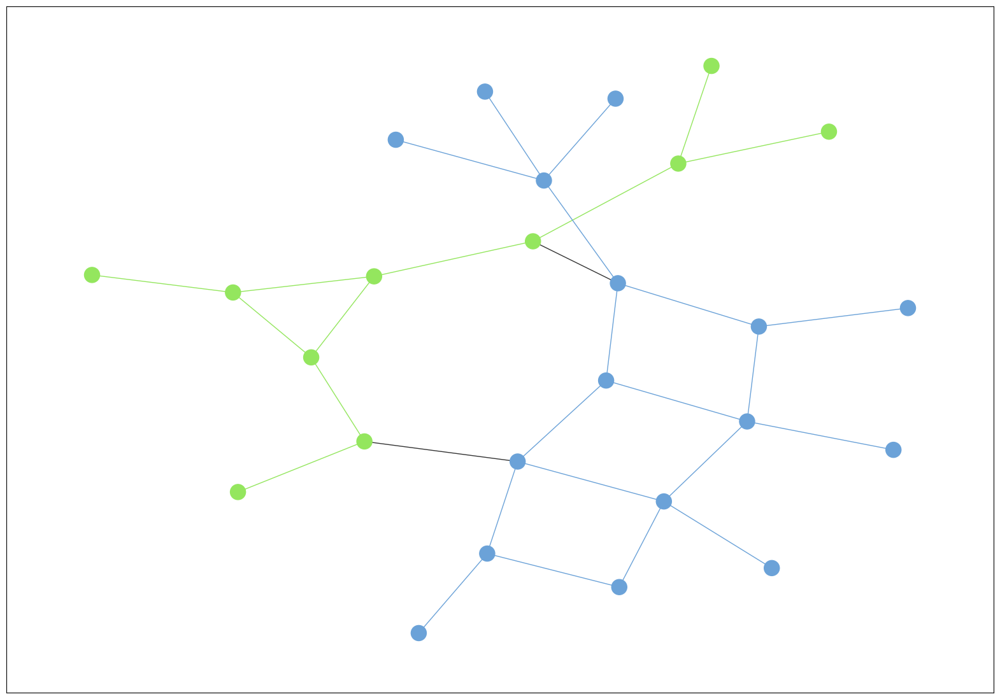

--------------------------------------------------
-------------------- Graph 15 --------------------


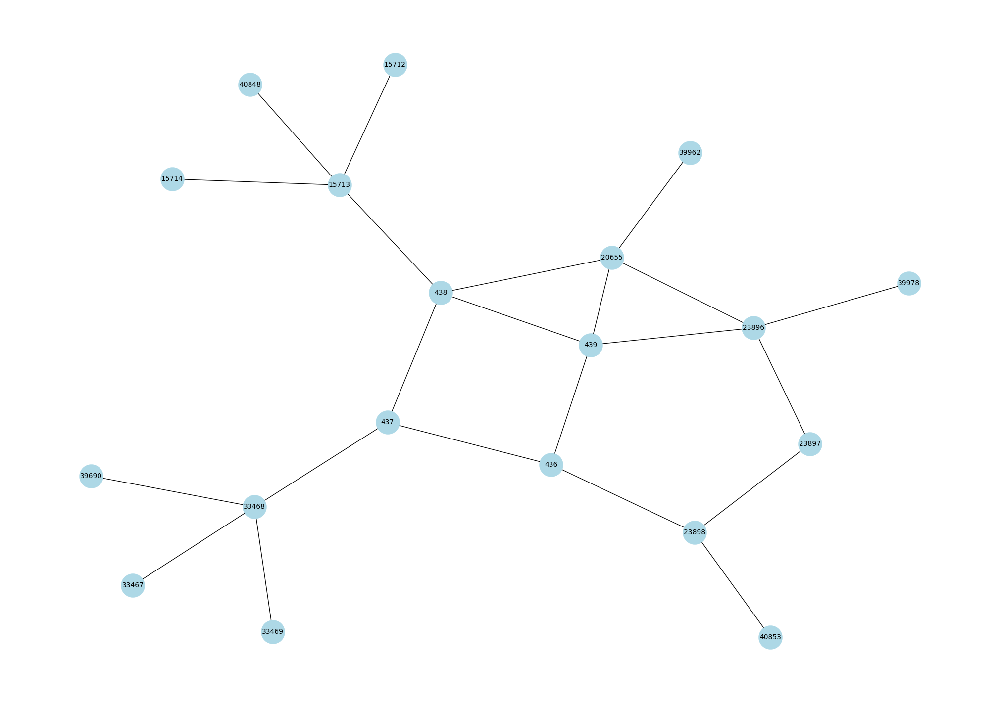

---------- Graph Stats  ----------
Nodes : 19 Edges : 19
Diameter : 6
Periphery : [39690, 40848, 40853, 39978, 33467, 33469, 15712, 15714]


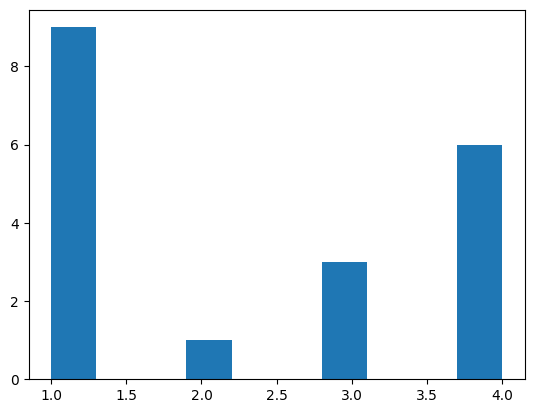

Density of the graph: 0.1286549707602339
Average degree: 2.3157894736842106
Size of the largest connected component: 19
Degree assortativity coefficient: -0.3628318584070792
     Node  Degree Centrality
9     439              0.222
17  15713              0.222
5   20655              0.222
8     438              0.222
13  23896              0.222
11  33468              0.222
15  23898              0.167
6     436              0.167
7     437              0.167
14  23897              0.111
12  33469              0.056
16  15712              0.056
0   39690              0.056
10  33467              0.056
1   40848              0.056
4   39978              0.056
3   39962              0.056
2   40853              0.056
18  15714              0.056
     Node  Closeness Centrality
8     438                 0.450
7     437                 0.429
9     439                 0.419
5   20655                 0.400
6     436                 0.400
17  15713                 0.353
13  23896             

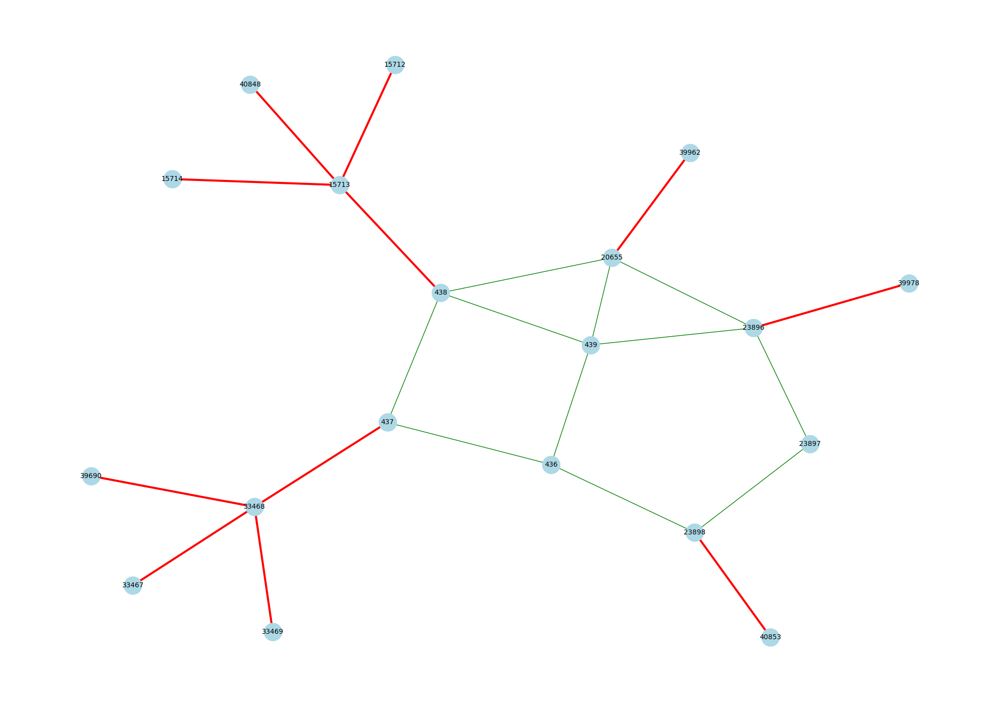

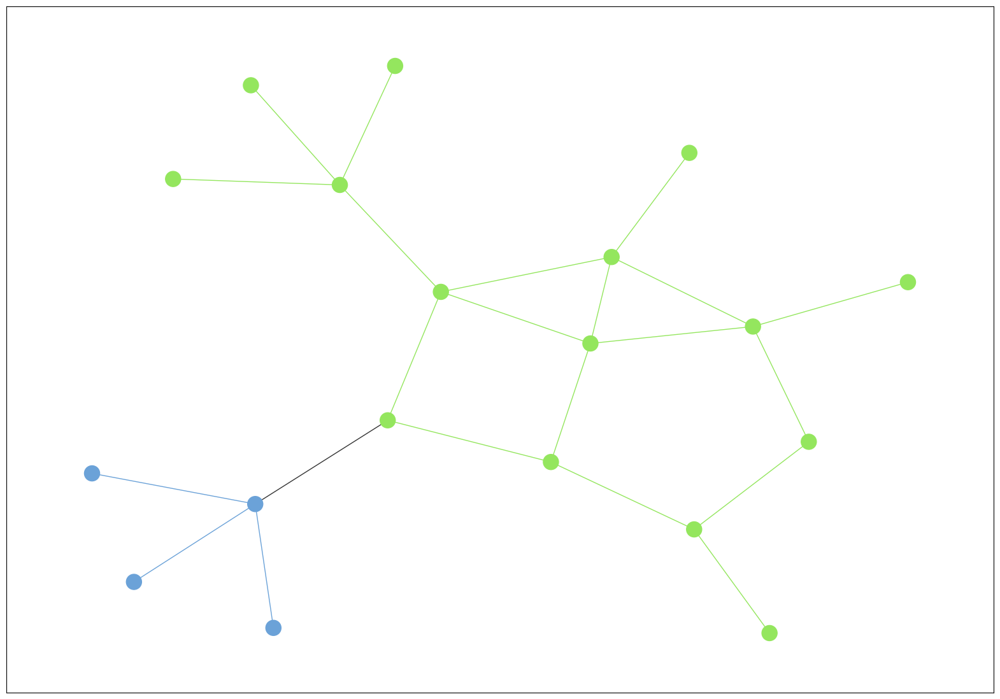

--------------------------------------------------
-------------------- Graph 16 --------------------


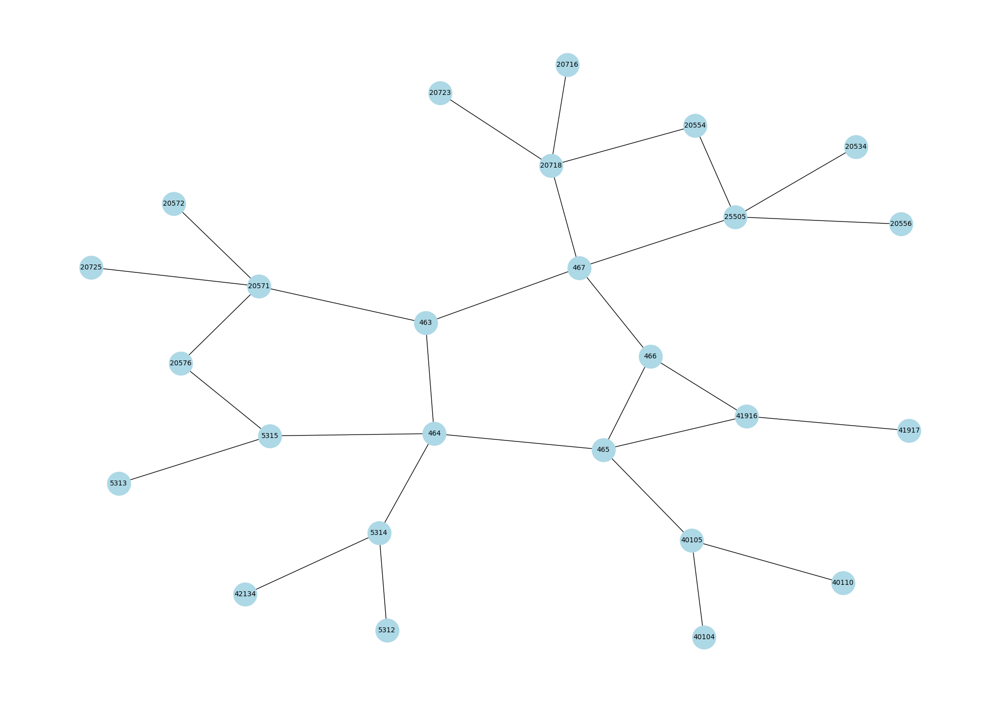

---------- Graph Stats  ----------
Nodes : 26 Edges : 26
Diameter : 6
Periphery : [42134, 40104, 40110, 20534, 41917, 5312, 5313, 20554, 20556, 20572, 20716, 20723, 20725]


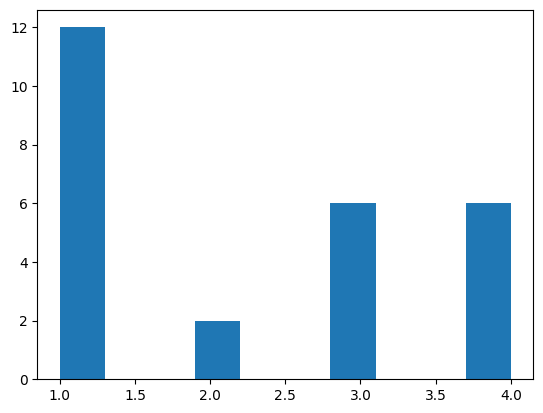

Density of the graph: 0.08923076923076922
Average degree: 2.230769230769231
Size of the largest connected component: 26
Degree assortativity coefficient: -0.3205828779599262
     Node  Degree Centrality
19  20571               0.16
18    467               0.16
16    465               0.16
15    464               0.16
23  20718               0.16
1   25505               0.16
14    463               0.12
11   5315               0.12
10   5314               0.12
17    466               0.12
6   41916               0.12
3   40105               0.12
21  20576               0.08
12  20554               0.08
20  20572               0.04
22  20716               0.04
24  20723               0.04
0   42134               0.04
13  20556               0.04
9    5313               0.04
8    5312               0.04
7   41917               0.04
5   20534               0.04
4   40110               0.04
2   40104               0.04
25  20725               0.04
     Node  Closeness Centrality
18    467  

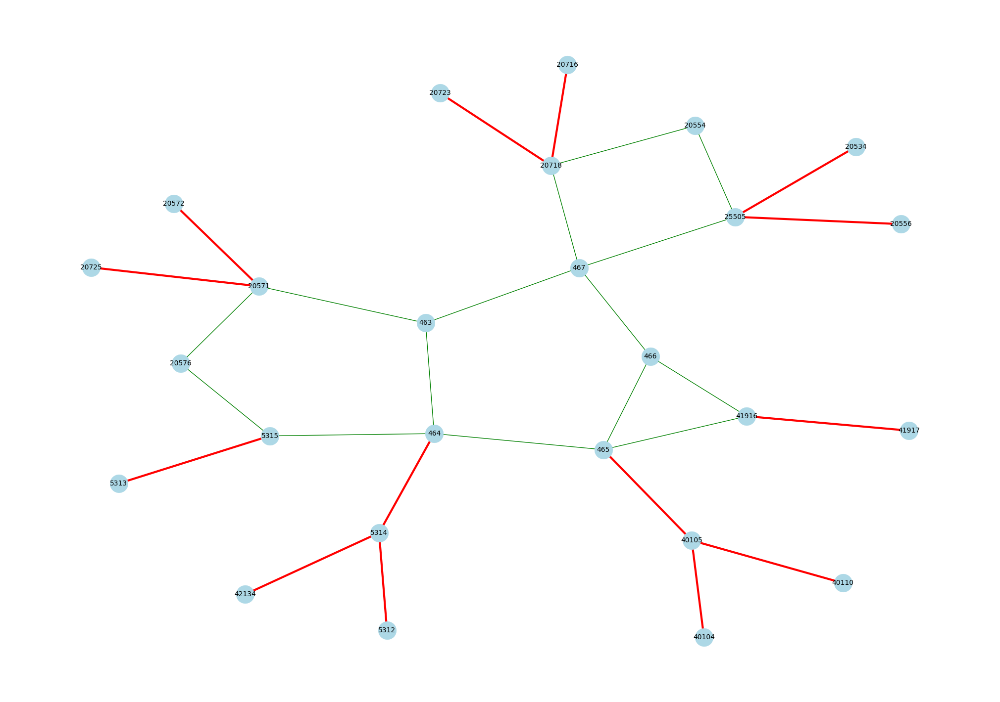

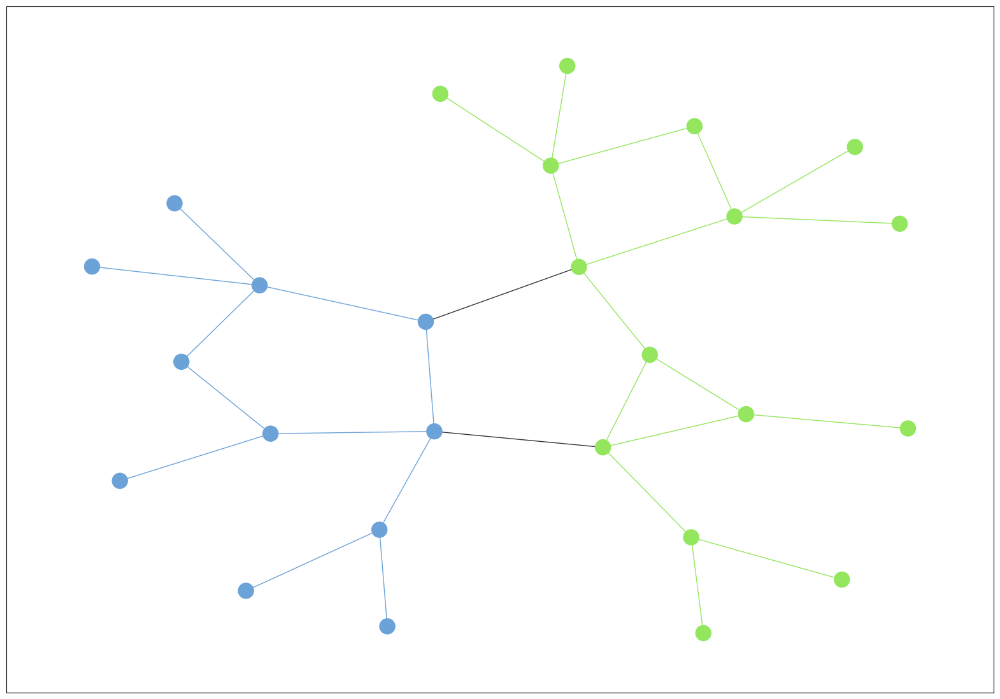

--------------------------------------------------
-------------------- Graph 17 --------------------


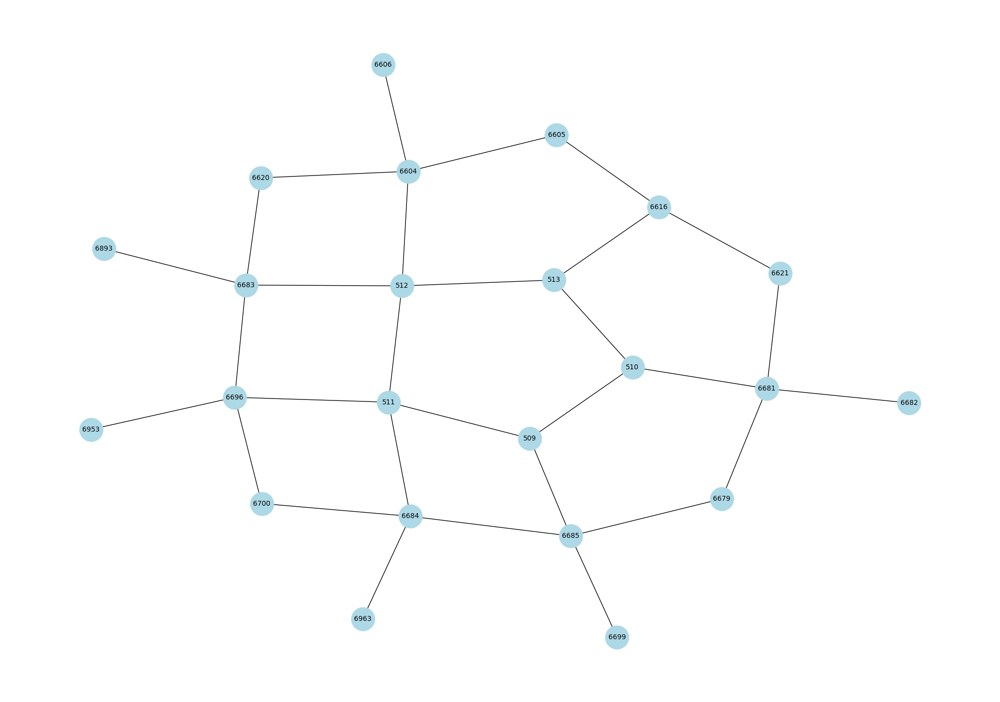

---------- Graph Stats  ----------
Nodes : 23 Edges : 23
Diameter : 6
Periphery : [6679, 6682, 6953, 6699, 6605, 6606, 6620, 6621, 6893]


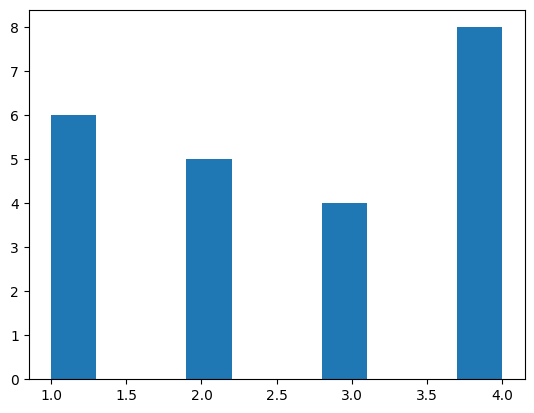

Density of the graph: 0.11857707509881422
Average degree: 2.608695652173913
Size of the largest connected component: 23
Degree assortativity coefficient: -0.4300518134715037
    Node  Degree Centrality
0    512              0.182
6   6684              0.182
13  6604              0.182
8   6696              0.182
7   6685              0.182
22   511              0.182
5   6683              0.182
3   6681              0.182
16  6616              0.136
21   510              0.136
20   509              0.136
1    513              0.136
18  6621              0.091
17  6620              0.091
14  6605              0.091
2   6679              0.091
11  6700              0.091
15  6606              0.045
4   6682              0.045
12  6963              0.045
19  6893              0.045
10  6699              0.045
9   6953              0.045
    Node  Closeness Centrality
0    512                 0.423
22   511                 0.423
20   509                 0.386
1    513                 0.386

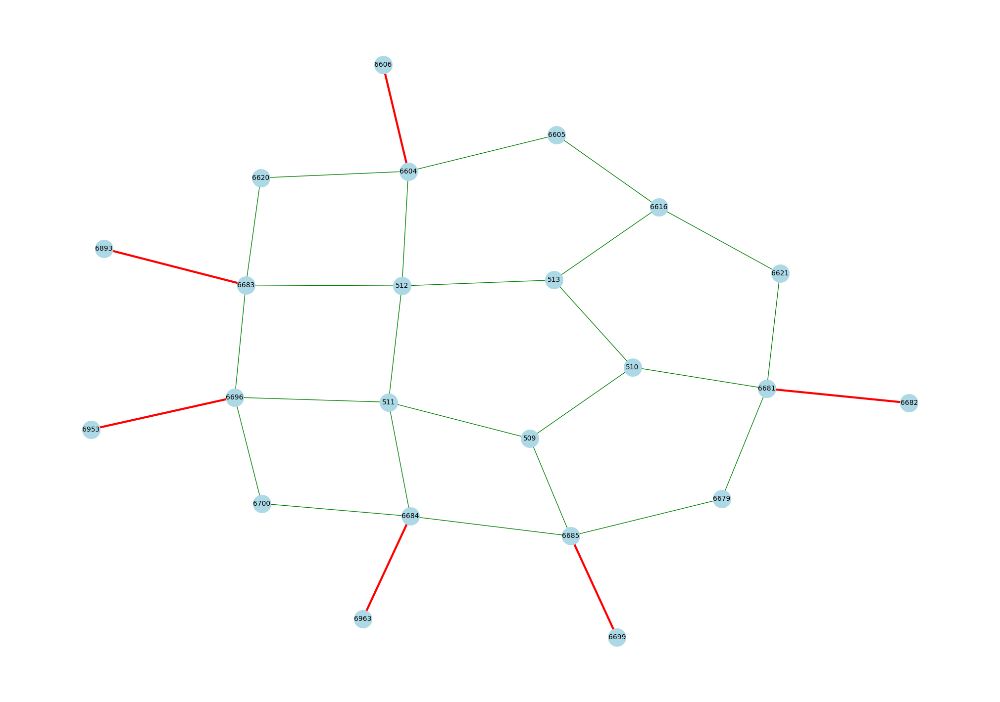

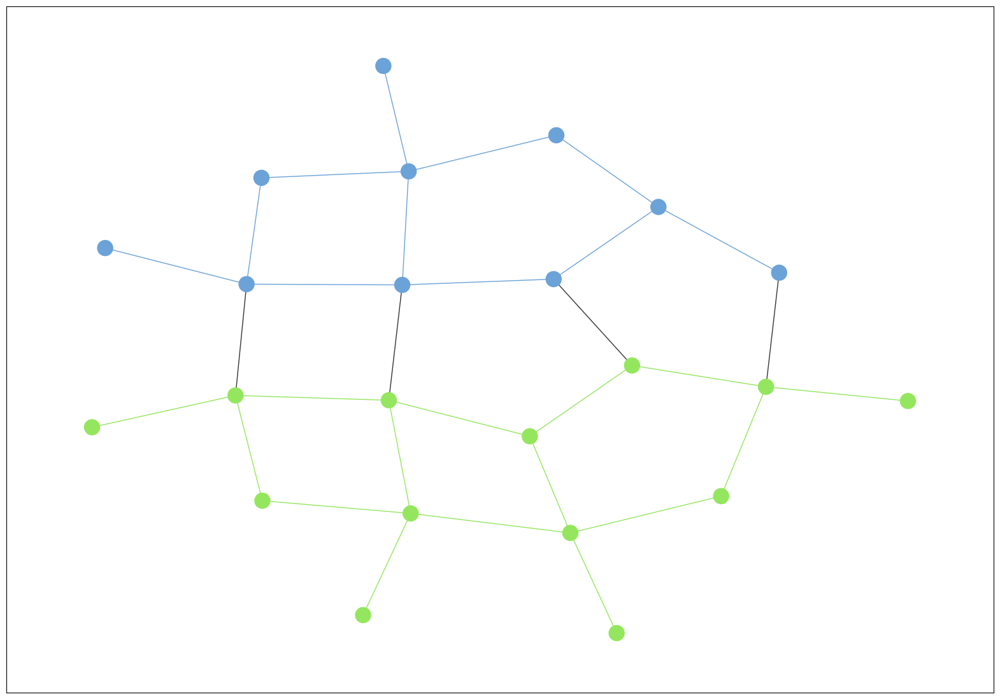

--------------------------------------------------
-------------------- Graph 18 --------------------


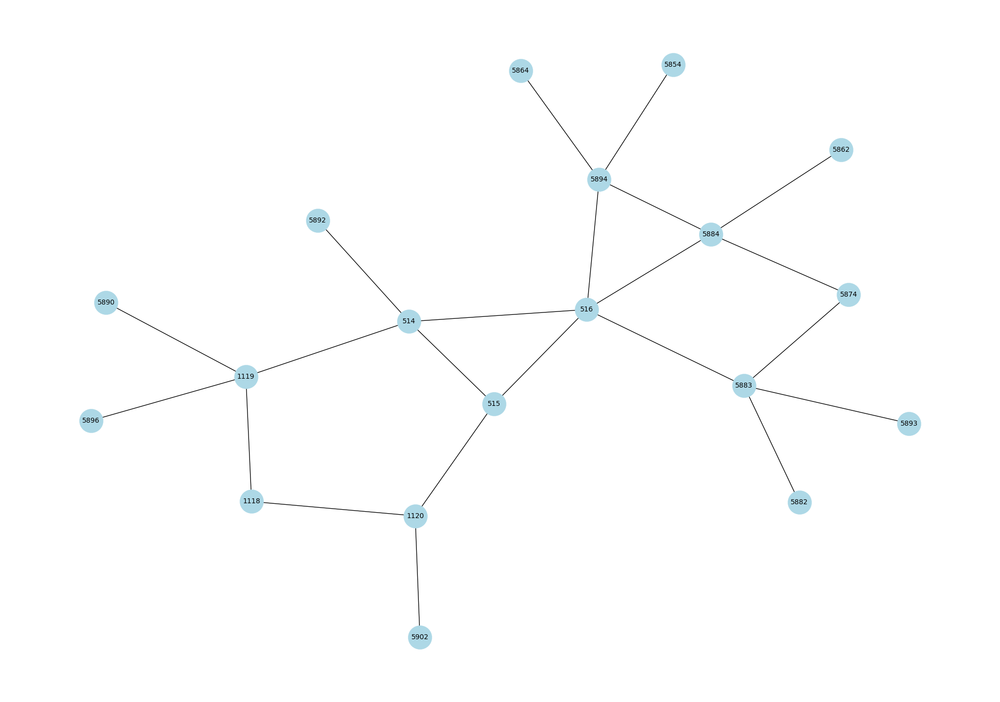

---------- Graph Stats  ----------
Nodes : 19 Edges : 19
Diameter : 5
Periphery : [5890, 5896, 5893, 5902, 1118, 5854, 5862, 5864, 5874, 5882]


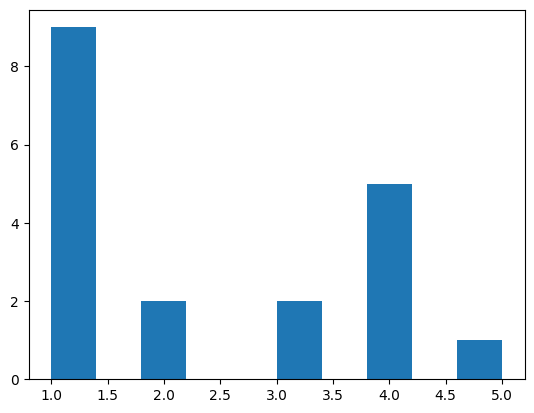

Density of the graph: 0.1286549707602339
Average degree: 2.3157894736842106
Size of the largest connected component: 19
Degree assortativity coefficient: -0.24768518518518623
    Node  Degree Centrality
2    516              0.278
0    514              0.222
12  1119              0.222
17  5883              0.222
18  5884              0.222
4   5894              0.222
1    515              0.167
11  1120              0.167
15  5874              0.111
9   1118              0.111
5   5890              0.056
6   5896              0.056
7   5893              0.056
8   5902              0.056
10  5854              0.056
13  5862              0.056
14  5864              0.056
16  5882              0.056
3   5892              0.056
    Node  Closeness Centrality
2    516                 0.514
0    514                 0.462
1    515                 0.439
4   5894                 0.400
18  5884                 0.400
17  5883                 0.391
12  1119                 0.375
11  1120         

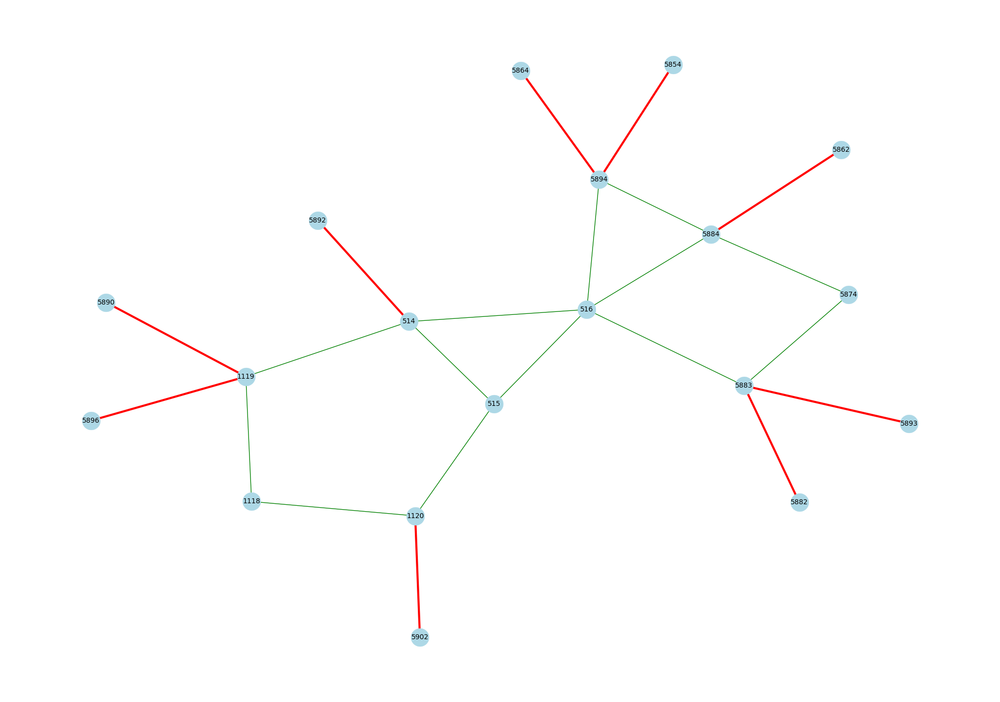

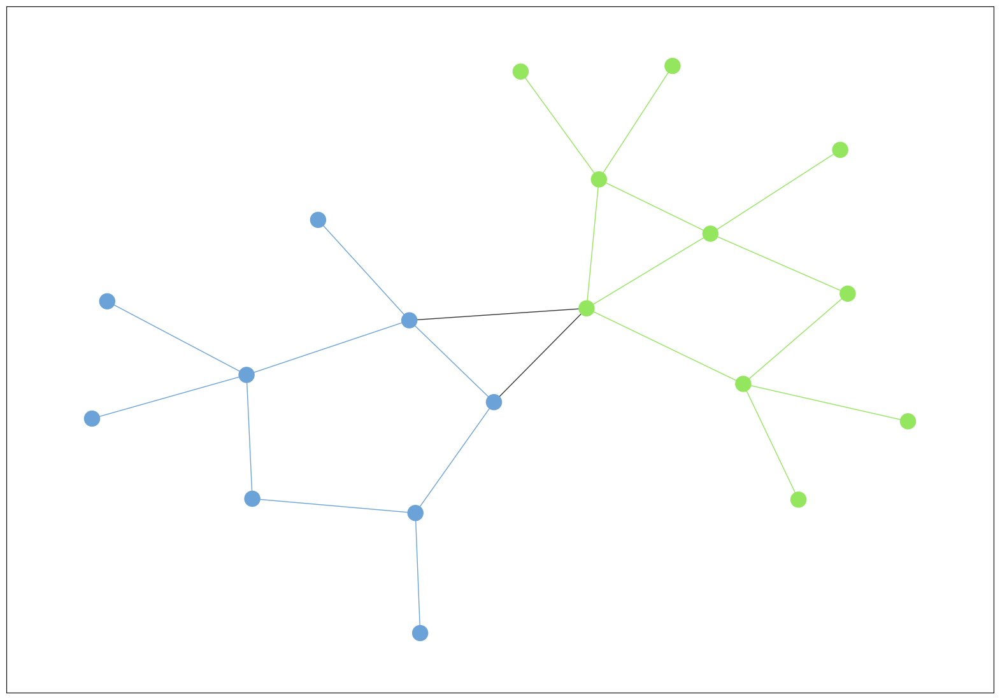

--------------------------------------------------
-------------------- Graph 19 --------------------


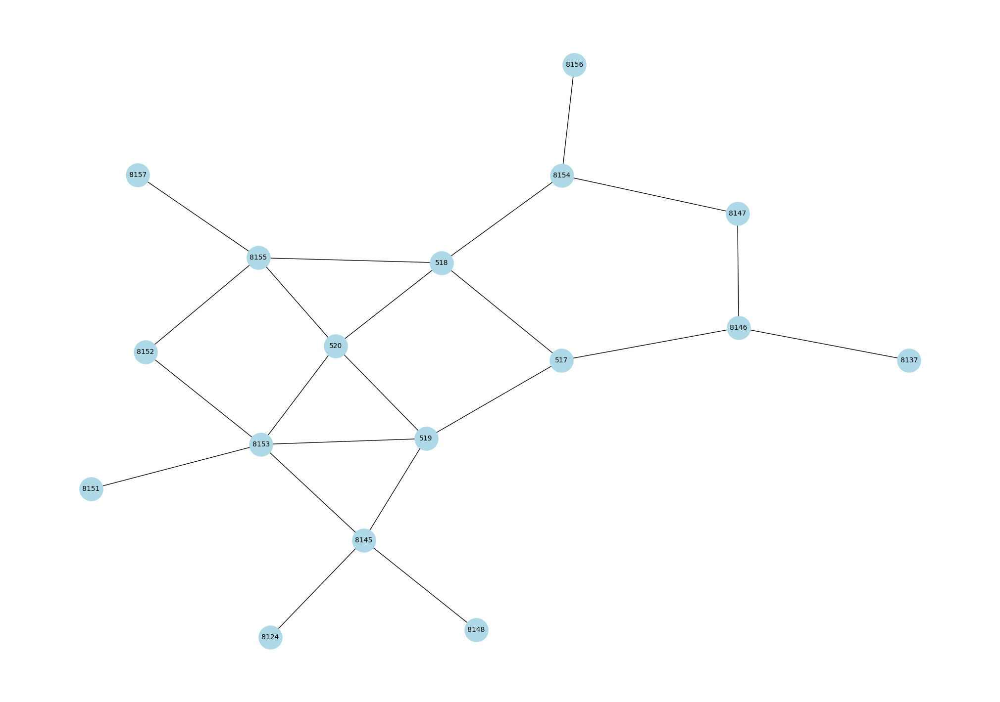

---------- Graph Stats  ----------
Nodes : 17 Edges : 17
Diameter : 6
Periphery : [8156, 8148, 8124]


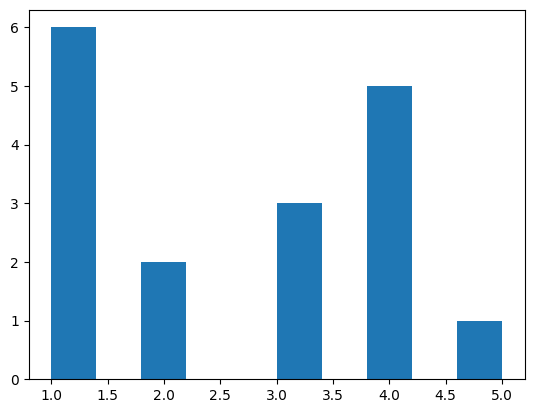

Density of the graph: 0.16176470588235295
Average degree: 2.588235294117647
Size of the largest connected component: 17
Degree assortativity coefficient: -0.13304721030042904
    Node  Degree Centrality
12  8153              0.312
2    519              0.250
3    520              0.250
14  8155              0.250
6   8145              0.250
1    518              0.250
0    517              0.188
13  8154              0.188
7   8146              0.188
11  8152              0.125
8   8147              0.125
10  8151              0.062
9   8148              0.062
5   8156              0.062
4   8137              0.062
15  8124              0.062
16  8157              0.062
    Node  Closeness Centrality
2    519                 0.471
0    517                 0.457
3    520                 0.457
1    518                 0.457
12  8153                 0.444
14  8155                 0.410
6   8145                 0.381
11  8152                 0.372
13  8154                 0.364
7   8146   

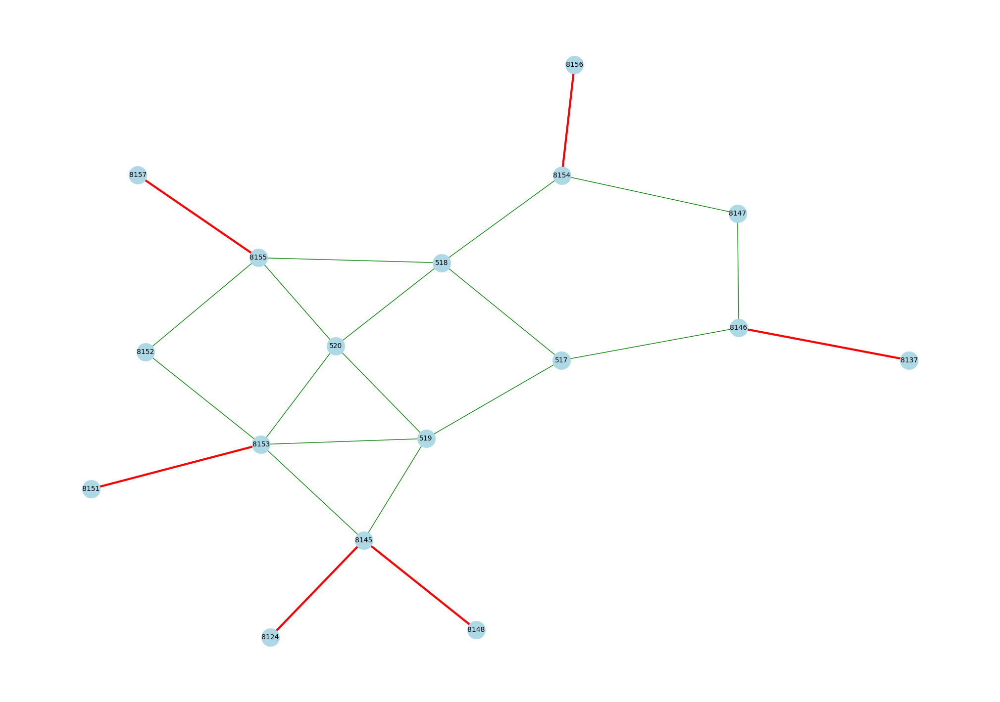

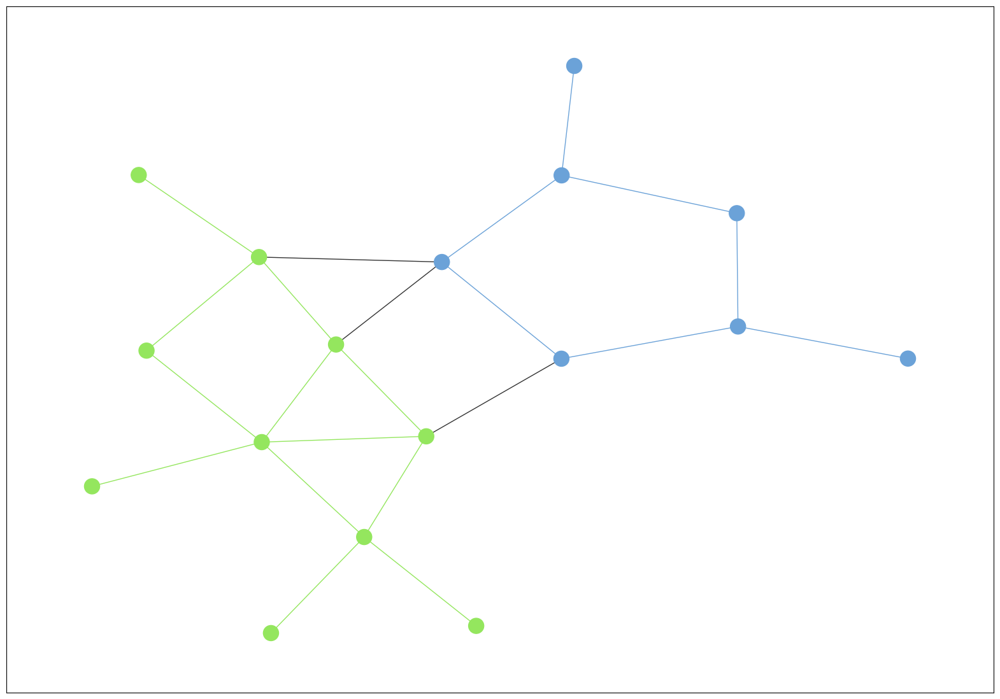

--------------------------------------------------
-------------------- Graph 20 --------------------


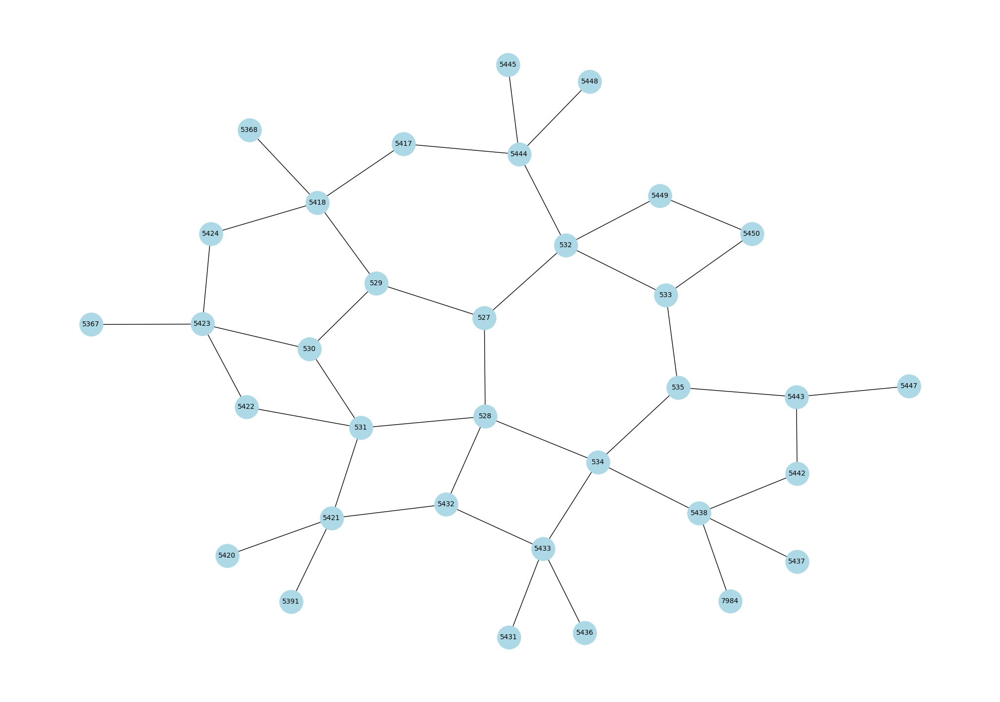

---------- Graph Stats  ----------
Nodes : 34 Edges : 34
Diameter : 8
Periphery : [5424, 5447, 5367, 5368]


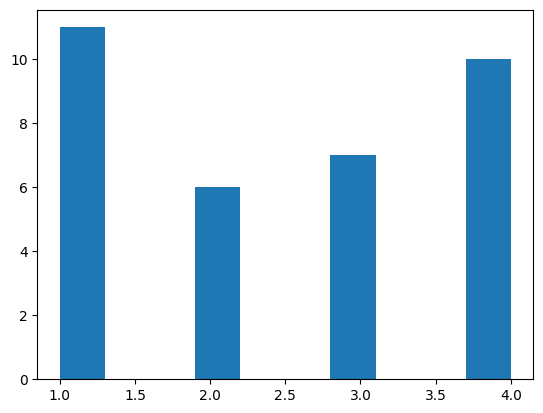

Density of the graph: 0.0748663101604278
Average degree: 2.4705882352941178
Size of the largest connected component: 34
Degree assortativity coefficient: -0.4439461883408069
    Node  Degree Centrality
26  5444              0.121
23  5438              0.121
1    528              0.121
4    531              0.121
5    532              0.121
15  5423              0.121
7    534              0.121
13  5421              0.121
20  5433              0.121
11  5418              0.121
0    527              0.091
25  5443              0.091
19  5432              0.091
8    535              0.091
6    533              0.091
3    530              0.091
2    529              0.091
31  5450              0.061
24  5442              0.061
30  5449              0.061
17  5424              0.061
14  5422              0.061
10  5417              0.061
21  5436              0.030
22  5437              0.030
18  5431              0.030
16  7984              0.030
12  5420              0.030
27  5445      

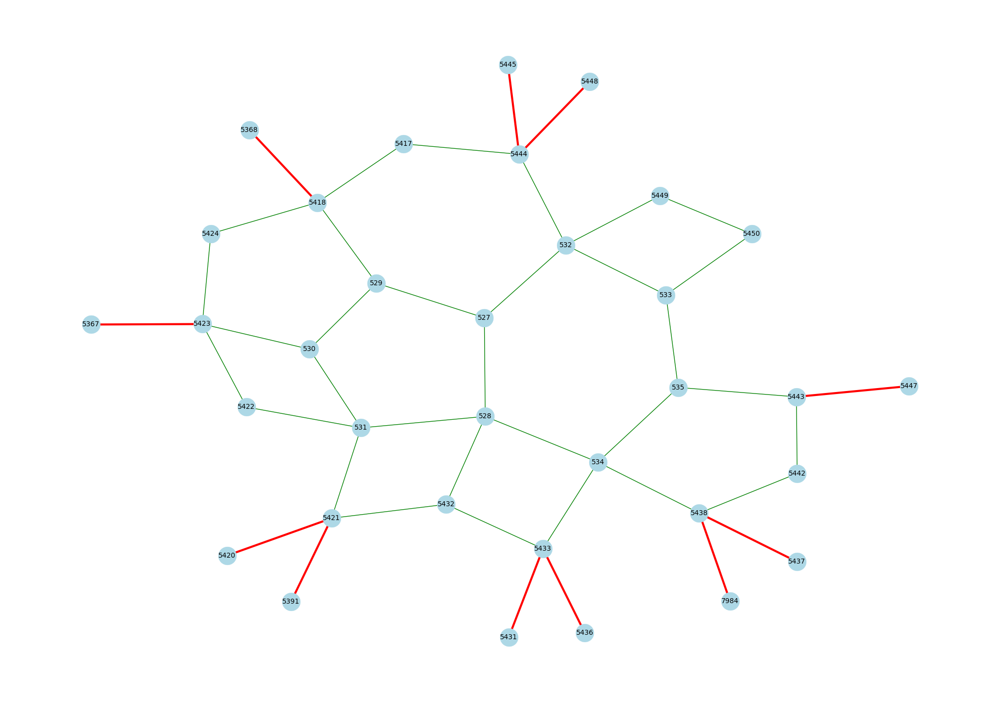

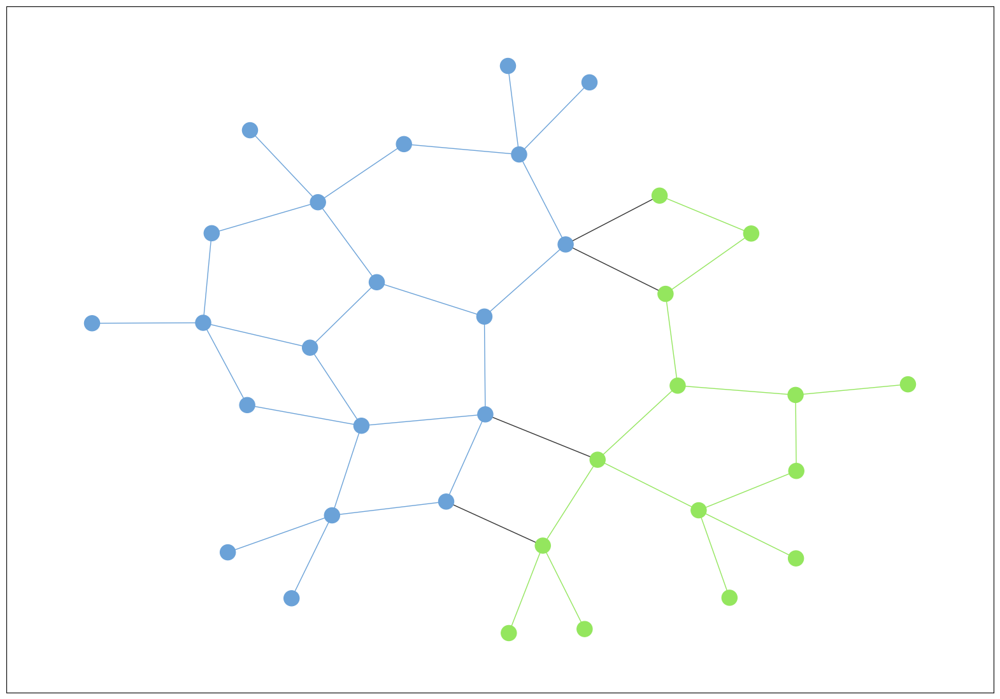

--------------------------------------------------
-------------------- Graph 21 --------------------


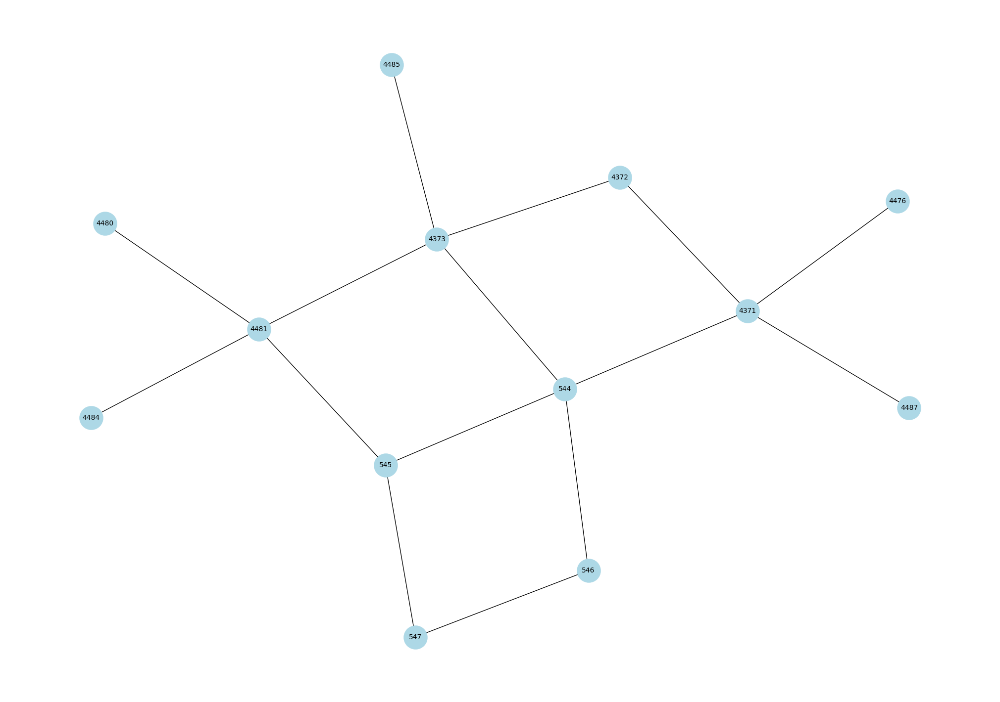

---------- Graph Stats  ----------
Nodes : 13 Edges : 13
Diameter : 5
Periphery : [4480, 4487, 4484, 4476]


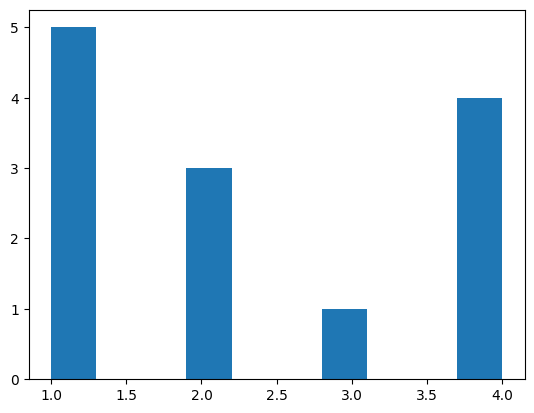

Density of the graph: 0.19230769230769232
Average degree: 2.3076923076923075
Size of the largest connected component: 13
Degree assortativity coefficient: -0.4285714285714284
    Node  Degree Centrality
0    544              0.333
4   4481              0.333
9   4371              0.333
11  4373              0.333
1    545              0.250
2    546              0.167
3    547              0.167
10  4372              0.167
5   4485              0.083
6   4480              0.083
7   4487              0.083
8   4484              0.083
12  4476              0.083
    Node  Closeness Centrality
0    544                 0.545
11  4373                 0.522
1    545                 0.480
4   4481                 0.462
9   4371                 0.444
10  4372                 0.429
2    546                 0.387
3    547                 0.353
5   4485                 0.353
6   4480                 0.324
8   4484                 0.324
7   4487                 0.316
12  4476                 0.316

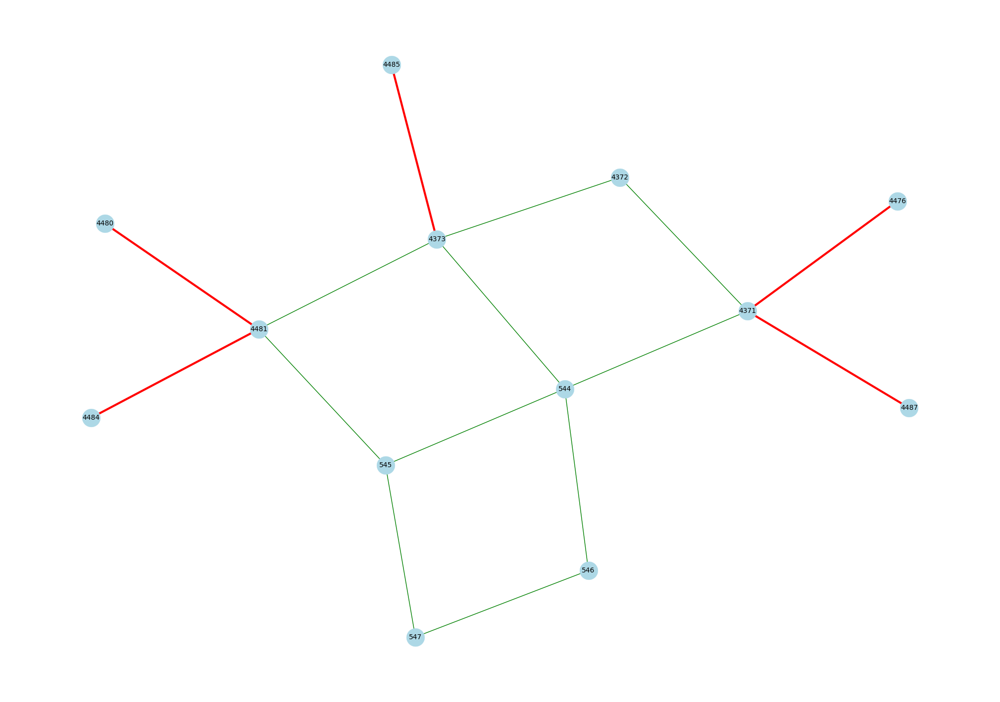

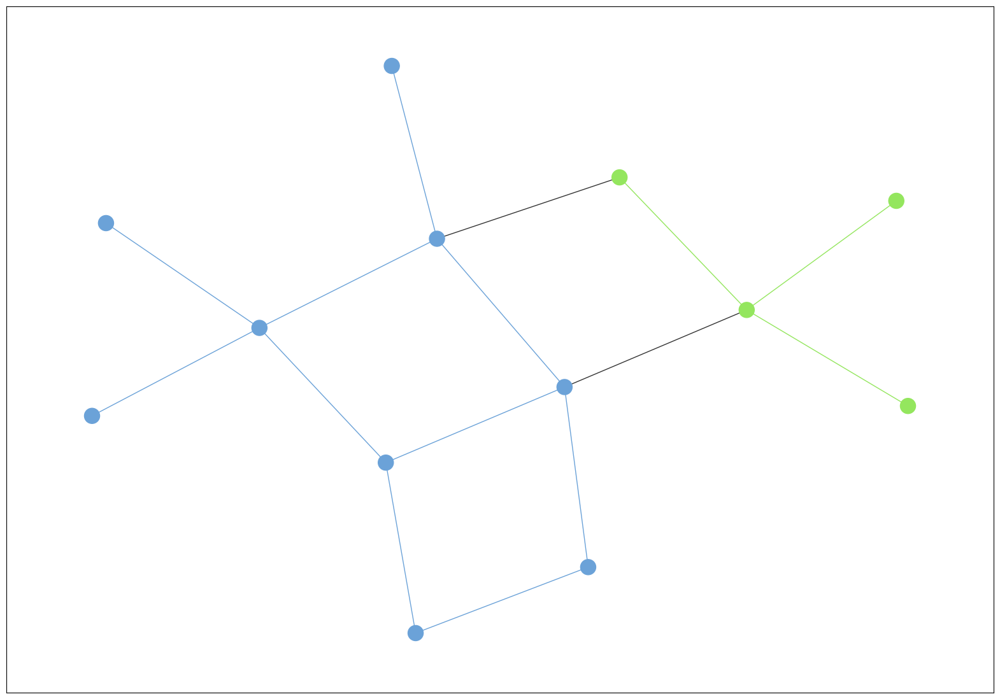

--------------------------------------------------
-------------------- Graph 22 --------------------


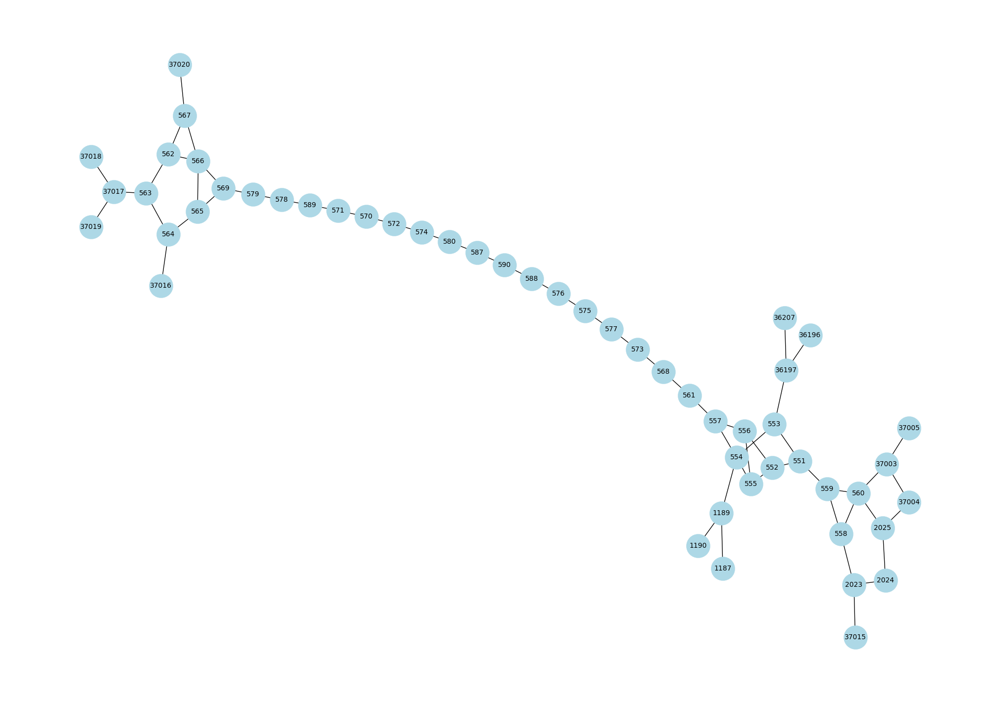

---------- Graph Stats  ----------
Nodes : 52 Edges : 52
Diameter : 30
Periphery : [37004, 37005, 37015, 37018, 37019, 2024]


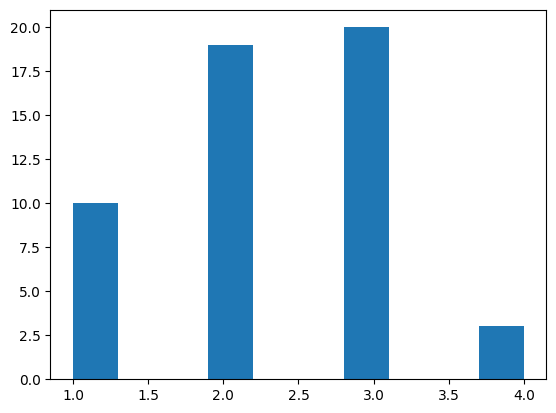

Density of the graph: 0.04524886877828054
Average degree: 2.3076923076923075
Size of the largest connected component: 52
Degree assortativity coefficient: 0.19852602487333107
     Node  Degree Centrality
27    566              0.078
21    560              0.078
15    554              0.078
0   37003              0.059
17    556              0.059
50   2025              0.059
48   2023              0.059
47  36197              0.059
30    569              0.059
28    567              0.059
25    564              0.059
24    563              0.059
23    562              0.059
20    559              0.059
19    558              0.059
18    557              0.059
26    565              0.059
16    555              0.059
10   1189              0.059
5   37017              0.059
14    553              0.059
12    551              0.059
13    552              0.059
49   2024              0.039
45    590              0.039
44    589              0.039
43    588              0.039
35    574    

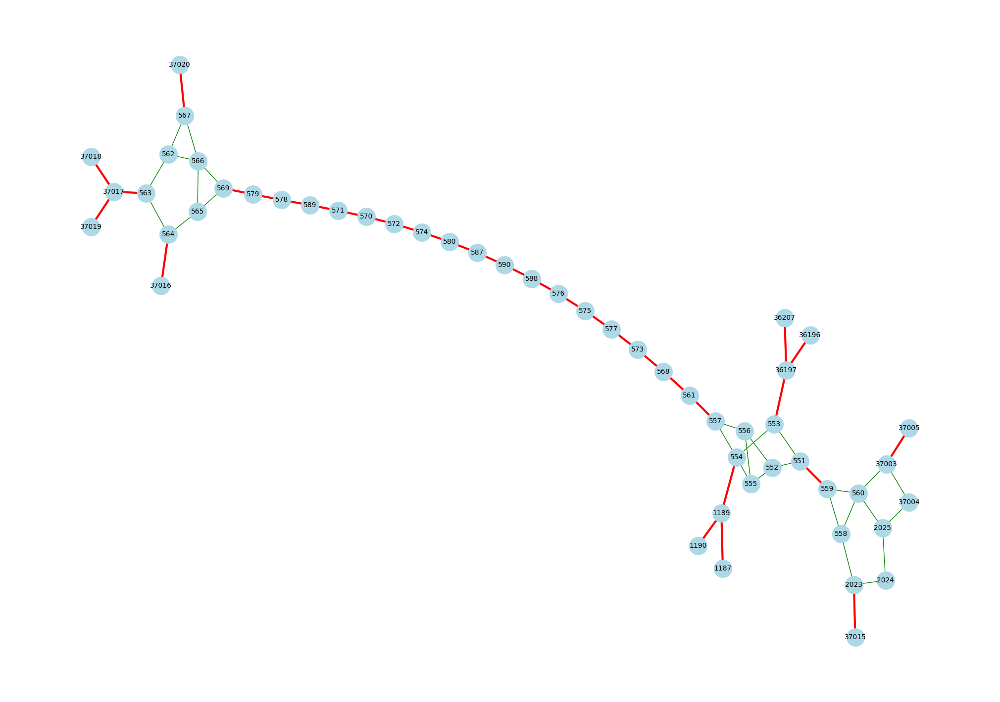

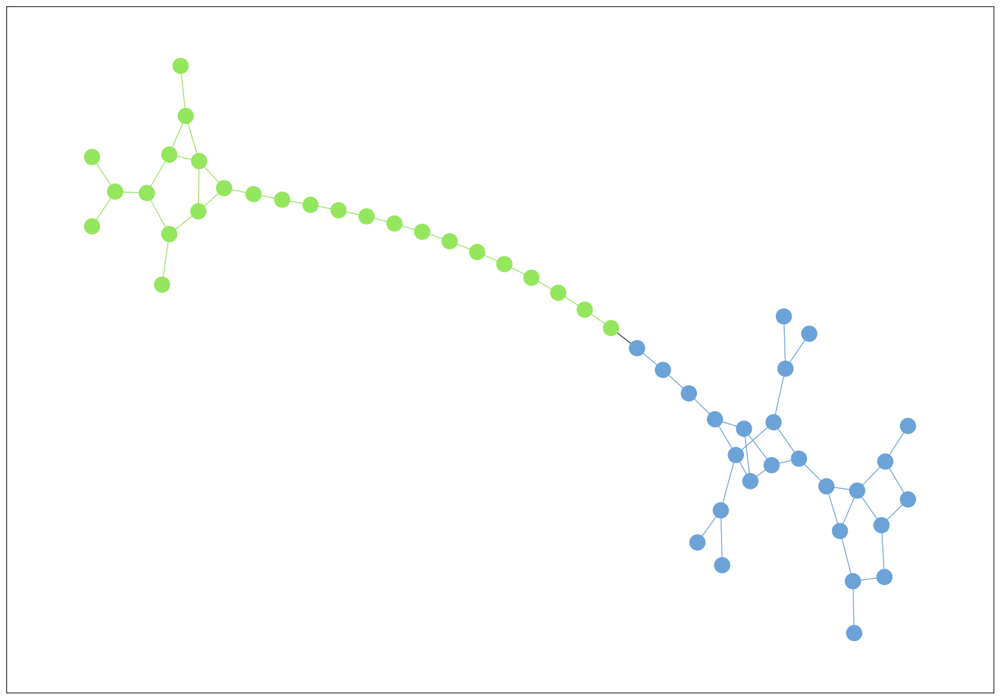

--------------------------------------------------
-------------------- Graph 23 --------------------


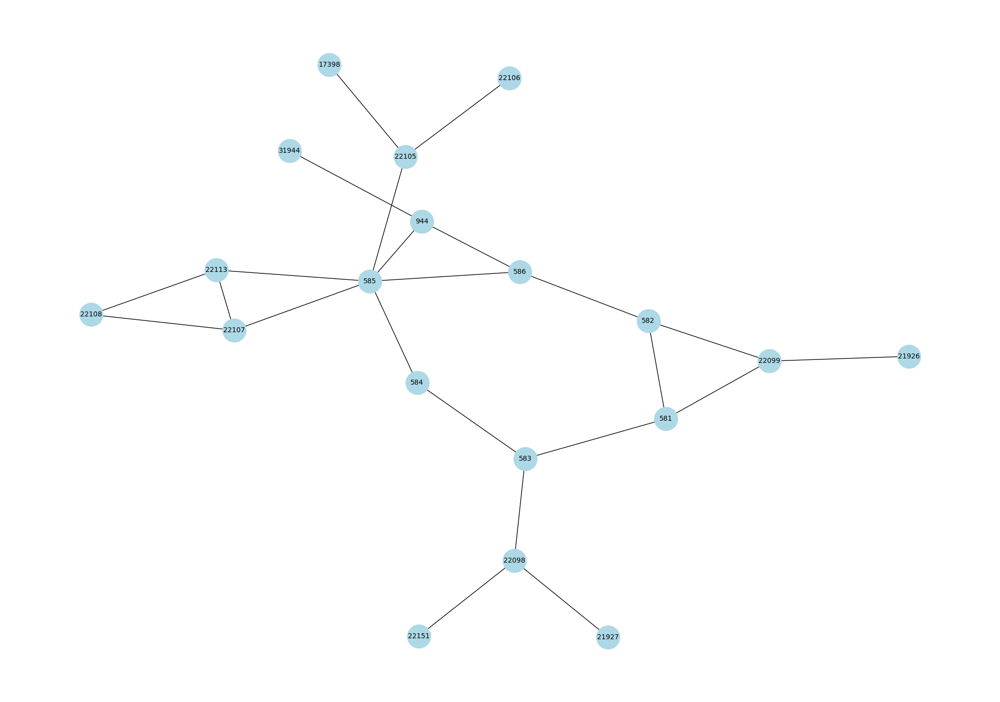

---------- Graph Stats  ----------
Nodes : 19 Edges : 19
Diameter : 6
Periphery : [22151, 21926, 21927, 31944, 22106, 22108, 17398]


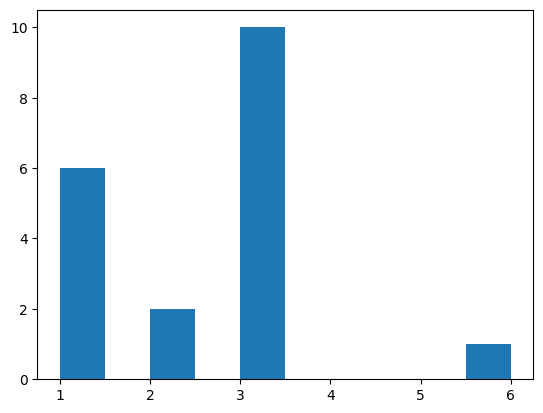

Density of the graph: 0.13450292397660818
Average degree: 2.4210526315789473
Size of the largest connected component: 19
Degree assortativity coefficient: -0.07430997876857752
     Node  Degree Centrality
8     585              0.333
9     586              0.167
17  22113              0.167
3     944              0.167
4     581              0.167
5     582              0.167
6     583              0.167
15  22107              0.167
11  22098              0.167
12  22099              0.167
13  22105              0.167
7     584              0.111
16  22108              0.111
14  22106              0.056
0   22151              0.056
10  31944              0.056
1   21926              0.056
2   21927              0.056
18  17398              0.056
     Node  Closeness Centrality
8     585                 0.462
7     584                 0.409
9     586                 0.391
6     583                 0.383
3     944                 0.367
5     582                 0.367
13  22105           

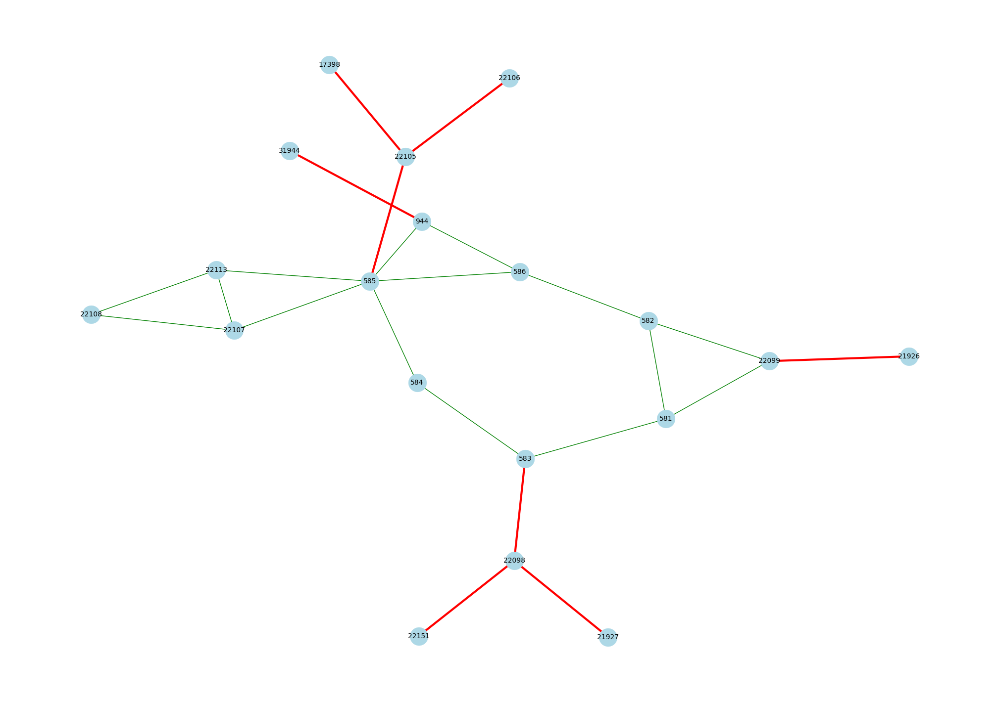

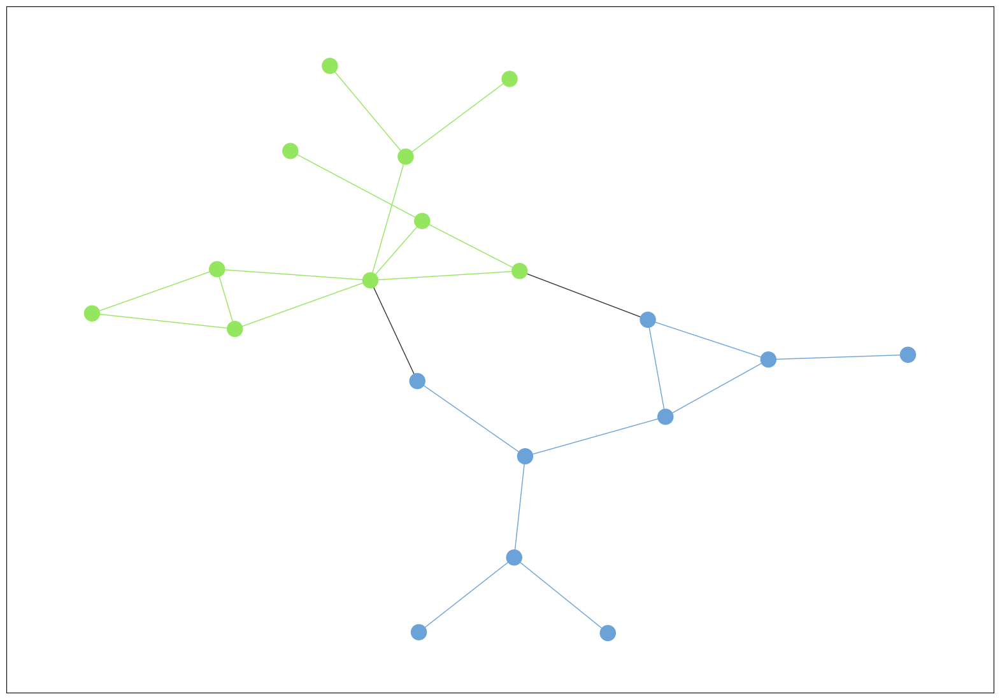

--------------------------------------------------
-------------------- Graph 24 --------------------


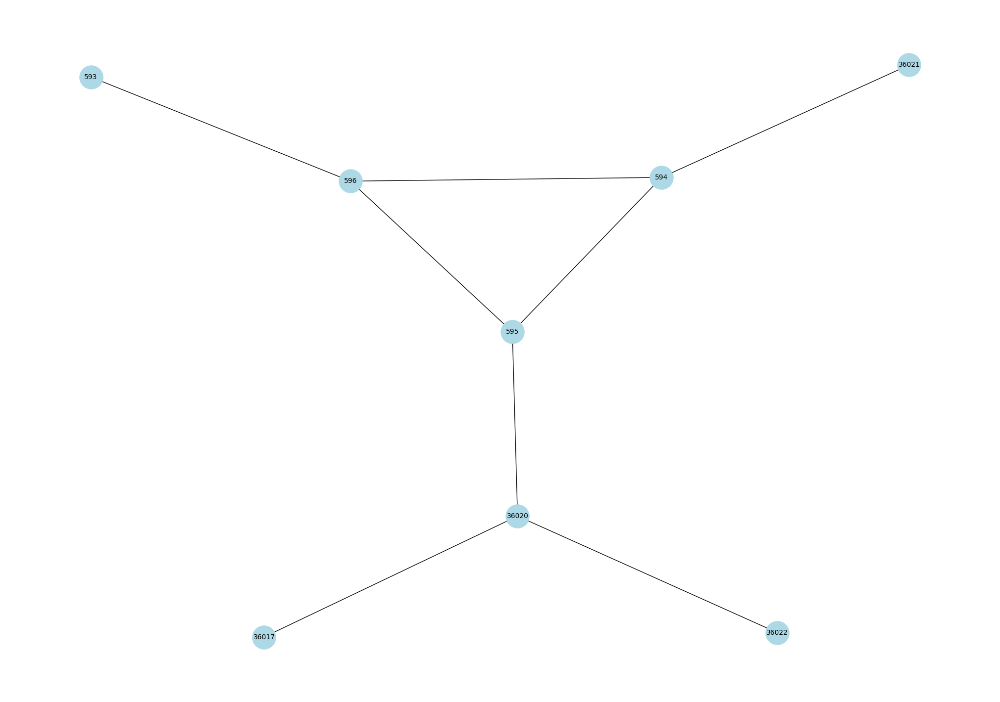

---------- Graph Stats  ----------
Nodes : 8 Edges : 8
Diameter : 4
Periphery : [593, 36021, 36017, 36022]


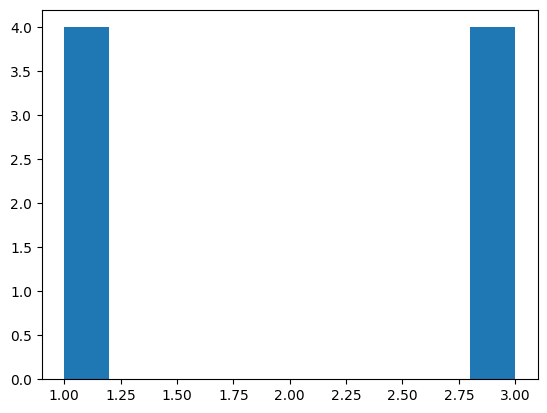

Density of the graph: 0.2857142857142857
Average degree: 2.0
Size of the largest connected component: 8
Degree assortativity coefficient: -0.3333333333333333
    Node  Degree Centrality
1    594              0.429
2    595              0.429
3    596              0.429
5  36020              0.429
0    593              0.143
4  36021              0.143
6  36017              0.143
7  36022              0.143
    Node  Closeness Centrality
2    595                 0.636
1    594                 0.538
3    596                 0.538
5  36020                 0.538
0    593                 0.368
4  36021                 0.368
6  36017                 0.368
7  36022                 0.368
    Node  Betweenness Centrality
2    595                   0.571
5  36020                   0.524
1    594                   0.286
3    596                   0.286
0    593                   0.000
4  36021                   0.000
6  36017                   0.000
7  36022                   0.000
    Node  Katz

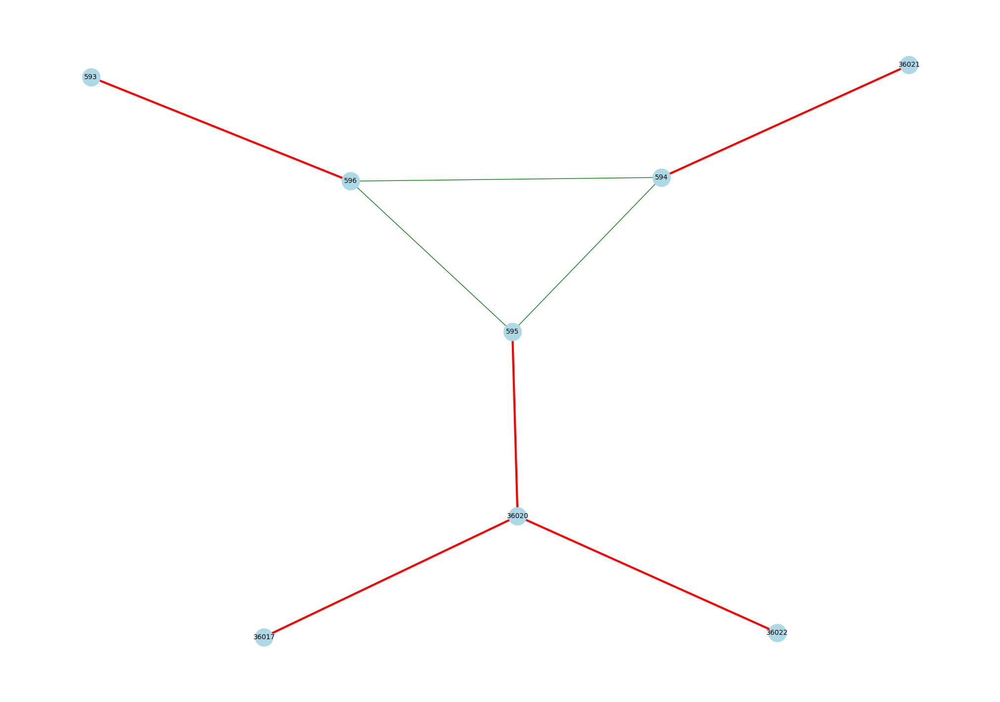

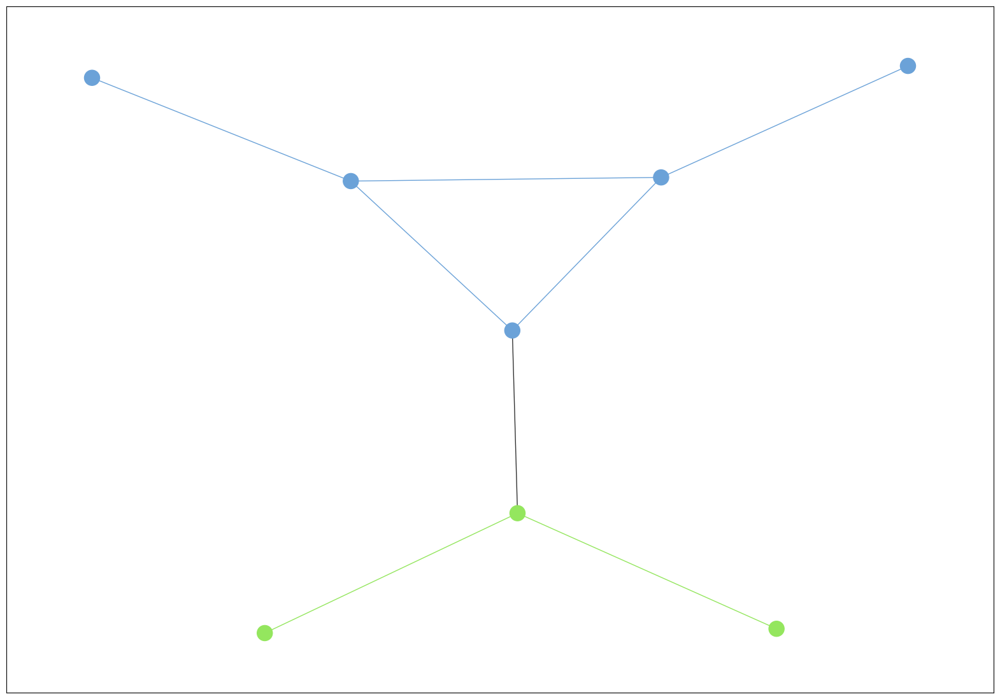

--------------------------------------------------
-------------------- Graph 25 --------------------


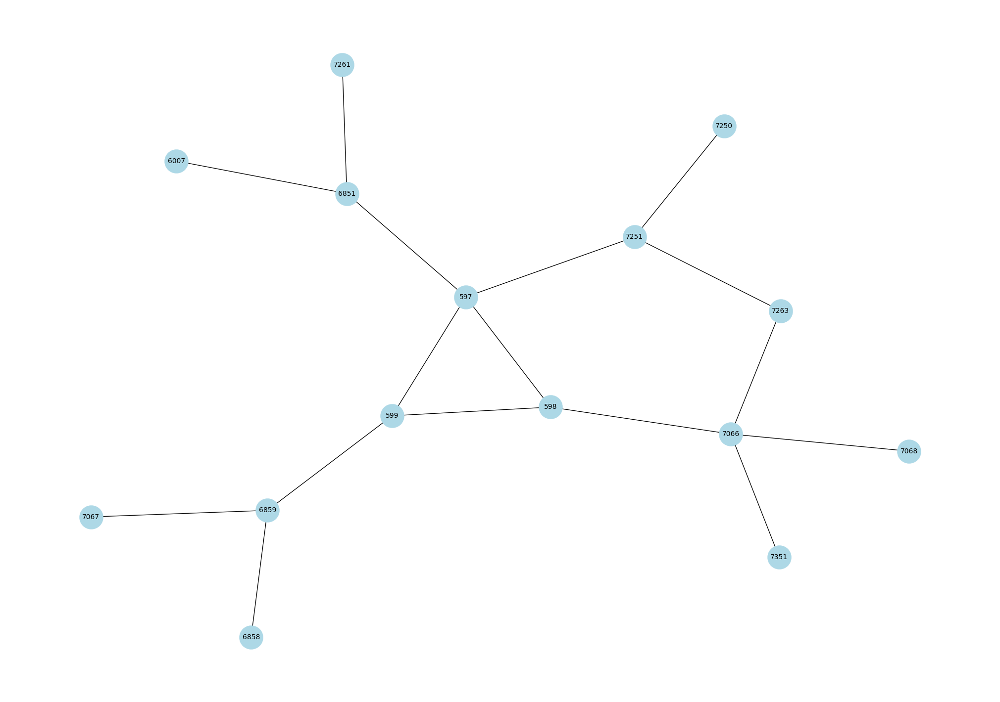

---------- Graph Stats  ----------
Nodes : 15 Edges : 15
Diameter : 5
Periphery : [6858, 7250, 6007, 7351, 7067, 7068, 7261, 7263]


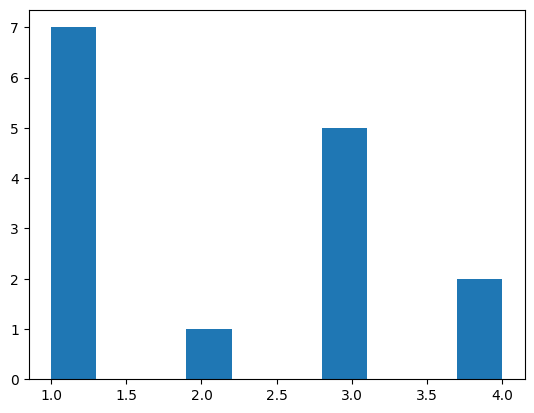

Density of the graph: 0.1523809523809524
Average degree: 2.1333333333333333
Size of the largest connected component: 15
Degree assortativity coefficient: -0.3333333333333333
    Node  Degree Centrality
6    597              0.286
10  7066              0.286
0   6851              0.214
1    599              0.214
3   6859              0.214
5   7251              0.214
7    598              0.214
14  7263              0.143
2   6858              0.071
4   7250              0.071
8   6007              0.071
9   7351              0.071
11  7067              0.071
12  7068              0.071
13  7261              0.071
    Node  Closeness Centrality
6    597                 0.500
7    598                 0.467
1    599                 0.452
5   7251                 0.412
10  7066                 0.400
0   6851                 0.378
3   6859                 0.350
14  7263                 0.350
4   7250                 0.298
9   7351                 0.292
12  7068                 0.292
8   60

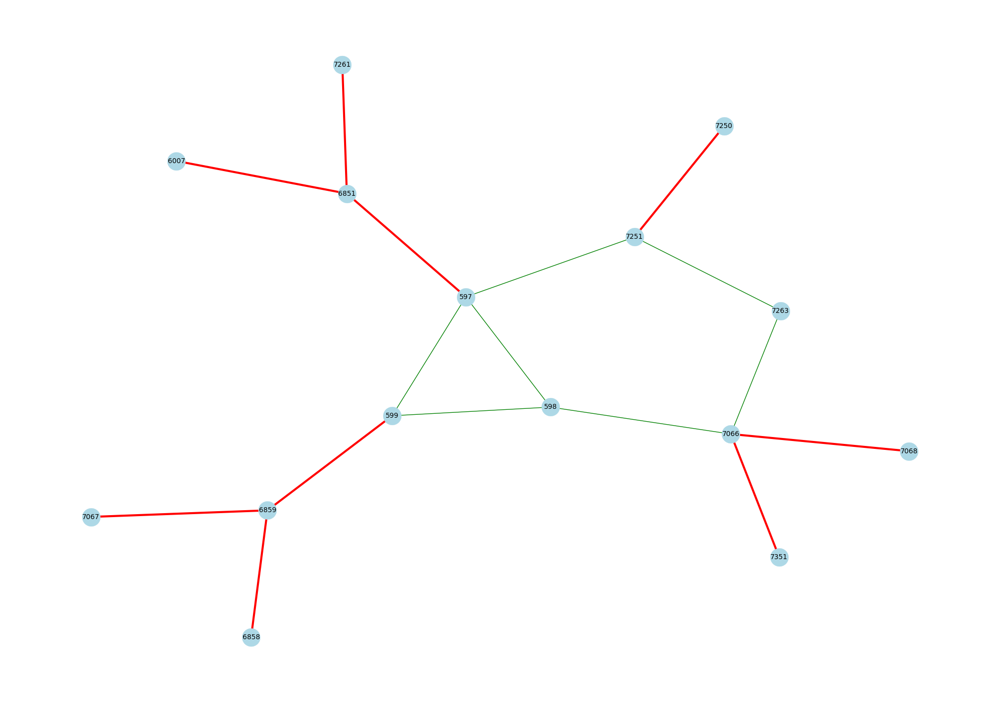

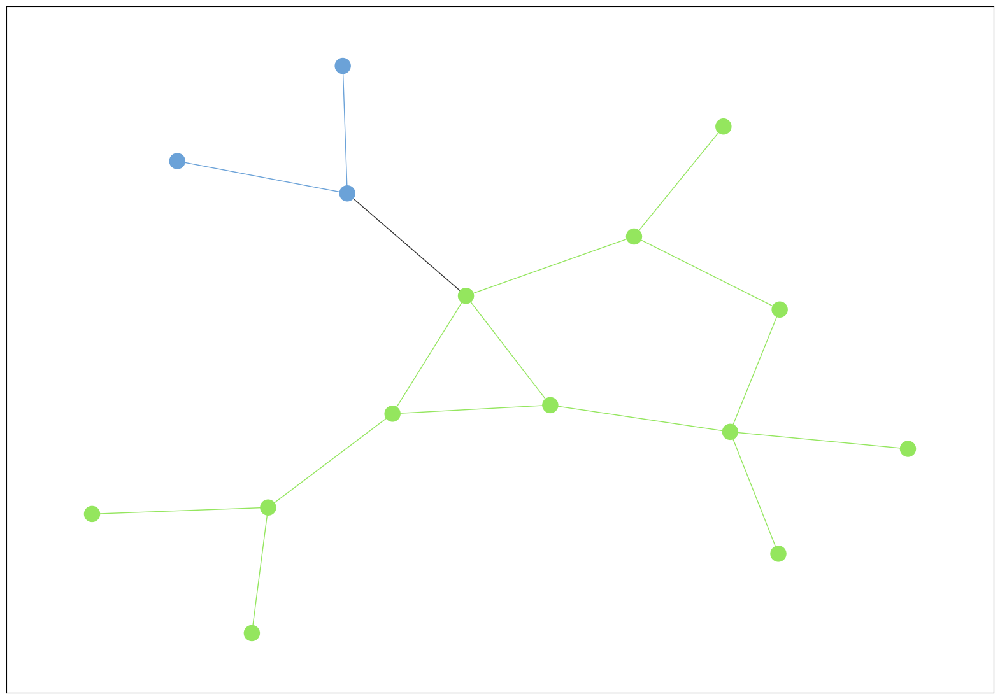

--------------------------------------------------
-------------------- Graph 26 --------------------


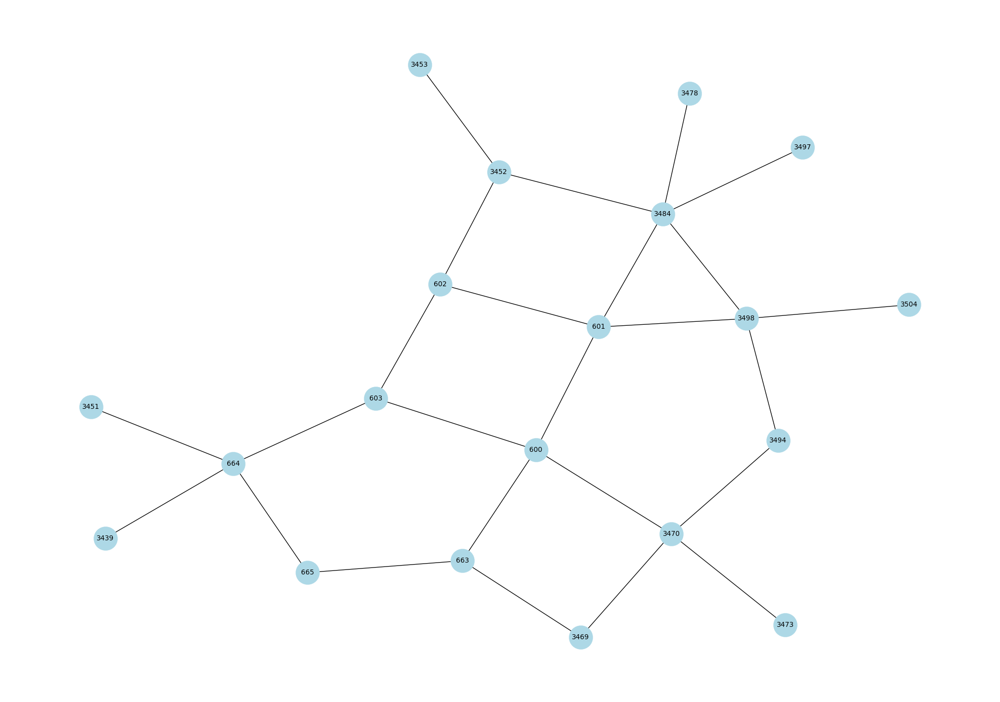

---------- Graph Stats  ----------
Nodes : 20 Edges : 20
Diameter : 6
Periphery : [3469, 3473, 3478, 3497, 3504, 3439, 3451, 3453]


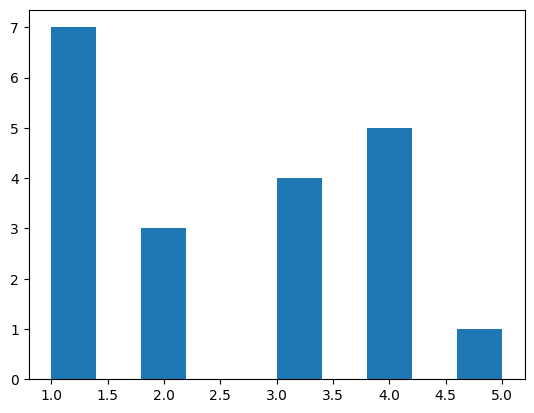

Density of the graph: 0.13157894736842105
Average degree: 2.5
Size of the largest connected component: 20
Degree assortativity coefficient: -0.3888888888888894
    Node  Degree Centrality
7   3484              0.263
10  3498              0.211
1   3470              0.211
5    664              0.211
13   601              0.211
12   600              0.211
18  3452              0.158
15   603              0.158
4    663              0.158
14   602              0.158
0   3469              0.105
8   3494              0.105
6    665              0.105
11  3504              0.053
9   3497              0.053
3   3478              0.053
16  3439              0.053
17  3451              0.053
2   3473              0.053
19  3453              0.053
    Node  Closeness Centrality
12   600                 0.452
13   601                 0.442
15   603                 0.404
14   602                 0.396
10  3498                 0.388
7   3484                 0.380
1   3470                 0.365
4   

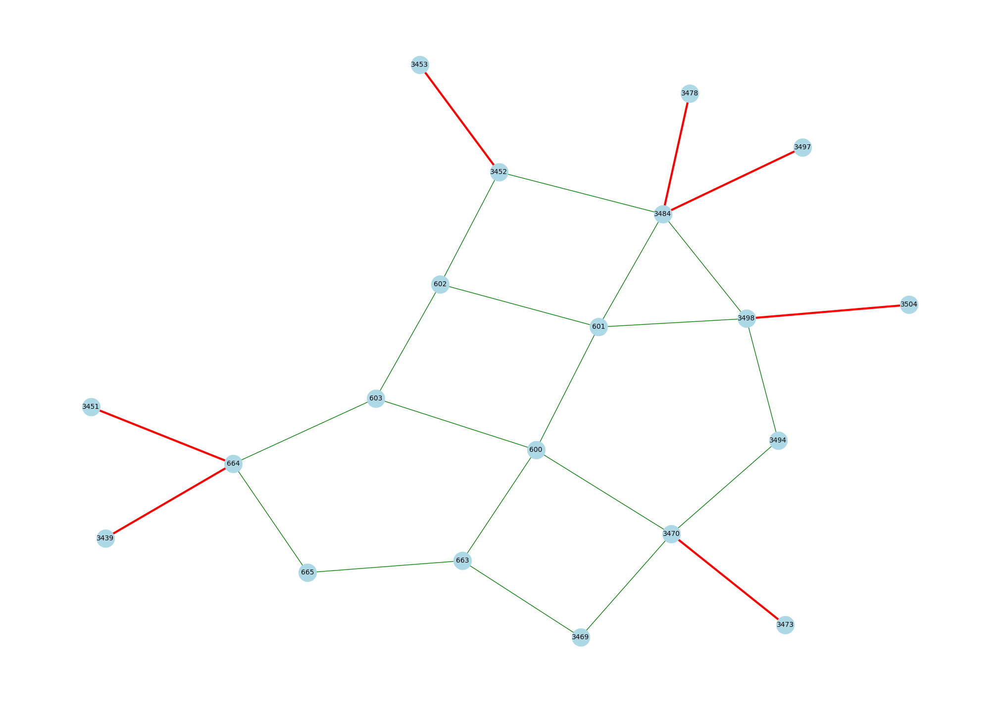

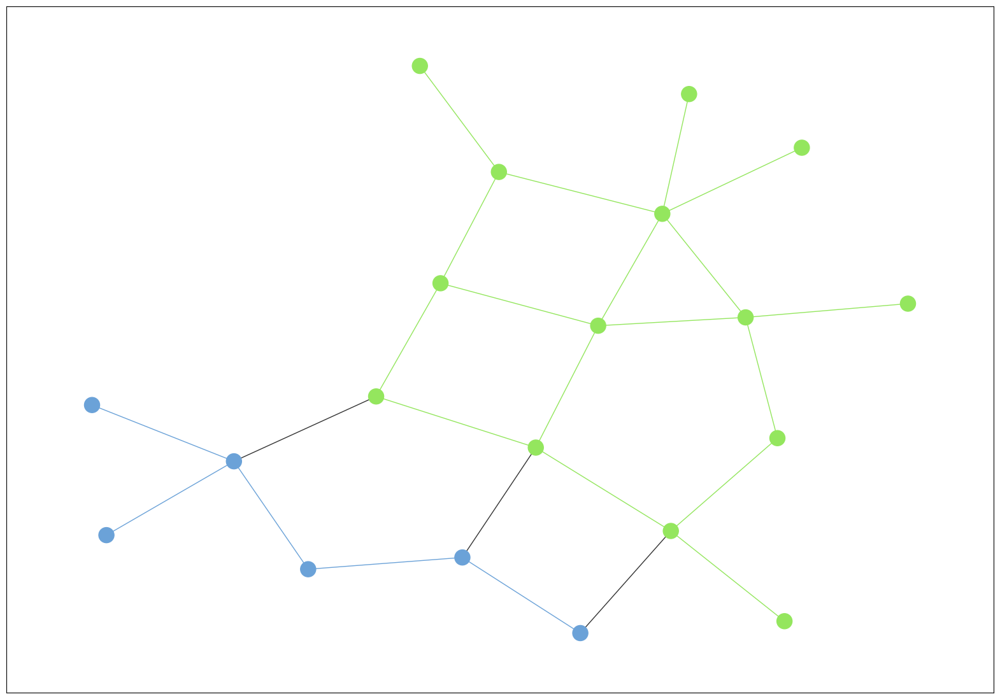

--------------------------------------------------
-------------------- Graph 27 --------------------


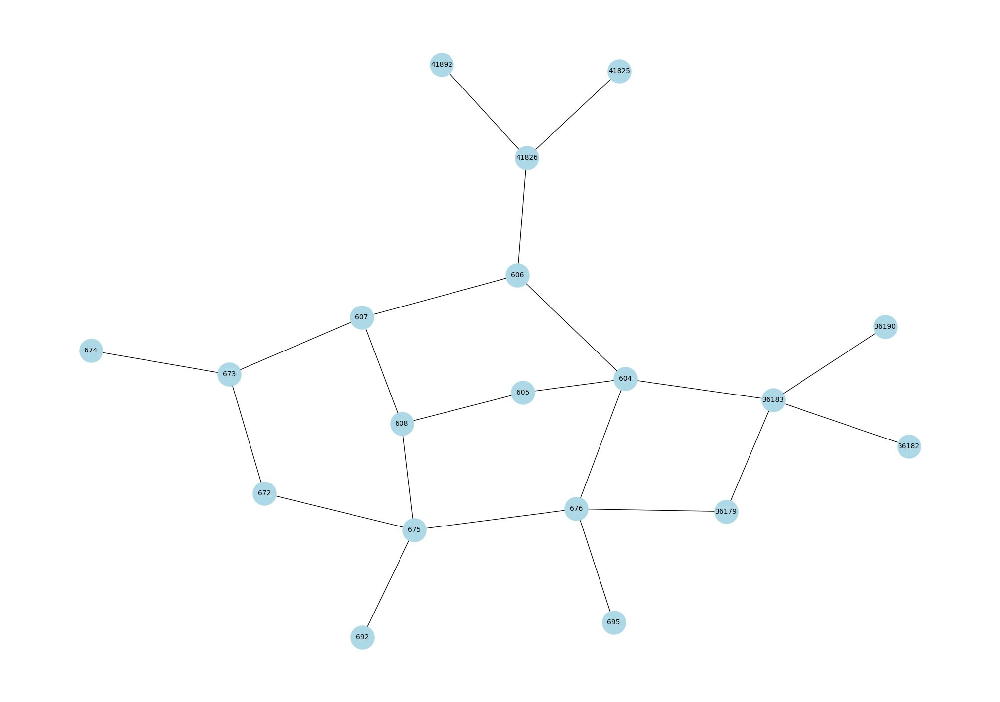

---------- Graph Stats  ----------
Nodes : 19 Edges : 19
Diameter : 6
Periphery : [674, 41892, 692, 36182, 36190, 41825]


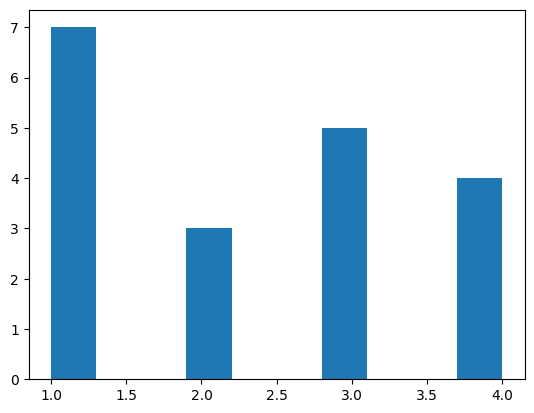

Density of the graph: 0.1286549707602339
Average degree: 2.3157894736842106
Size of the largest connected component: 19
Degree assortativity coefficient: -0.3699633699633703
     Node  Degree Centrality
10  36183              0.222
3     675              0.222
4     676              0.222
11    604              0.222
18    607              0.167
17  41826              0.167
15    608              0.167
14    606              0.167
1     673              0.167
12    605              0.111
0     672              0.111
8   36179              0.111
7     695              0.056
13  36190              0.056
6     692              0.056
5   41892              0.056
16  41825              0.056
2     674              0.056
9   36182              0.056
     Node  Closeness Centrality
11    604                 0.462
14    606                 0.429
4     676                 0.419
18    607                 0.391
15    608                 0.391
3     675                 0.383
12    605             

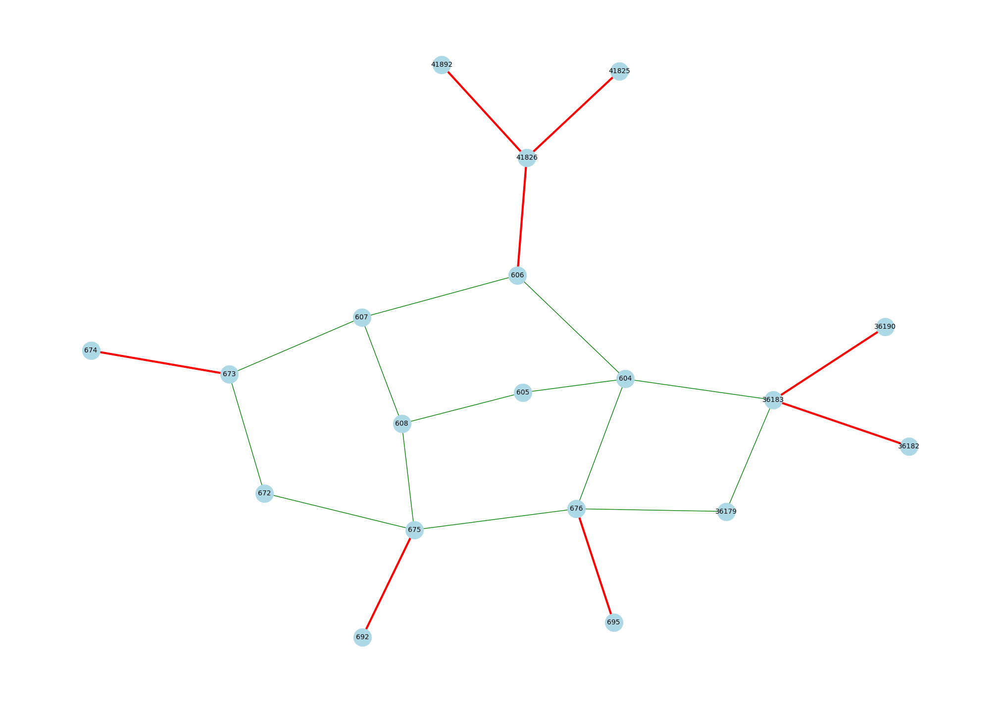

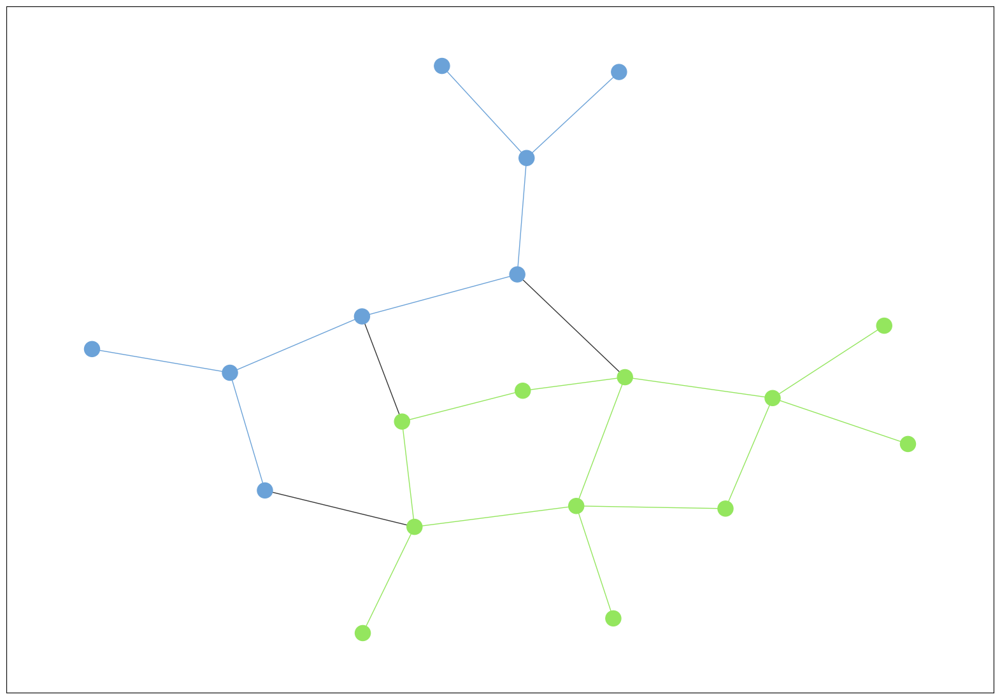

--------------------------------------------------
-------------------- Graph 28 --------------------


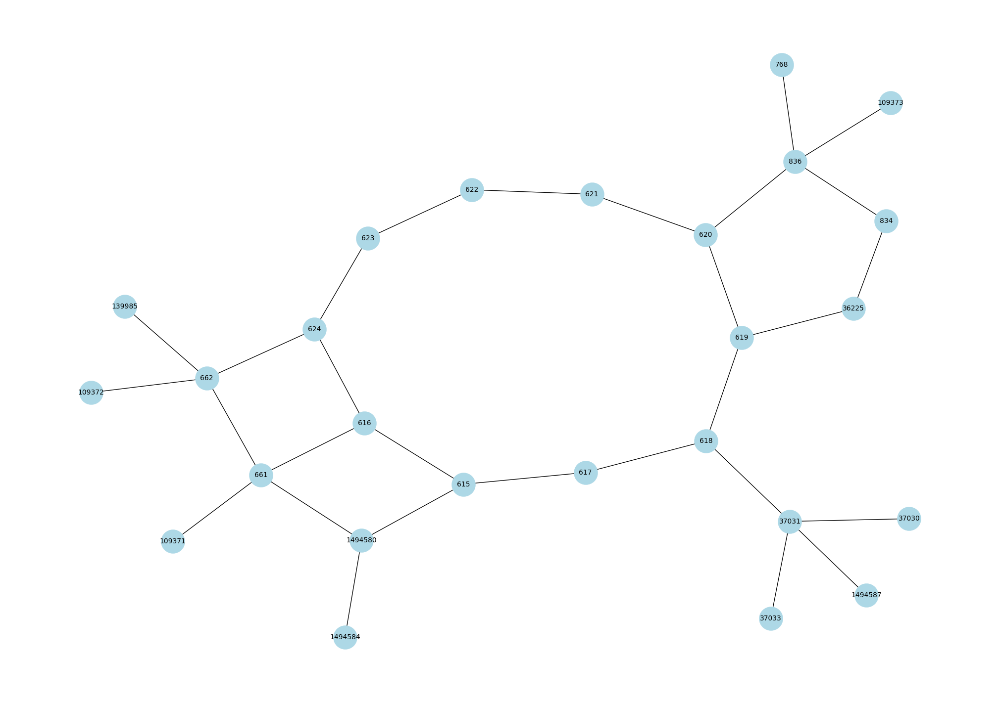

---------- Graph Stats  ----------
Nodes : 26 Edges : 26
Diameter : 9
Periphery : [768, 109371, 109373]


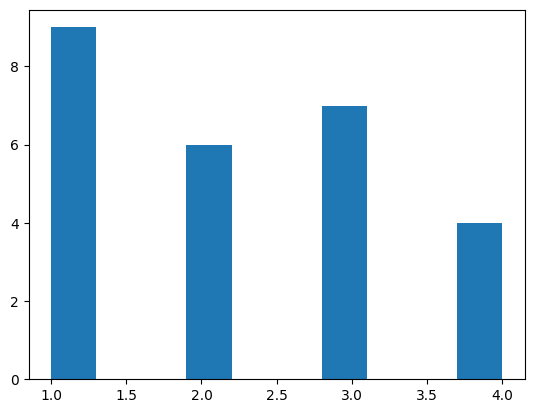

Density of the graph: 0.08923076923076922
Average degree: 2.230769230769231
Size of the largest connected component: 26
Degree assortativity coefficient: -0.4846416382252563
       Node  Degree Centrality
2       661               0.16
3       662               0.16
5     37031               0.16
14      836               0.16
25      624               0.12
16      615               0.12
7   1494580               0.12
21      620               0.12
20      619               0.12
19      618               0.12
17      616               0.12
24      623               0.08
23      622               0.08
22      621               0.08
18      617               0.08
13      834               0.08
1     36225               0.08
15   139985               0.04
12   109373               0.04
11   109372               0.04
10   109371               0.04
9   1494587               0.04
8   1494584               0.04
6     37033               0.04
4     37030               0.04
0       768         

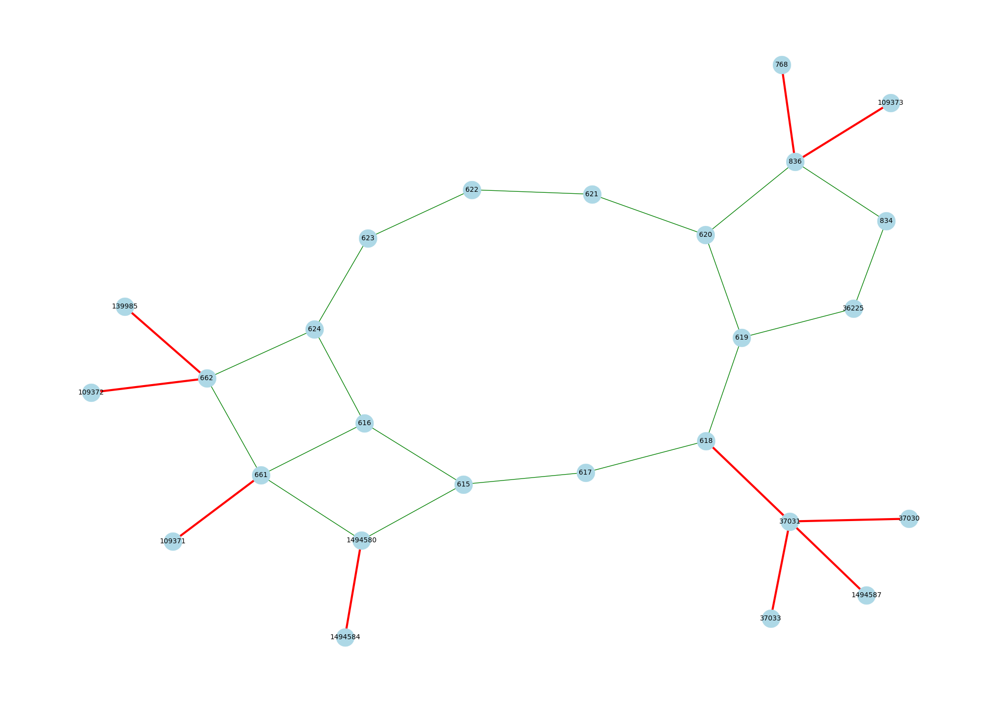

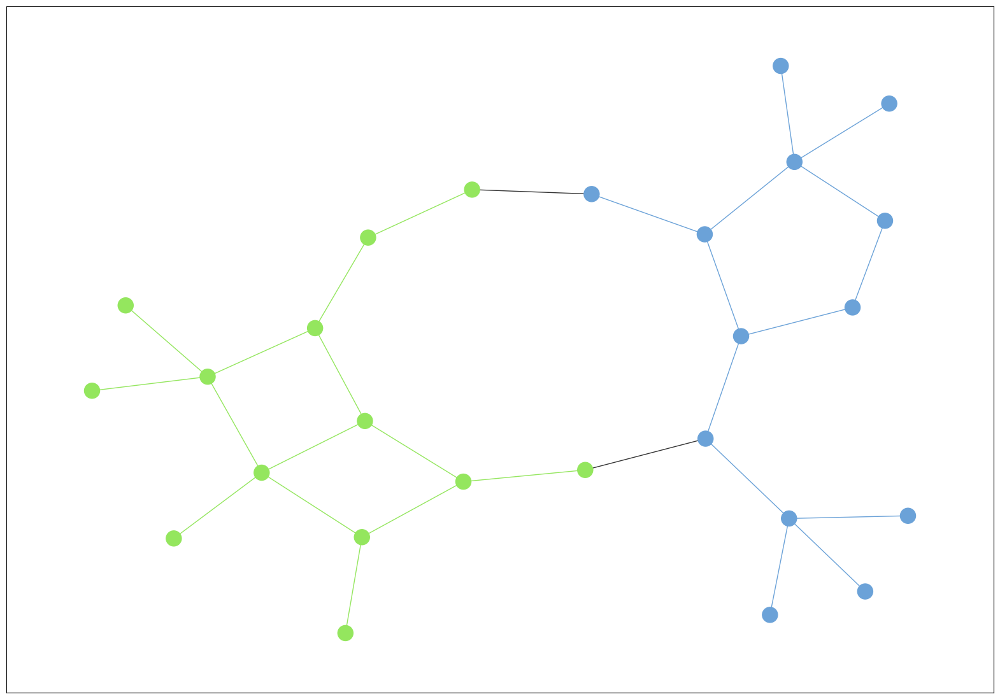

--------------------------------------------------
-------------------- Graph 29 --------------------


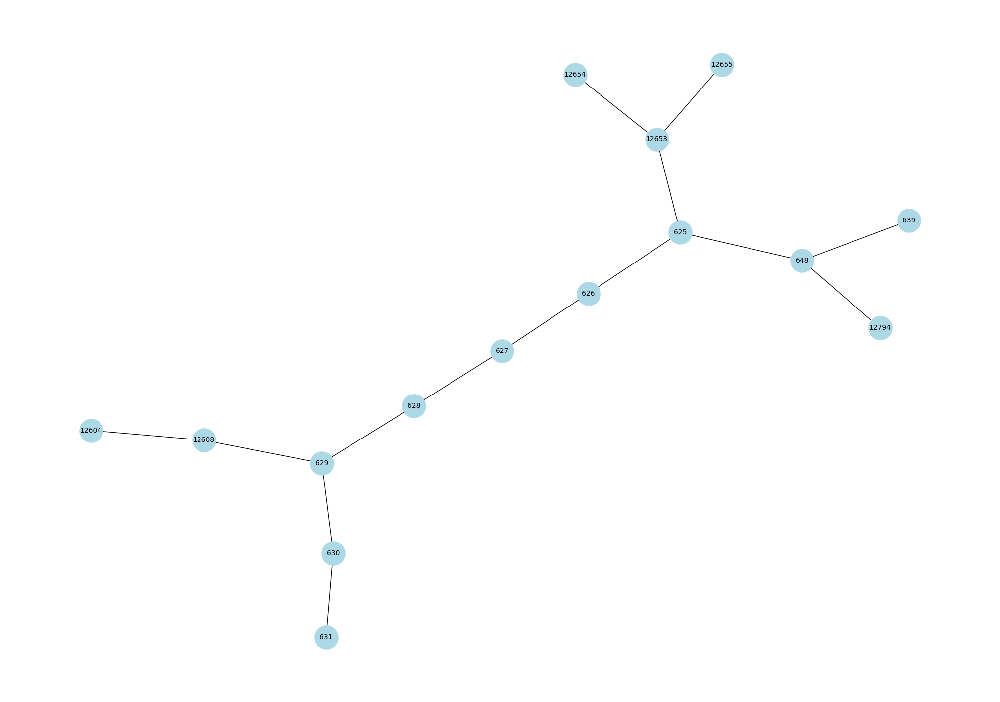

---------- Graph Stats  ----------
Nodes : 15 Edges : 15
Diameter : 8
Periphery : [12654, 12655, 631, 12794, 12604, 639]


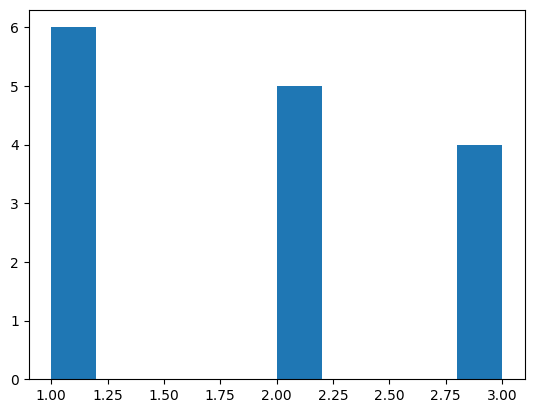

Density of the graph: 0.13333333333333333
Average degree: 1.8666666666666667
Size of the largest connected component: 15
Degree assortativity coefficient: -0.3162393162393155
     Node  Degree Centrality
1     648              0.214
2   12653              0.214
5     625              0.214
9     629              0.214
0   12608              0.143
6     626              0.143
7     627              0.143
8     628              0.143
10    630              0.143
3   12654              0.071
4   12655              0.071
11    631              0.071
12  12794              0.071
13  12604              0.071
14    639              0.071
     Node  Closeness Centrality
6     626                 0.341
5     625                 0.333
7     627                 0.333
8     628                 0.311
9     629                 0.280
1     648                 0.275
2   12653                 0.275
0   12608                 0.230
10    630                 0.230
3   12654                 0.219
4   12655

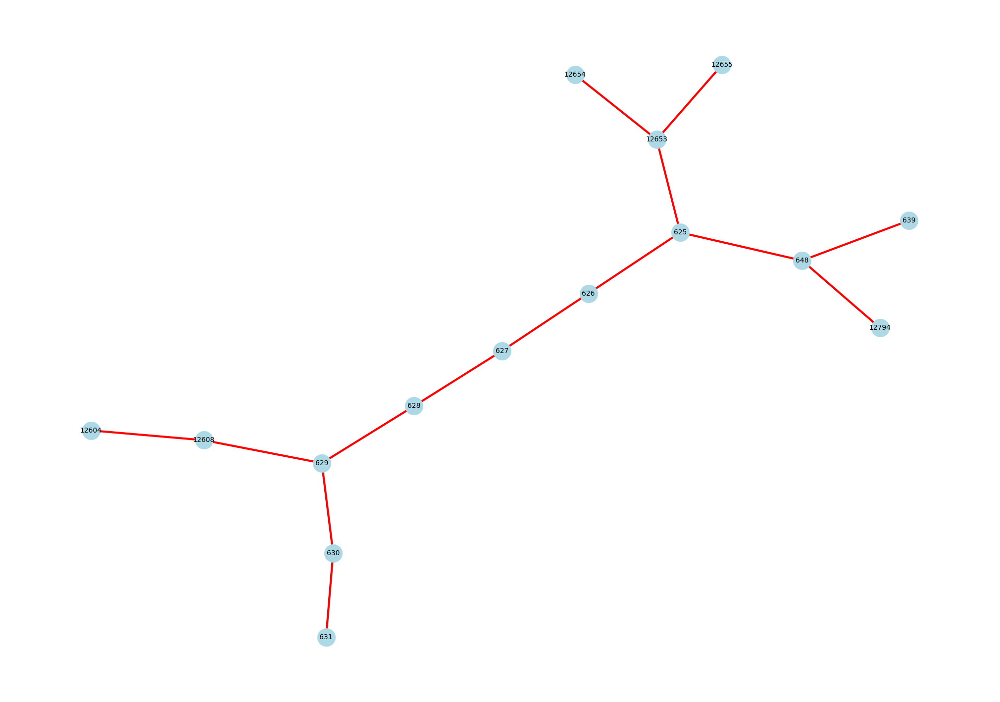

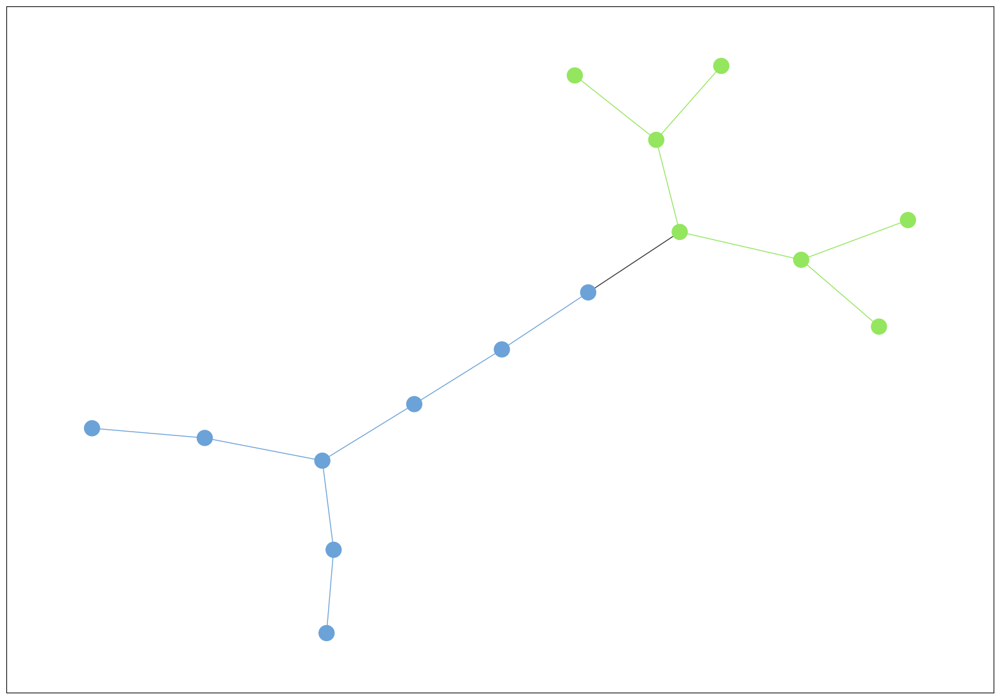

--------------------------------------------------


In [78]:
# Print subgraphs and its statistics
for graph_idx, graph in enumerate(S) :
    print("-"*20,f"Graph {graph_idx}", "-"*20)

    graph_pos = nx.nx_pydot.graphviz_layout(S[graph_idx])

    plt.figure(figsize=(20,14))
    nx.draw(S[graph_idx], pos = graph_pos, node_size=1200, node_color='lightblue', linewidths=0.25,font_size=10, with_labels=True)
    plt.show()

    print("-"*10,"Graph Stats ", "-"*10)

    num_edges = graph.number_of_edges()
    num_nodes = graph.number_of_nodes()

    print(f"Nodes : {num_nodes} Edges : {num_nodes}")

    print(f"Diameter : {nx.diameter(graph)}") # Diameter

    print(f"Periphery : {nx.periphery(graph)}") # Periphery

    degrees = [graph.degree(n) for n in graph.nodes()]
    plt.hist(degrees)
    plt.show()

    # Density
    density = nx.density(graph)
    print(f"Density of the graph: {density}")


    # Max and Min degree
    degrees = dict(graph.degree())
    max_degree = max(degrees.values())
    min_degree = min(degrees.values())


    # Average degree
    avg_degree = (2 * num_edges) / num_nodes
    print(f"Average degree: {avg_degree}")

    # Number of connected components

    connected_components = list(nx.connected_components(graph))
    largest_component_size = max(len(c) for c in connected_components) # Find the size of the largest connected component
    print(f"Size of the largest connected component: {largest_component_size}")

    # Degree assortativity
    assortativity = nx.degree_assortativity_coefficient(graph)
    print(f"Degree assortativity coefficient: {assortativity}")



    # Degree Centrality
    deg_centrality=nx.degree_centrality(graph)
    res = {key : round(deg_centrality[key], 3) for key in deg_centrality}
    df=pd.DataFrame(res.items(), columns=["Node", "Degree Centrality"])
    print(df.sort_values('Degree Centrality',ascending=False))

    # Closeness Centrality
    Closeness_centrality=nx.closeness_centrality(graph)
    res = {key : round(Closeness_centrality[key], 3) for key in Closeness_centrality}
    df=pd.DataFrame(res.items(), columns=["Node", "Closeness Centrality"])
    print(df.sort_values('Closeness Centrality',ascending=False))

    # Between Centrality
    Betweenness_centrality=nx.betweenness_centrality(graph)
    res = {key : round(Betweenness_centrality[key], 3) for key in Betweenness_centrality}
    df=pd.DataFrame(res.items(), columns=["Node", "Betweenness Centrality"])
    print(df.sort_values('Betweenness Centrality',ascending=False))

    # Katz Centrality
    Katz_centrality=nx.katz_centrality(graph,alpha=0.05, beta=1.0, max_iter=1000, tol=1e-02, nstart=None, normalized=True, weight=None)
    res = {key : round(Katz_centrality[key], 3) for key in Katz_centrality}
    df=pd.DataFrame(res.items(), columns=["Node", "Katz Centrality"])
    print(df.sort_values('Katz Centrality',ascending=False))

    # Bridges


    plt.figure(figsize=(20,14))

    graph_bridges = list(nx.bridges(graph))


    # Draw all edges with default color
    nx.draw(graph, graph_pos, with_labels=True, edge_color='green', node_color='lightblue', node_size=700 ,linewidths=0.25,font_size=10)



    bridge_edges = [(u, v) for u, v in graph_bridges]

    # Draw bridges with a different color (red)
    nx.draw_networkx_edges(graph, graph_pos, edgelist=bridge_edges, edge_color='red', width=3)
    
    plt.show()


    # Community Detection
    result = nxcom.girvan_newman(graph)
    communities = next(result)
    set_node_community(graph, communities)
    set_edge_community(graph)

    # Set community color for nodes
    node_color = [get_color(graph.nodes[v]['community']) for v in graph.nodes]

    # Set community color for internal edges
    external = [(v, w) for v, w in graph.edges if graph.edges[v, w]['community'] == 0]
    internal = [(v, w) for v, w in graph.edges if graph.edges[v, w]['community'] > 0]
    internal_color = [get_color(graph.edges[e]['community']) for e in internal]

    plt.figure(figsize=(20,14))

    nx.draw_networkx(
        graph, pos=graph_pos, node_size=0,
        edgelist=external, edge_color="#333333", with_labels=False)

    nx.draw_networkx(
        graph, pos=graph_pos, node_color=node_color,
        edgelist=internal, edge_color=internal_color , with_labels= False)
    
    plt.show()
    print("-"*50)

## Graph Centralities

In [13]:
print(f"Largest connected component :  {max(nx.connected_components(G), key=len)}")

Largest connected component :  {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 37048, 821, 37050, 822, 37051, 823, 37052, 824, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 2146, 36963, 36964, 36966, 36967, 104, 105, 106, 36971, 108, 109, 110, 111, 112, 113, 114, 107, 36974, 36975, 116, 119, 118, 117, 115, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 36992, 36993, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 2203, 2204, 2202, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 2220, 175, 176, 177, 178, 179, 180, 181, 182, 183, 2229, 37049, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 2243, 2244, 2246, 37054, 2248, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 21

In [12]:
nx.diameter(G) # NetworkXError: Found infinite path length because the graph is not connected

# Refer graph statistics for diameter details

NetworkXError: Found infinite path length because the graph is not connected

In [14]:
# Density
density = nx.density(graph)
print(f"Density of the graph: {density}")


# Max and Min degree
degrees = dict(graph.degree())
max_degree = max(degrees.values())
min_degree = min(degrees.values())


# Average degree
avg_degree = (2 * num_edges) / num_nodes
print(f"Average degree: {avg_degree}")

# Number of connected components

connected_components = list(nx.connected_components(graph))
largest_component_size = max(len(c) for c in connected_components) # Find the size of the largest connected component
print(f"Size of the largest connected component: {largest_component_size}")

# Degree assortativity
assortativity = nx.degree_assortativity_coefficient(graph)
print(f"Degree assortativity coefficient: {assortativity}")


Density of the graph: 0.2857142857142857
Average degree: 1.7142857142857142
Size of the largest connected component: 7
Degree assortativity coefficient: -0.7142857142857144


### Clustering Coefficient

In [15]:
print(nx.clustering(G))
Clustering_coeff=nx.clustering(G)
res = {key : round(Clustering_coeff[key], 3) for key in Clustering_coeff}
df=pd.DataFrame(res.items(), columns=["Node", "Clustering_coeff"])
print(df.sort_values('Clustering_coeff',ascending=False))
df.to_csv('Clustering_coeff.csv')

{0: 0, 1: 0, 2: 0, 469: 0, 6: 0, 385: 0, 3: 0, 380: 0, 37415: 0, 5: 0.3333333333333333, 384: 0, 386: 0, 4: 0.16666666666666666, 419: 0, 422: 0, 98: 0.16666666666666666, 420: 0, 35698: 0, 183: 0, 423: 0, 470: 0, 35729: 0, 35709: 0, 7: 0, 8: 0, 9: 0.3333333333333333, 79: 0, 33: 0, 10: 0.3333333333333333, 84: 0.16666666666666666, 78: 0, 119: 0, 32: 0, 34: 0, 11: 0.3333333333333333, 110: 0.3333333333333333, 83: 0, 85: 0, 12: 0.16666666666666666, 111: 0.3333333333333333, 112: 0.16666666666666666, 13: 0.16666666666666666, 95: 0.3333333333333333, 108: 0.16666666666666666, 14: 0, 94: 0, 109: 0.3333333333333333, 113: 0.3333333333333333, 123: 0, 96: 0, 15: 0, 16: 0, 77: 0, 93: 0, 17: 0.16666666666666666, 18: 0.3333333333333333, 3254: 0.16666666666666666, 19: 0, 3255: 0, 36971: 0, 20: 0, 23: 0, 21: 0, 22: 0, 24: 0, 25: 0, 26: 0, 27: 0, 28: 0, 29: 0, 30: 0, 31: 0, 3247: 0, 3253: 0, 35943: 0, 3246: 0, 3248: 0, 3249: 0, 3204: 0, 35950: 0, 2203: 0, 3252: 0, 3257: 0, 2146: 0, 2204: 0, 35: 0, 36: 0, 50

(array([638.,   0., 260.,   0., 836.,   0., 484.,   0.,  26.,   4.]),
 array([1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. , 5.5, 6. ]),
 <BarContainer object of 10 artists>)

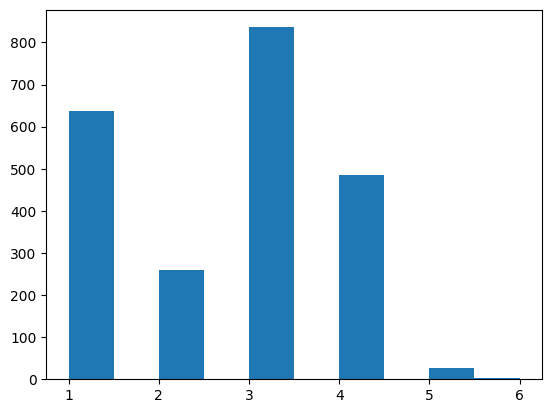

In [16]:
#Degree plot for undirected and unweighted graph
degrees = [G.degree(n) for n in G.nodes()]

plt.hist(degrees)

In [17]:
deg_centrality=nx.degree_centrality(G)
res = {key : round(deg_centrality[key], 3) for key in deg_centrality}
df=pd.DataFrame(res.items(), columns=["Node", "Degree Centrality"])
print(df.sort_values('Degree Centrality',ascending=False))
df.to_csv('Degree_Centrality.csv')

       Node  Degree Centrality
1275    585              0.003
808     457              0.003
276    6738              0.003
2017    946              0.003
1334    604              0.002
...     ...                ...
700    3427              0.000
699    3415              0.000
698    3429              0.000
697    3369              0.000
2247  37079              0.000

[2248 rows x 2 columns]


In [18]:
Closeness_centrality=nx.closeness_centrality(G)
res = {key : round(Closeness_centrality[key], 3) for key in Closeness_centrality}
df=pd.DataFrame(res.items(), columns=["Node", "Closeness Centrality"])
print(df.sort_values('Closeness Centrality',ascending=False))
df.to_csv('Closeness_Centrality.csv')

      Node  Closeness Centrality
164     76                 0.023
211   1049                 0.023
162   1068                 0.023
161     57                 0.023
160     56                 0.023
..     ...                   ...
739  12032                 0.001
721  12058                 0.001
720  12022                 0.001
678    320                 0.000
677    319                 0.000

[2248 rows x 2 columns]


In [19]:
Betweenness_centrality=nx.betweenness_centrality(G)
res = {key : round(Betweenness_centrality[key], 3) for key in Betweenness_centrality}
df=pd.DataFrame(res.items(), columns=["Node", "Betweenness Centrality"])
print(df.sort_values('Betweenness Centrality',ascending=False))
df.to_csv('Betweenness_Centrality.csv')

       Node  Betweenness Centrality
1966  41650                   0.114
1975  41649                   0.114
1995   2250                   0.112
1985  41976                   0.112
1997   2249                   0.110
...     ...                     ...
985   40110                   0.000
984   40104                   0.000
983   41917                   0.000
982    5313                   0.000
2247  37079                   0.000

[2248 rows x 2 columns]


In [20]:
Katz_centrality=nx.katz_centrality(G,alpha=0.05, beta=1.0, max_iter=1000, tol=1e-02, nstart=None, normalized=True, weight=None)
res = {key : round(Katz_centrality[key], 3) for key in Katz_centrality}
df=pd.DataFrame(res.items(), columns=["Node", "Katz Centrality"])
print(df.sort_values('Katz Centrality',ascending=False))
df.to_csv('Katz_Centrality.csv')

       Node  Katz Centrality
1275    585            0.025
2017    946            0.025
276    6738            0.025
808     457            0.025
162    1068            0.024
...     ...              ...
787   37523            0.019
786    1176            0.019
1659    953            0.019
1660    733            0.019
2247  37079            0.019

[2248 rows x 2 columns]


In [21]:
nx.sigma(G)

KeyboardInterrupt: 

In [ ]:
nx.omega(G)

## Observations



1. **High clustering in local neighborhoods** (e.g., residential areas) and **low clustering in main roads or highways**.
2. **Urban grids** lead to higher clustering, especially at intersections where multiple roads meet. These components are strongly connected.
3. **Hierarchical structures** often emerge, with central roads having low clustering and peripheral roads showing more clustering.
4. **Traffic bottlenecks** can be detected by finding intersections with low clustering but high connectivity.